In [ ]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
# Visualization function
def show(tensor,ch=1,size=(28,28),num=16):
  # tensor: 128 x 24

  data = tensor.detach().cpu().view(-1,ch,*size)             # 128 x 1 x 28 x 28
  grid = make_grid(data[:num],nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()


In [ ]:
# setup Main parameters and Hyper parameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr=0.001
loss_fun = nn.BCEWithLogitsLoss()

bs=128
device='cuda'

dataloader = DataLoader(MNIST('.',download=True,transform=transforms.ToTensor()),shuffle=True,batch_size=bs)

100%|██████████| 9912422/9912422 [00:00<00:00, 119767789.12it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 20975877.72it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 50846534.55it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 4614953.67it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
# declare our models

#Generator
def genBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self,z_dim=64,i_dim=784,h_dim=128):
    super().__init__()
    self.gen=nn.Sequential(
        genBlock(z_dim,h_dim),      # 64, 128`
        genBlock(h_dim,h_dim*2),     # 128, 256
        genBlock(h_dim*2,h_dim*4),   # 256, 512
        genBlock(h_dim*4,h_dim*8),   # 512, 1024
        nn.Linear(h_dim*8,i_dim),    # 1024, 784 (28 x 28)
        nn.Sigmoid()
    )
  def forward(self,noise):
    return self.gen(noise)

def gen_noise(number,z_dim):
    return torch.randn(number,z_dim).to(device)

# Discriminator
def discBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.LeakyReLU(0.2)
)

class Discriminator(nn.Module):
  def __init__(self,i_dim=784,h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim,h_dim*4),      # 784, 1024`
        discBlock(h_dim*4,h_dim*2),     # 1024,512
        discBlock(h_dim*2,h_dim),       # 512, 256
        nn.Linear(h_dim,1)             # 256, 1
    )

  def forward(self,image):
    return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt=torch.optim.Adam(gen.parameters(),lr=lr)
disc = Discriminator().to(device)
disc_opt=torch.optim.Adam(disc.parameters(),lr=lr)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

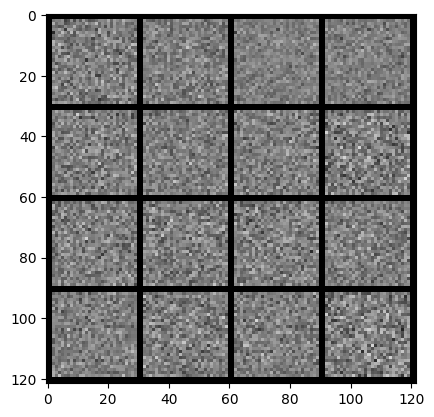

In [ ]:
noise = gen_noise(bs,z_dim)
fake = gen(noise)
show(fake)

In [ ]:
# calculate the loss

#Generator Loss
def calc_gen_loss(loss_func,gen,disc,number,z_dim):
  noise=gen_noise(number,z_dim)
  fake=gen(noise)
  pred=disc(fake)
  targets=torch.ones_like(pred)
  gen_loss=loss_func(pred,targets)

  return gen_loss

def calc_disc_loss(loss_func,gen,disc,number,real,z_dim):
  noise=gen_noise(number,z_dim)
  fake=gen(noise)
  disc_fake=disc(fake.detach())
  disc_fake_targets=torch.zeros_like(disc_fake)
  disk_fake_loss=loss_func(disc_fake,disc_fake_targets)

  disc_real=disc(real)
  disc_real_targets=torch.ones_like(disc_real)
  disc_real_loss=loss_func(disc_real,disc_real_targets)

  disc_loss = (disk_fake_loss + disc_real_loss) / 2

  return disc_loss



  0%|          | 0/469 [00:00<?, ?it/s]

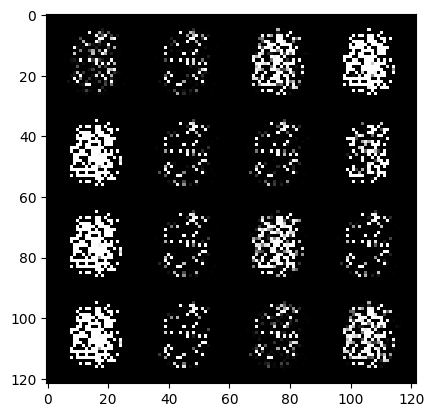

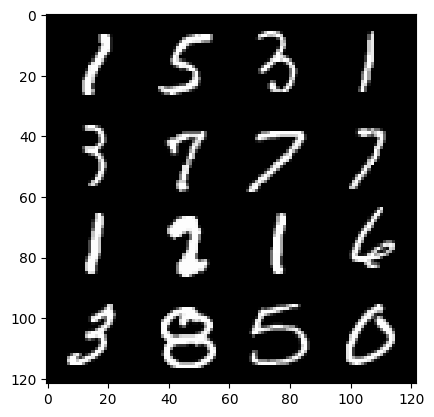

0: step 300 / Gen loss: 1.009131196439267 / disc_loss: 0.07398180074989802


  0%|          | 0/469 [00:00<?, ?it/s]

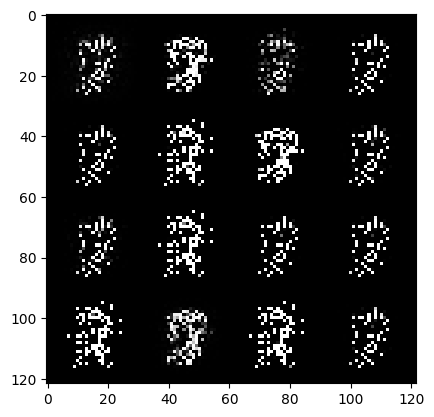

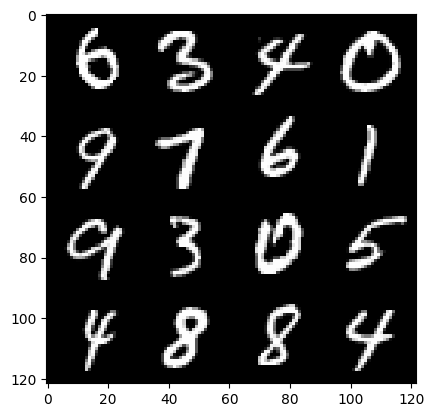

1: step 600 / Gen loss: 1.001294257044792 / disc_loss: 0.03513288278443117


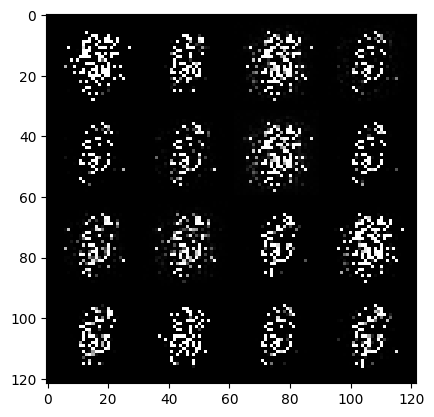

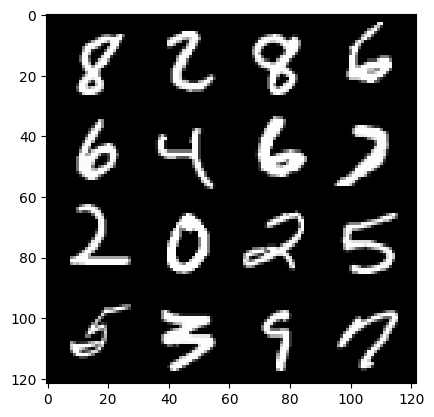

1: step 900 / Gen loss: 0.999336112538974 / disc_loss: 0.026796323567007986


  0%|          | 0/469 [00:00<?, ?it/s]

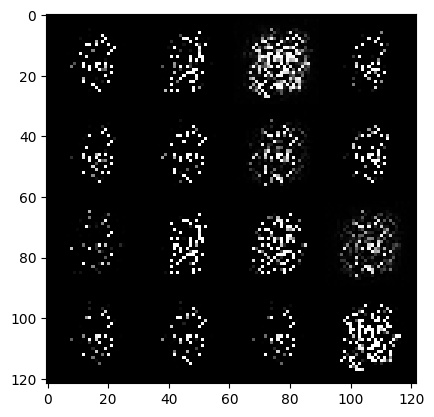

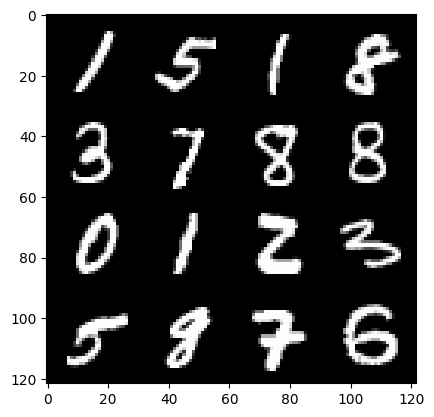

2: step 1200 / Gen loss: 1.0001498979330066 / disc_loss: 0.013230820689350362


  0%|          | 0/469 [00:00<?, ?it/s]

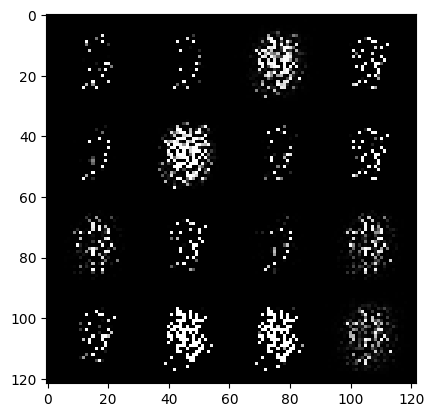

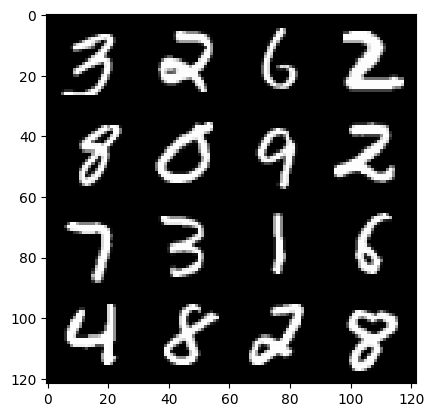

3: step 1500 / Gen loss: 1.000246945818265 / disc_loss: 0.012067527930873127


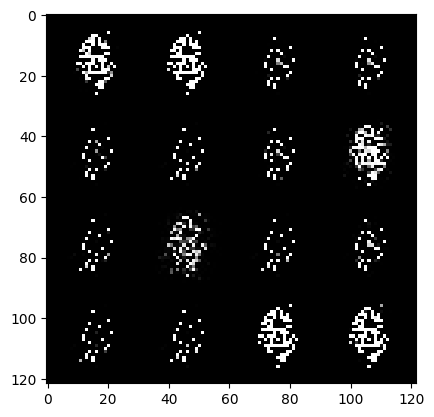

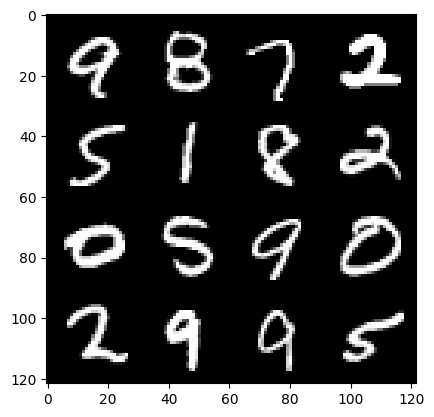

3: step 1800 / Gen loss: 1.0000716308752693 / disc_loss: 0.012070372862120472


  0%|          | 0/469 [00:00<?, ?it/s]

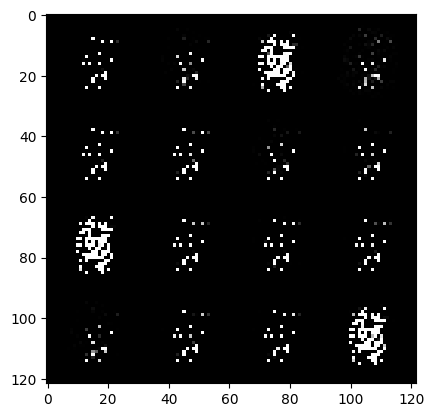

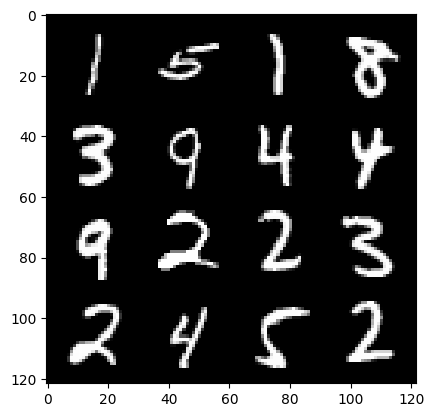

4: step 2100 / Gen loss: 1.000316801667213 / disc_loss: 0.011677006553703297


  0%|          | 0/469 [00:00<?, ?it/s]

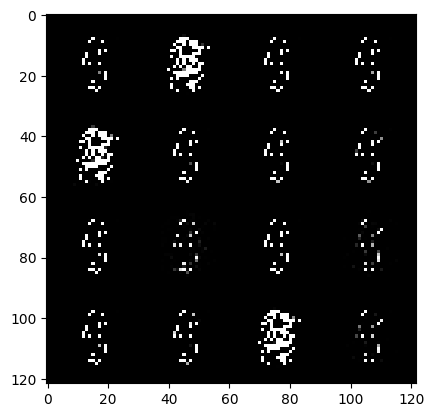

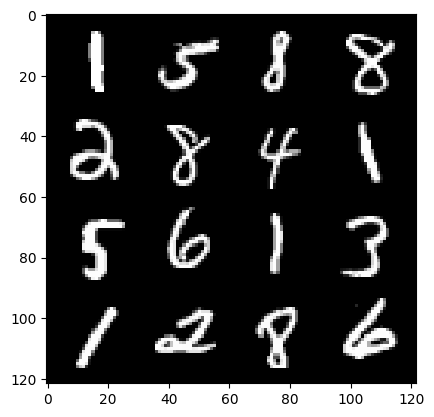

5: step 2400 / Gen loss: 0.9996693319082259 / disc_loss: 0.011000601778117314


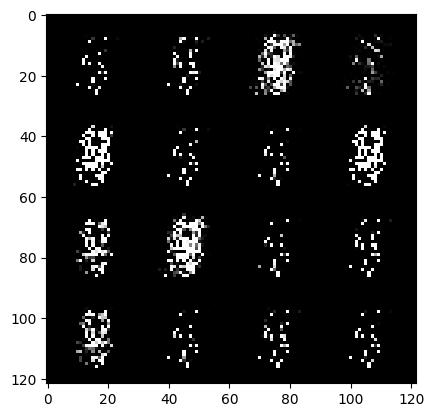

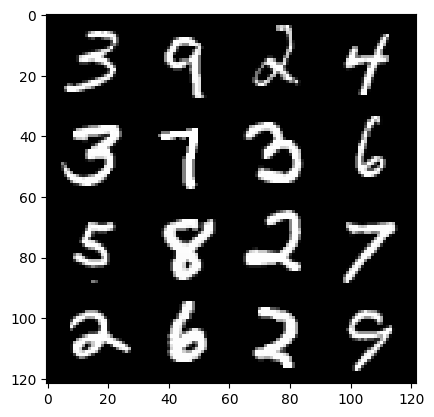

5: step 2700 / Gen loss: 1.0000115571419406 / disc_loss: 0.010905455079240105


  0%|          | 0/469 [00:00<?, ?it/s]

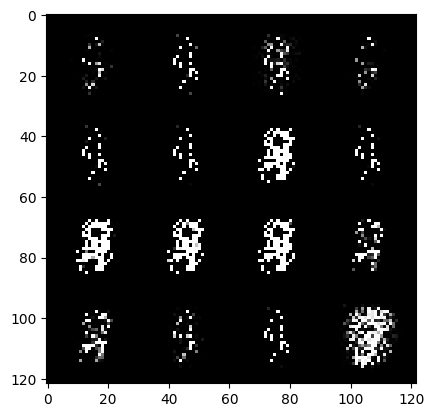

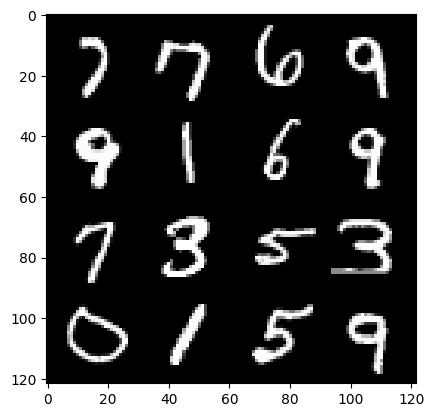

6: step 3000 / Gen loss: 0.999792536298434 / disc_loss: 0.008054556321973605


  0%|          | 0/469 [00:00<?, ?it/s]

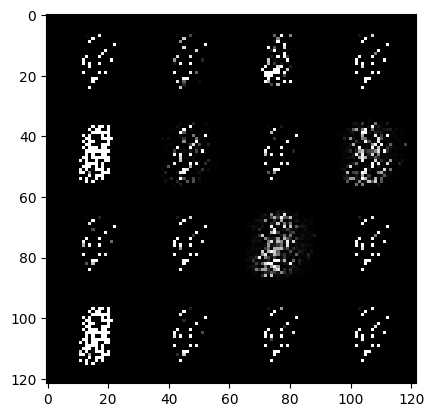

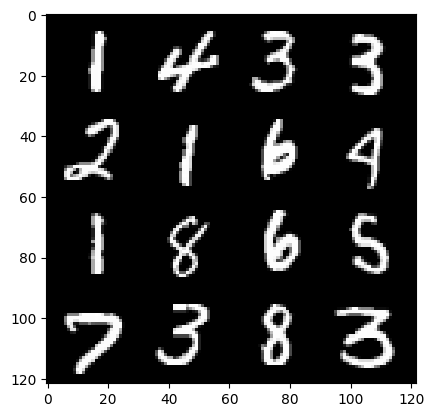

7: step 3300 / Gen loss: 0.9999676557381946 / disc_loss: 0.0077800570746573315


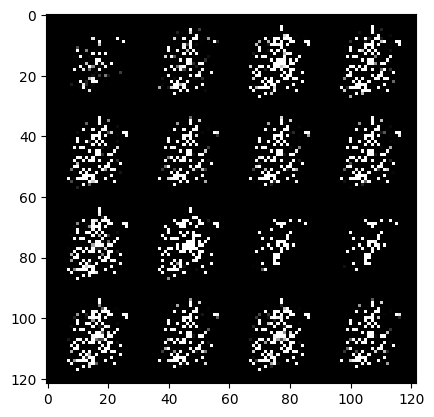

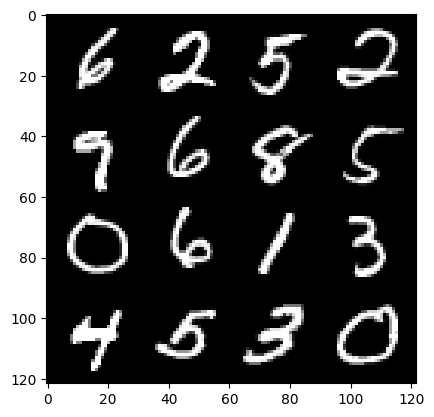

7: step 3600 / Gen loss: 0.9971713205178577 / disc_loss: 0.022509595050166035


  0%|          | 0/469 [00:00<?, ?it/s]

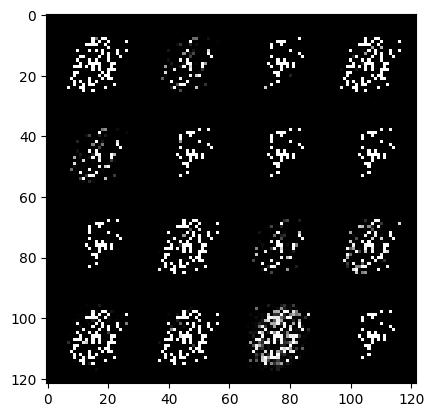

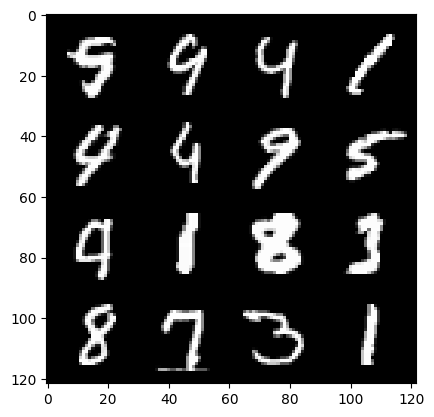

8: step 3900 / Gen loss: 1.0000187851985294 / disc_loss: 0.008815836298745133


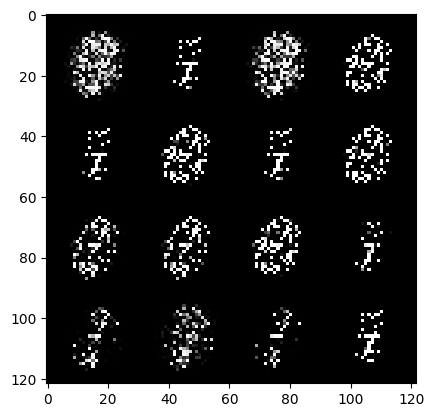

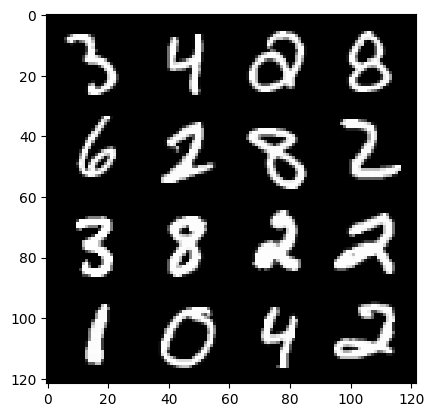

8: step 4200 / Gen loss: 1.0001585179567336 / disc_loss: 0.00933966513567914


  0%|          | 0/469 [00:00<?, ?it/s]

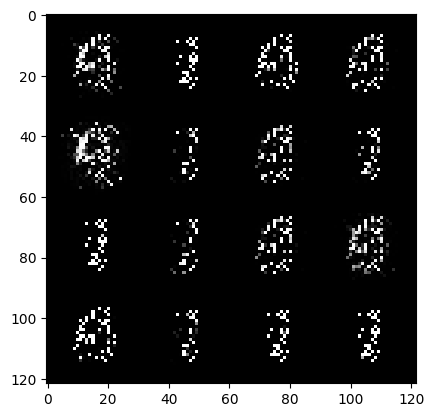

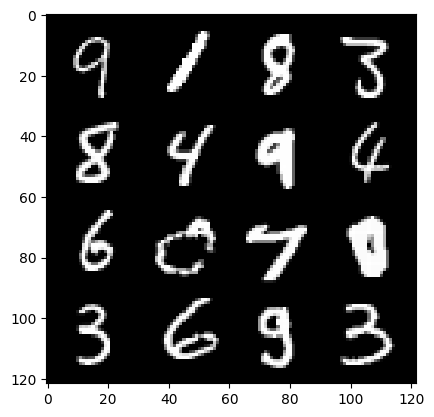

9: step 4500 / Gen loss: 1.000232282280922 / disc_loss: 0.00560124607368683


  0%|          | 0/469 [00:00<?, ?it/s]

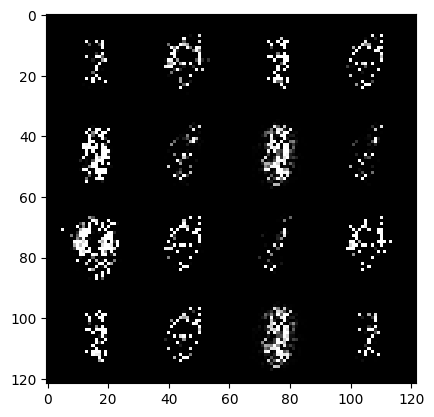

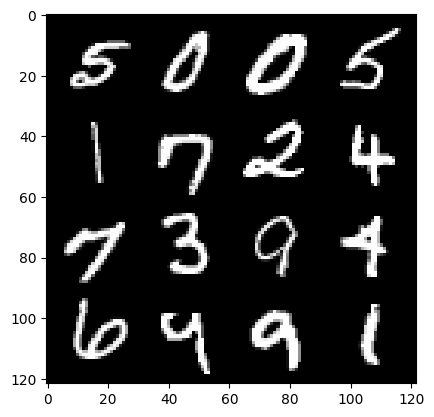

10: step 4800 / Gen loss: 1.0000341665744776 / disc_loss: 0.006871366359991951


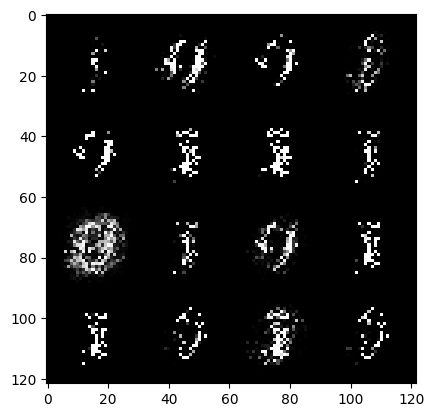

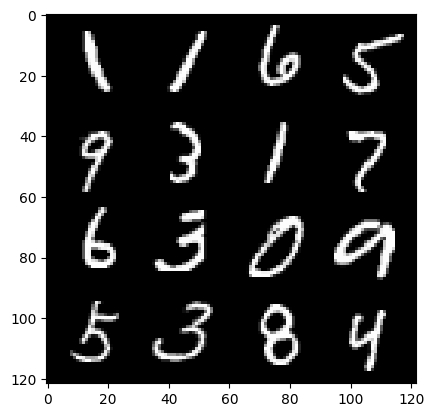

10: step 5100 / Gen loss: 1.0004006411631905 / disc_loss: 0.007907299133172882


  0%|          | 0/469 [00:00<?, ?it/s]

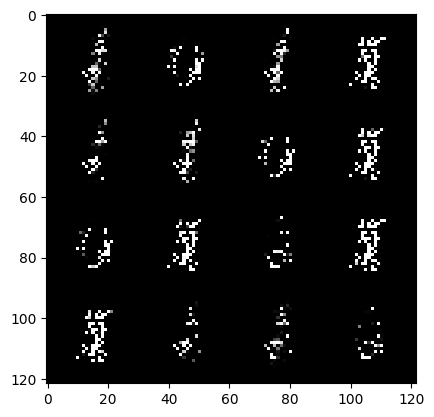

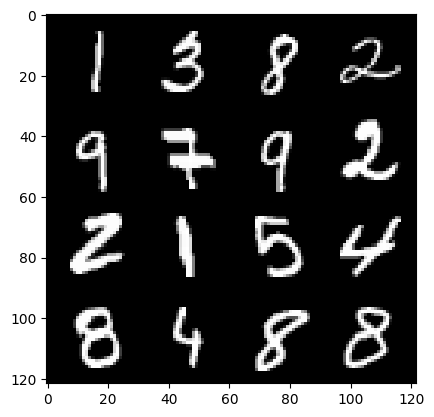

11: step 5400 / Gen loss: 0.9999454939365386 / disc_loss: 0.009427962714495763


  0%|          | 0/469 [00:00<?, ?it/s]

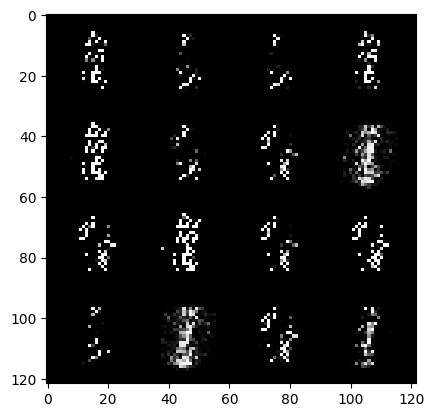

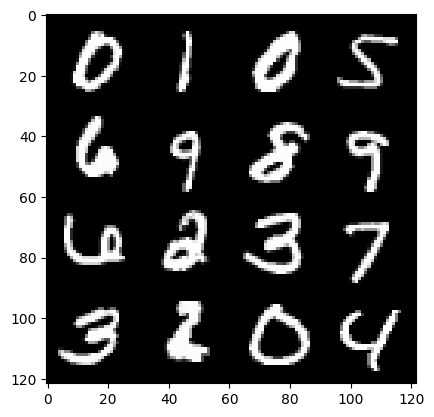

12: step 5700 / Gen loss: 1.000098668336868 / disc_loss: 0.006773640894486263


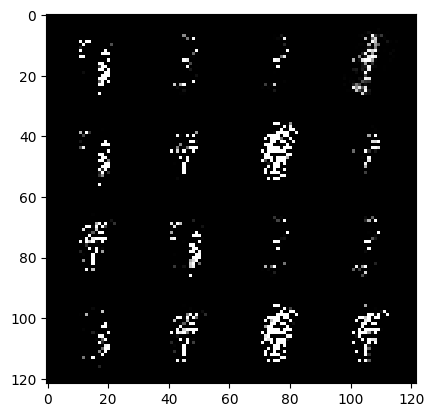

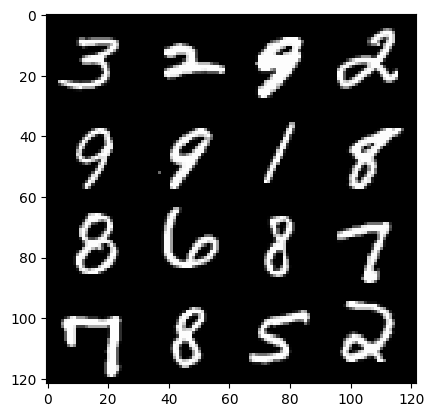

12: step 6000 / Gen loss: 1.0000673685471213 / disc_loss: 0.009358867742121215


  0%|          | 0/469 [00:00<?, ?it/s]

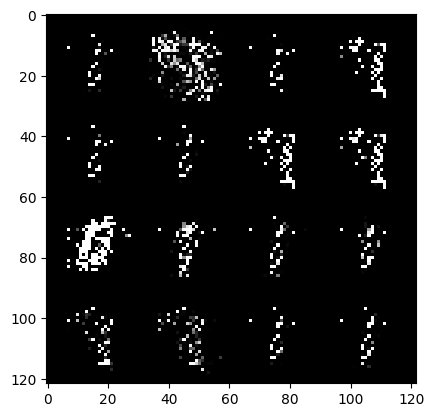

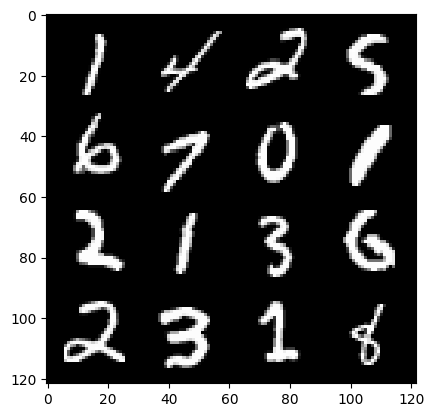

13: step 6300 / Gen loss: 1.0005122174819303 / disc_loss: 0.015015356474711245


  0%|          | 0/469 [00:00<?, ?it/s]

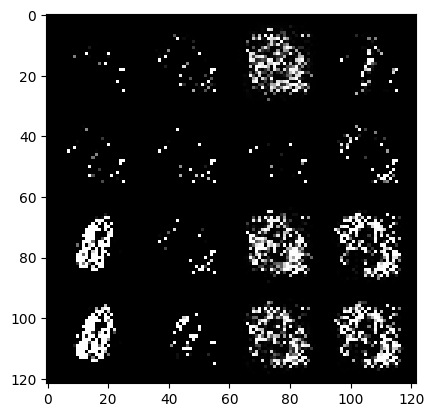

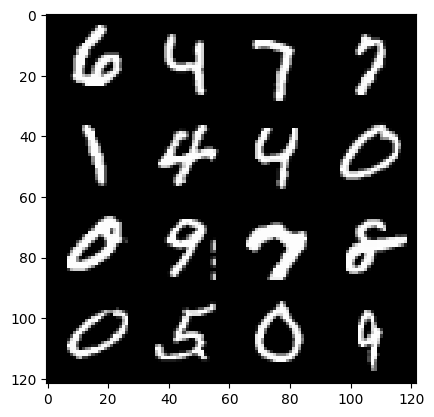

14: step 6600 / Gen loss: 0.9980634987354277 / disc_loss: 0.01734582425172751


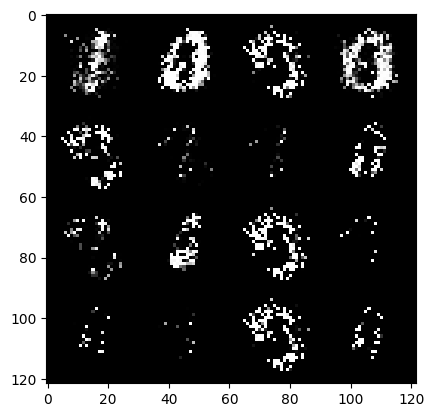

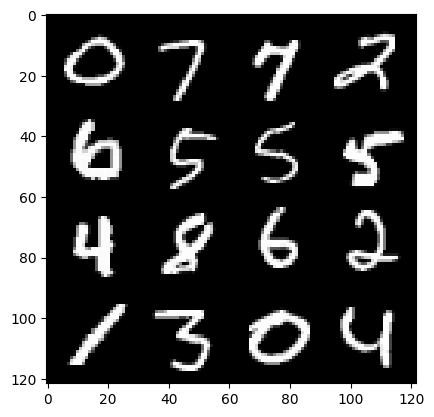

14: step 6900 / Gen loss: 0.9999263187249506 / disc_loss: 0.008715398401642843


  0%|          | 0/469 [00:00<?, ?it/s]

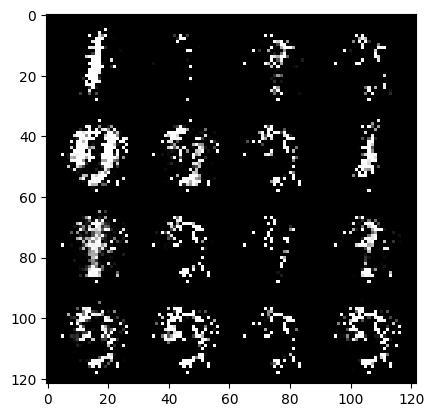

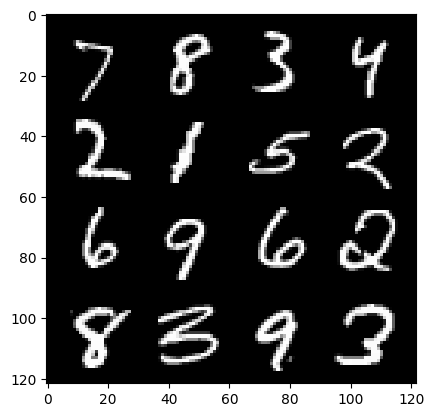

15: step 7200 / Gen loss: 0.9995533158381785 / disc_loss: 0.010555549535589912


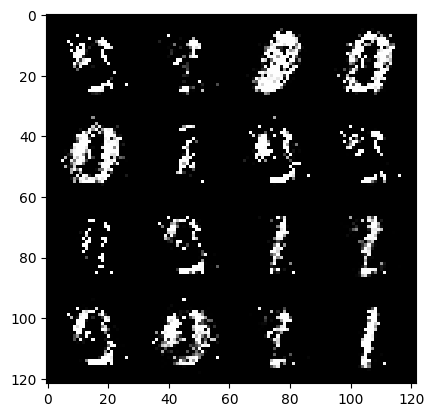

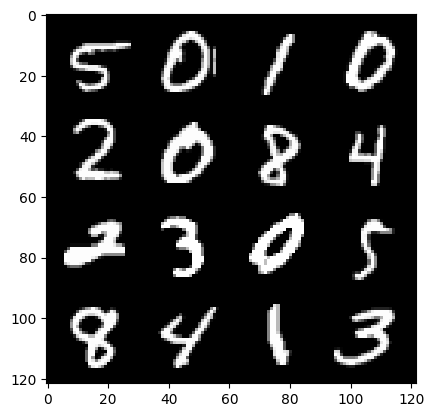

15: step 7500 / Gen loss: 0.9996581333875658 / disc_loss: 0.009038723828659091


  0%|          | 0/469 [00:00<?, ?it/s]

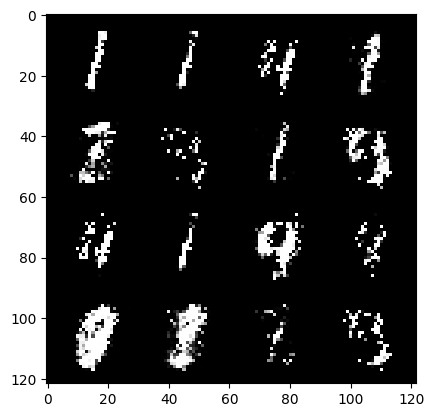

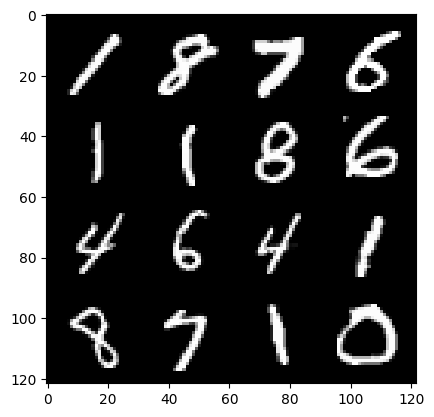

16: step 7800 / Gen loss: 0.9984791121880219 / disc_loss: 0.018110908400267373


  0%|          | 0/469 [00:00<?, ?it/s]

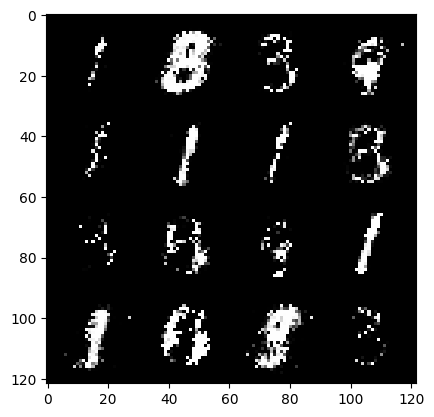

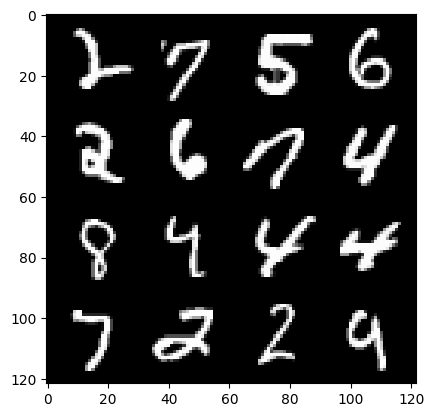

17: step 8100 / Gen loss: 0.9982112387816116 / disc_loss: 0.015406530326387525


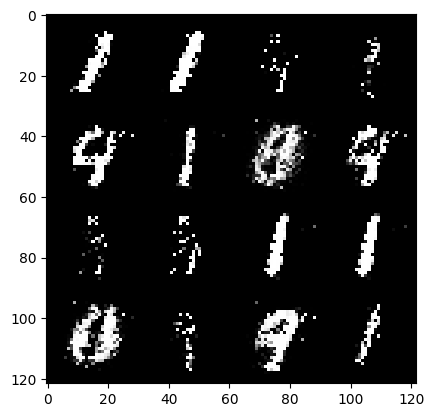

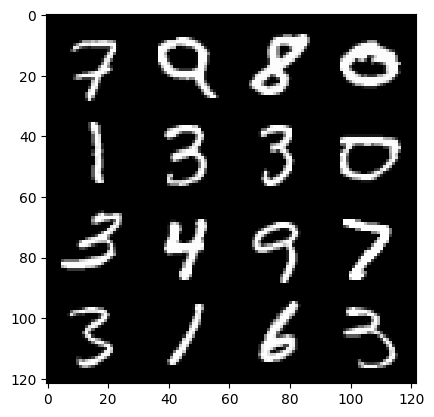

17: step 8400 / Gen loss: 0.9978913982709252 / disc_loss: 0.013775846573213735


  0%|          | 0/469 [00:00<?, ?it/s]

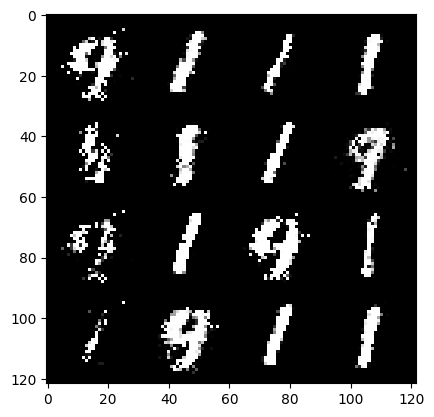

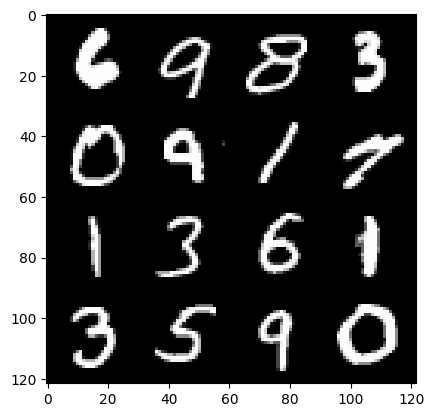

18: step 8700 / Gen loss: 0.9962926052014041 / disc_loss: 0.022626866224842758


  0%|          | 0/469 [00:00<?, ?it/s]

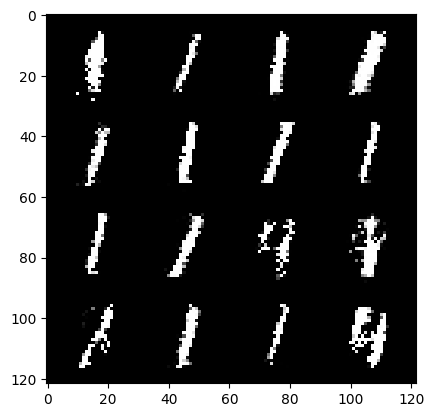

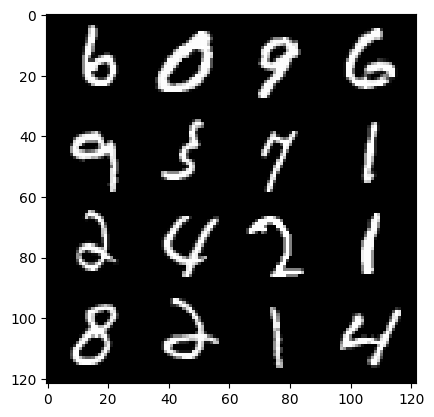

19: step 9000 / Gen loss: 0.9950528838237127 / disc_loss: 0.022015896321584787


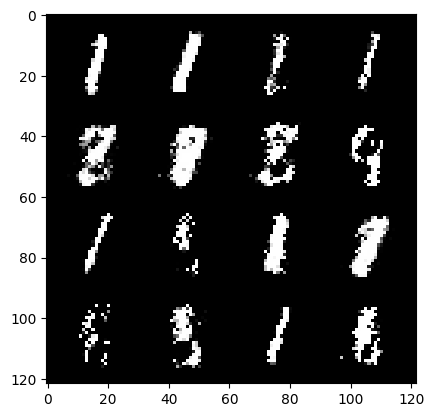

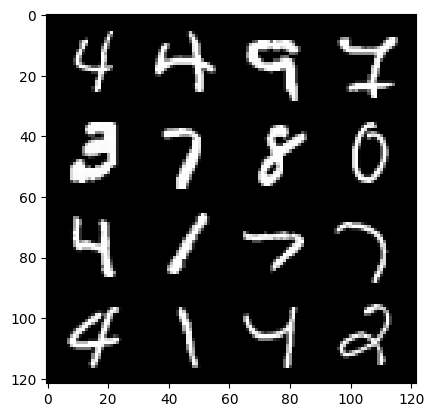

19: step 9300 / Gen loss: 0.9947349200646077 / disc_loss: 0.024416963226782783


  0%|          | 0/469 [00:00<?, ?it/s]

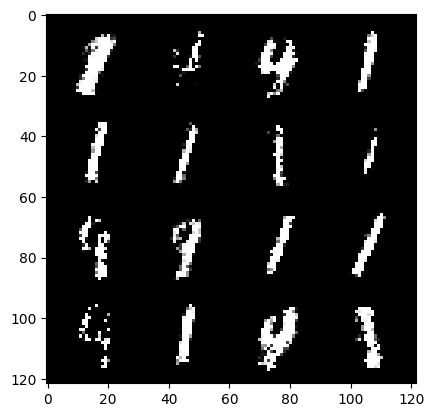

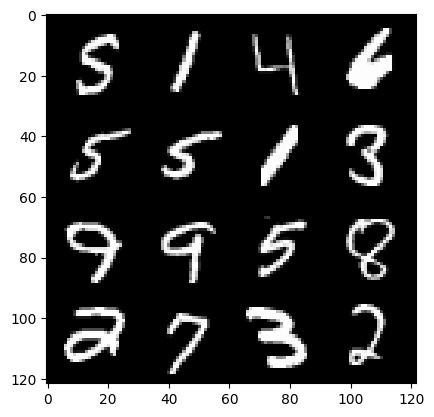

20: step 9600 / Gen loss: 0.9942619979381557 / disc_loss: 0.02441533194854857


  0%|          | 0/469 [00:00<?, ?it/s]

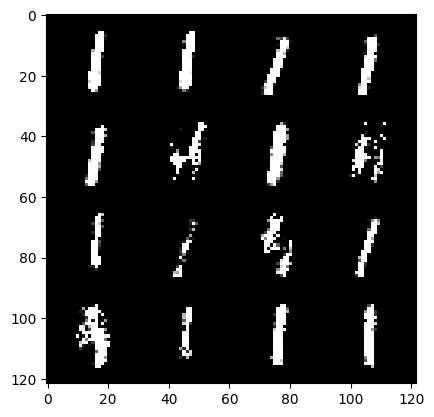

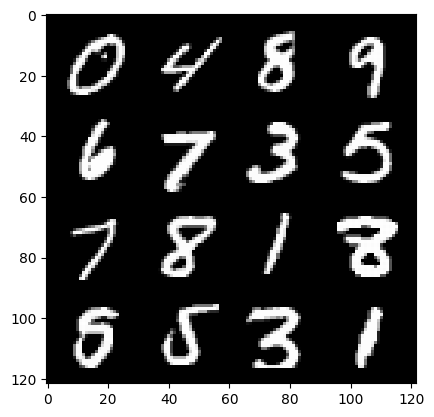

21: step 9900 / Gen loss: 0.9935399766763056 / disc_loss: 0.028630283121019583


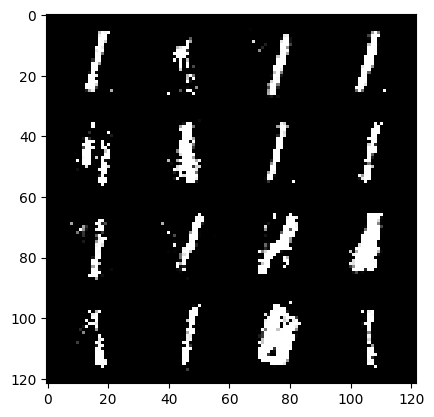

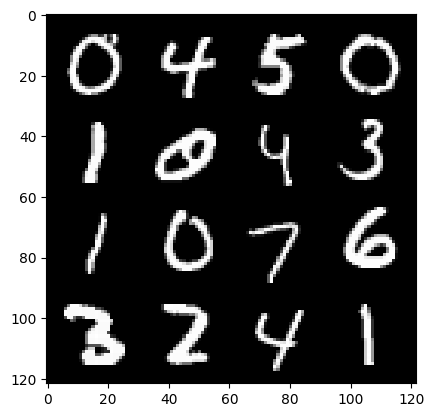

21: step 10200 / Gen loss: 0.9912551722923914 / disc_loss: 0.030992077728733414


  0%|          | 0/469 [00:00<?, ?it/s]

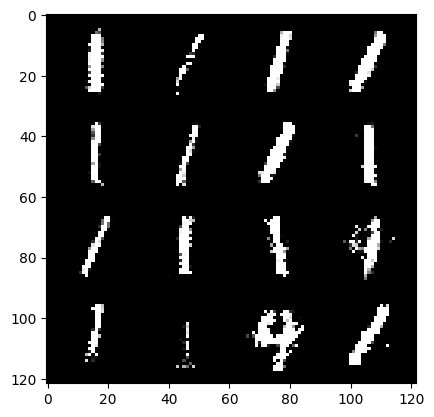

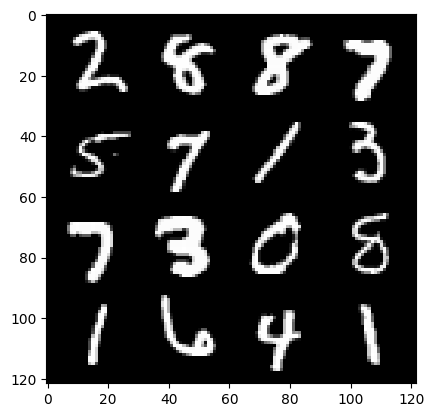

22: step 10500 / Gen loss: 0.9923302080233896 / disc_loss: 0.03190688446785013


  0%|          | 0/469 [00:00<?, ?it/s]

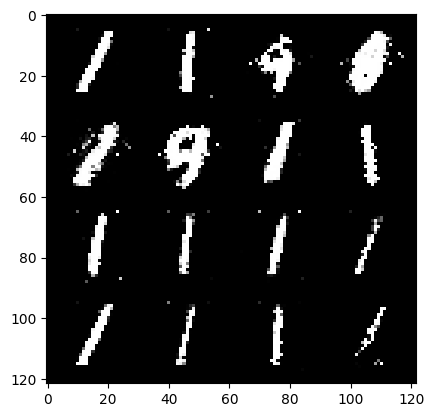

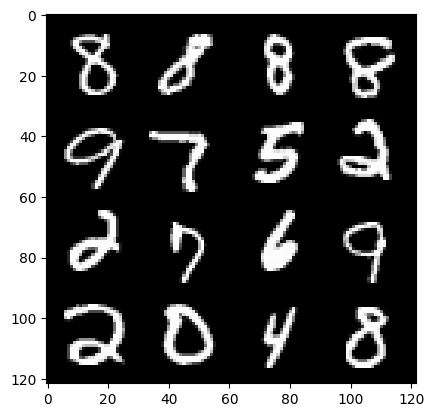

23: step 10800 / Gen loss: 0.991366559664408 / disc_loss: 0.03476774241154391


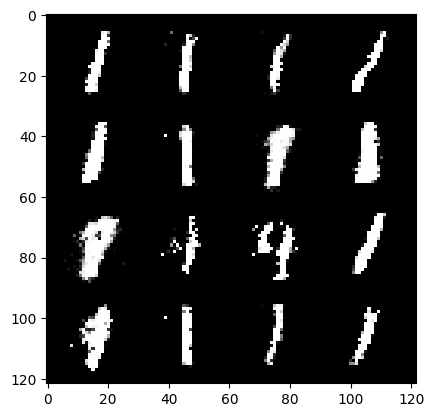

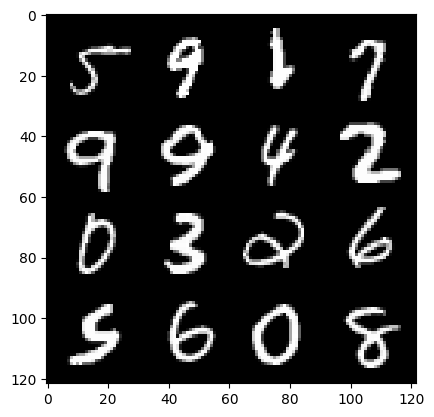

23: step 11100 / Gen loss: 0.9919840679566069 / disc_loss: 0.03294287562991182


  0%|          | 0/469 [00:00<?, ?it/s]

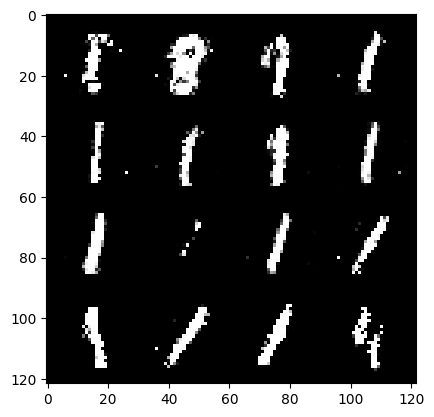

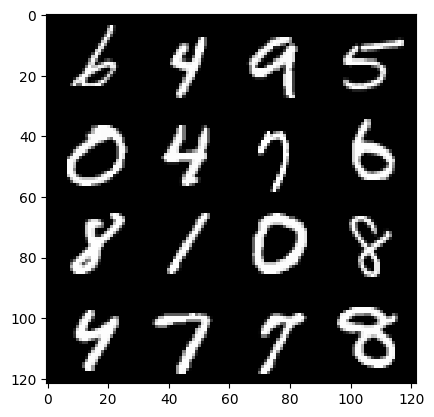

24: step 11400 / Gen loss: 0.9928044366836549 / disc_loss: 0.028038158281706277


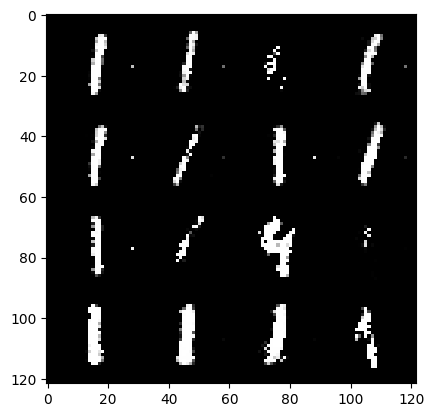

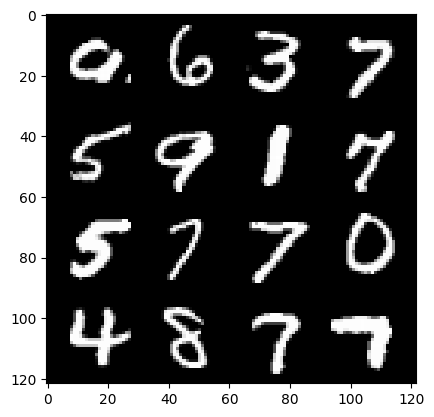

24: step 11700 / Gen loss: 0.9922694446643199 / disc_loss: 0.03031060784434281


  0%|          | 0/469 [00:00<?, ?it/s]

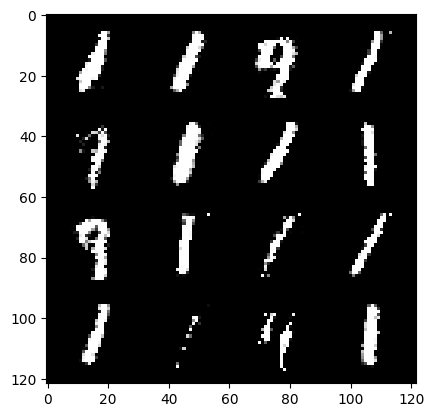

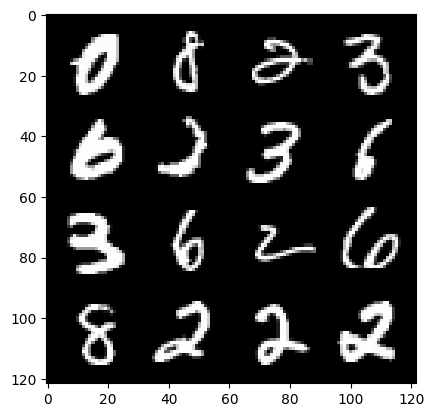

25: step 12000 / Gen loss: 0.9933266492684685 / disc_loss: 0.027887786310166113


  0%|          | 0/469 [00:00<?, ?it/s]

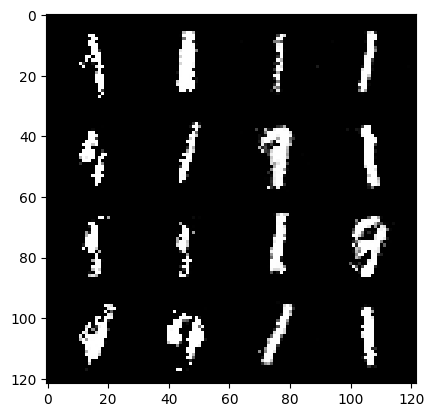

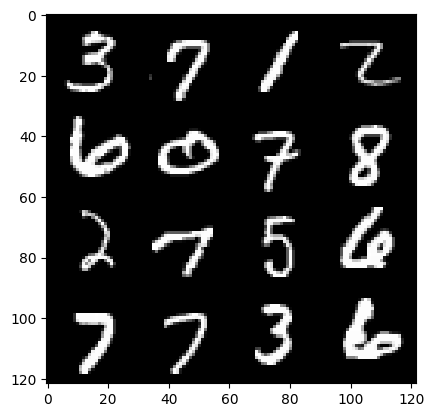

26: step 12300 / Gen loss: 0.9941166329383849 / disc_loss: 0.024340508628326152


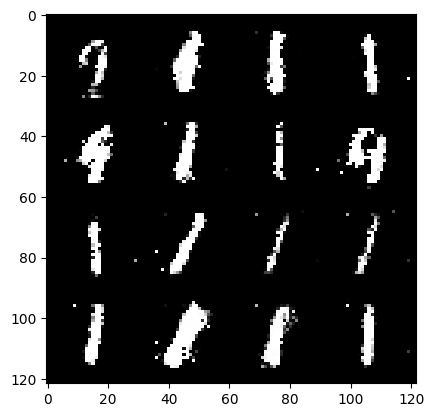

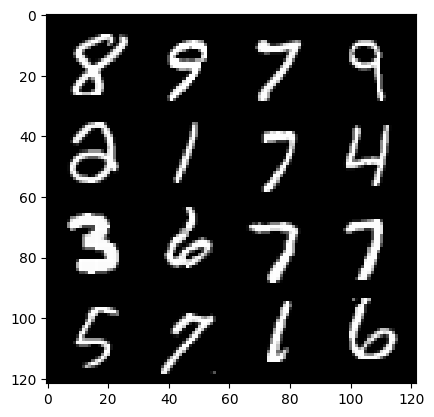

26: step 12600 / Gen loss: 0.9941676976283395 / disc_loss: 0.027955641082177542


  0%|          | 0/469 [00:00<?, ?it/s]

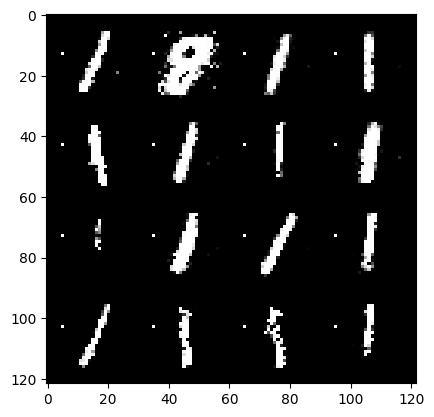

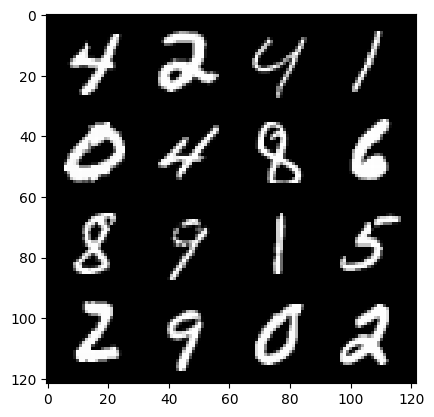

27: step 12900 / Gen loss: 0.9931017714738838 / disc_loss: 0.03318649166263641


  0%|          | 0/469 [00:00<?, ?it/s]

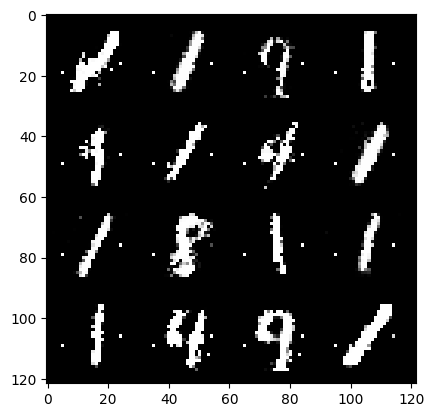

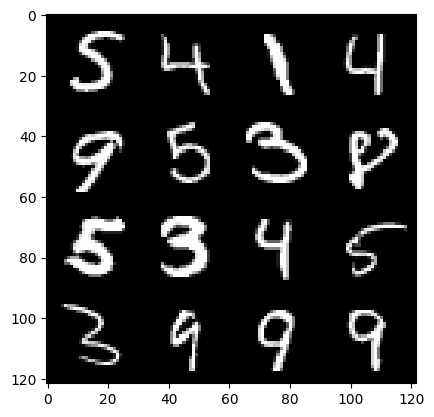

28: step 13200 / Gen loss: 0.9927150134245557 / disc_loss: 0.0317247652557368


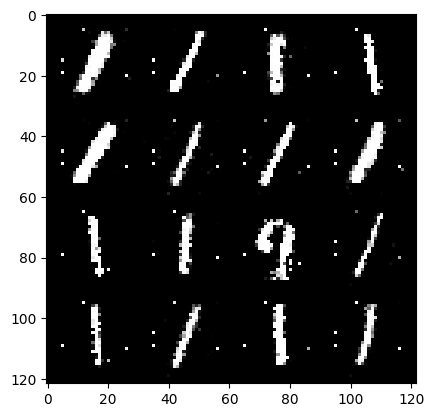

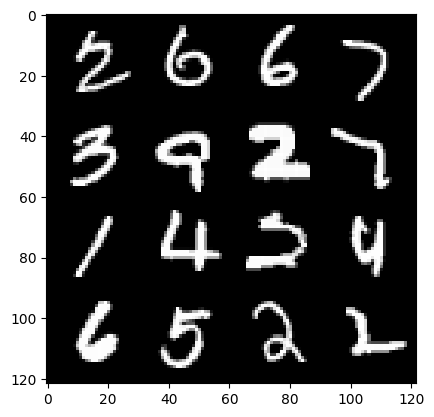

28: step 13500 / Gen loss: 0.9997709769010544 / disc_loss: 0.00788493004006644


  0%|          | 0/469 [00:00<?, ?it/s]

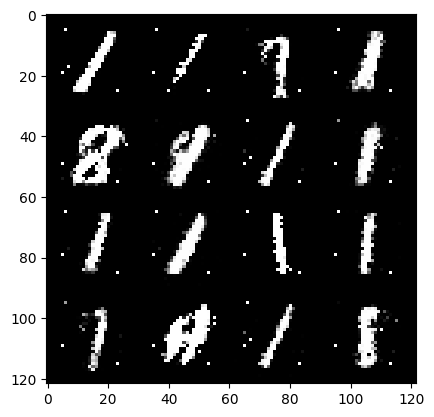

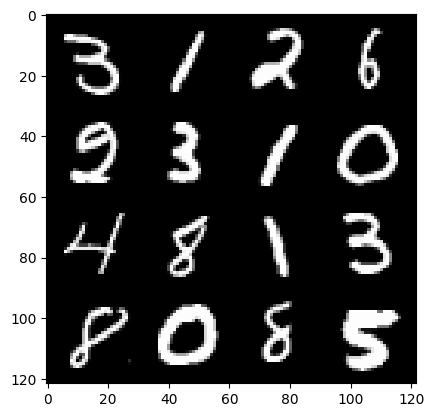

29: step 13800 / Gen loss: 0.9999288819233573 / disc_loss: 0.0053258013422600925


  0%|          | 0/469 [00:00<?, ?it/s]

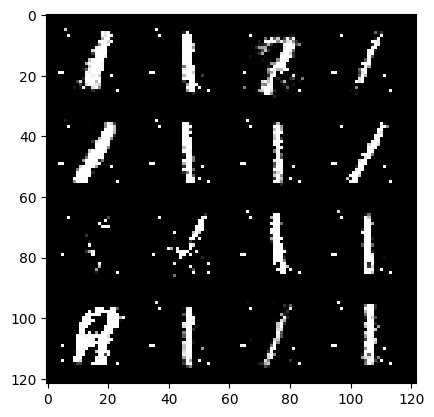

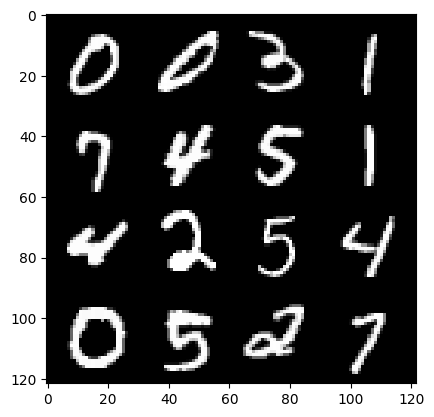

30: step 14100 / Gen loss: 0.999871748685837 / disc_loss: 0.005003719202165184


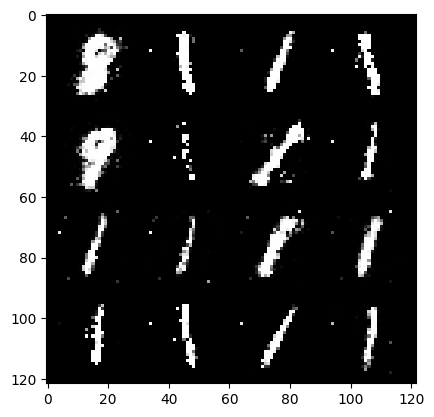

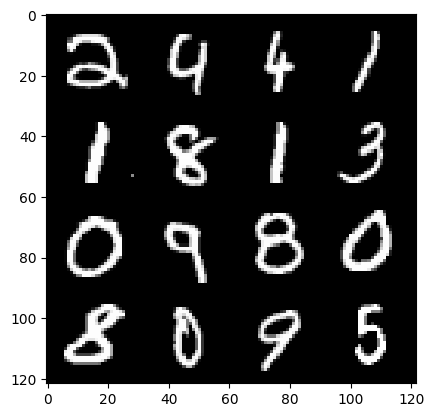

30: step 14400 / Gen loss: 0.9957050128777827 / disc_loss: 0.017804622785188257


  0%|          | 0/469 [00:00<?, ?it/s]

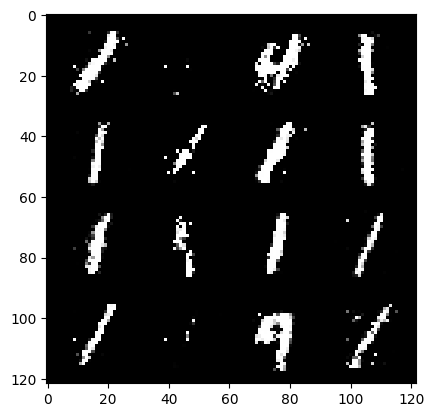

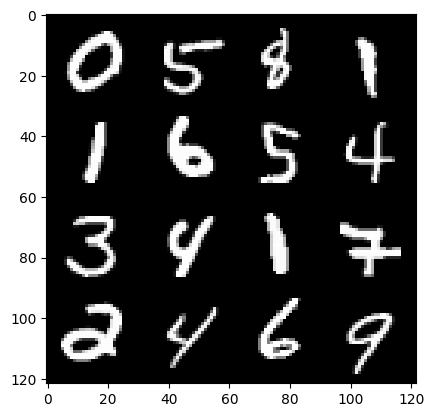

31: step 14700 / Gen loss: 0.9913499897718432 / disc_loss: 0.04599310092317564


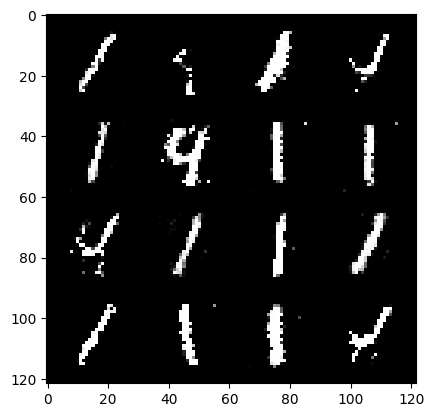

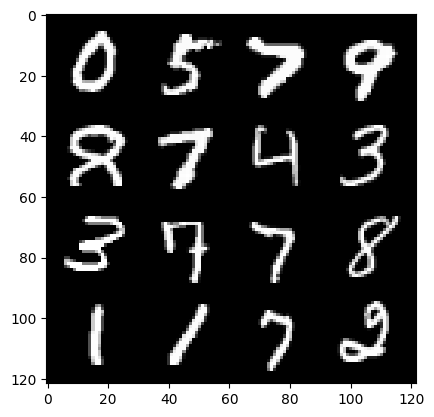

31: step 15000 / Gen loss: 0.9874999143679939 / disc_loss: 0.041602664257710184


  0%|          | 0/469 [00:00<?, ?it/s]

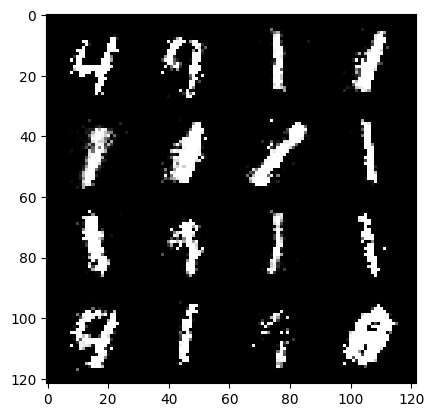

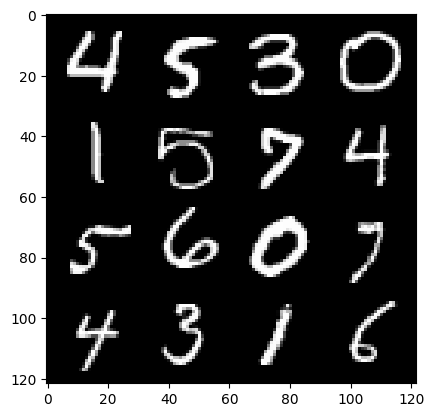

32: step 15300 / Gen loss: 0.9865806655089059 / disc_loss: 0.047361756640796886


  0%|          | 0/469 [00:00<?, ?it/s]

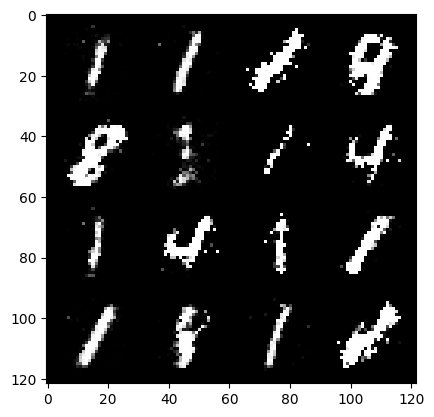

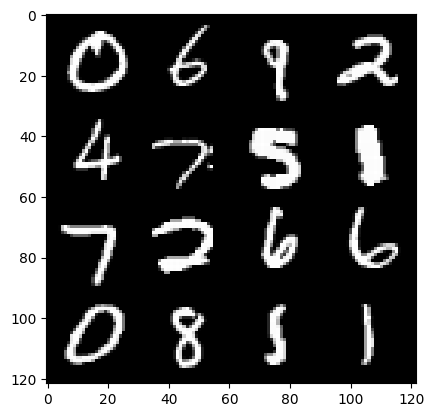

33: step 15600 / Gen loss: 0.9879504889249796 / disc_loss: 0.0423959063924849


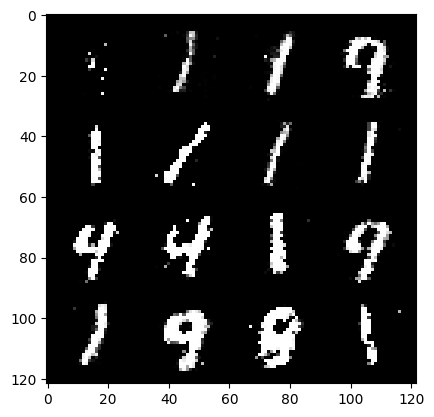

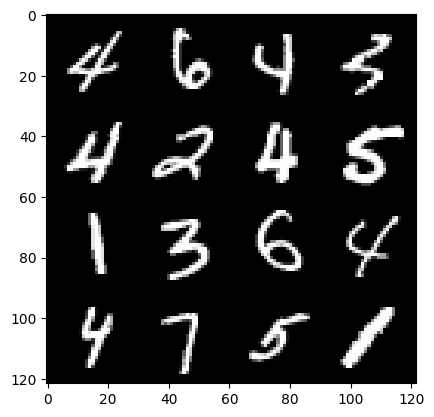

33: step 15900 / Gen loss: 0.9883921796083456 / disc_loss: 0.0403440547455102


  0%|          | 0/469 [00:00<?, ?it/s]

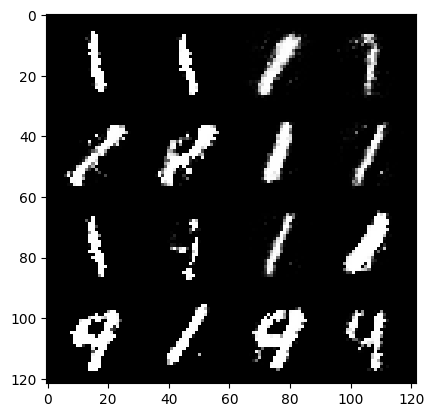

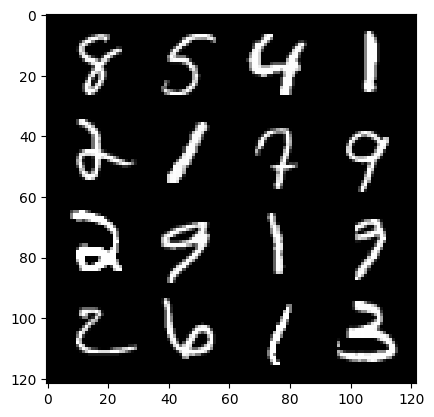

34: step 16200 / Gen loss: 0.9866207341353096 / disc_loss: 0.053468421914925165


  0%|          | 0/469 [00:00<?, ?it/s]

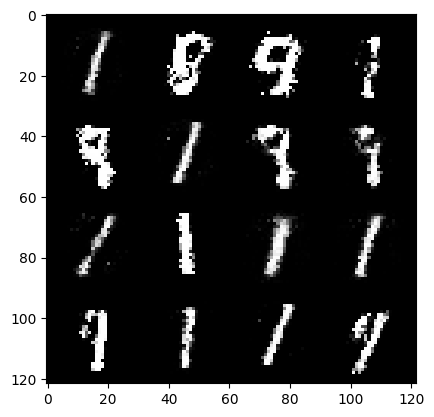

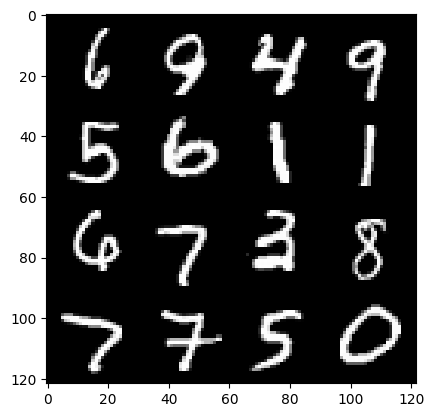

35: step 16500 / Gen loss: 0.9840126967430108 / disc_loss: 0.0564971632882953


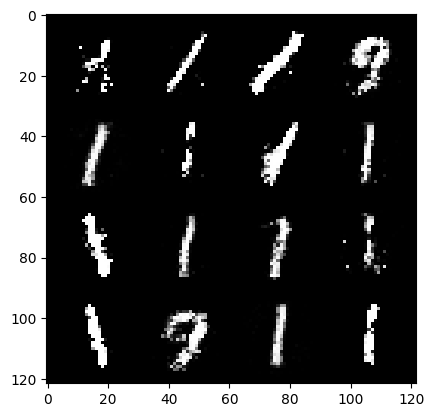

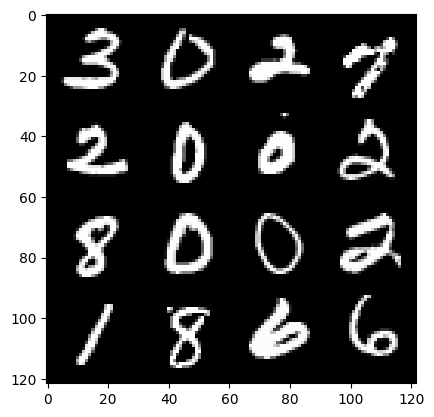

35: step 16800 / Gen loss: 0.9830923249324162 / disc_loss: 0.06174637910599514


  0%|          | 0/469 [00:00<?, ?it/s]

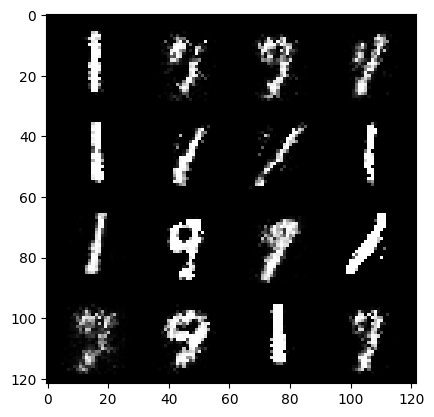

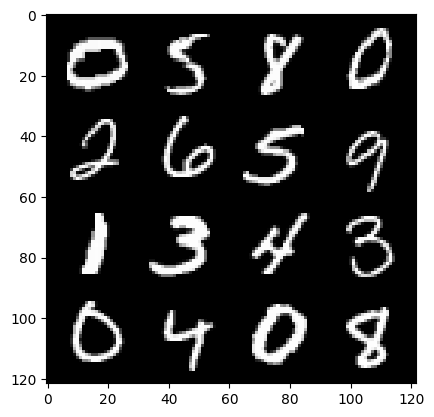

36: step 17100 / Gen loss: 0.9809065969785055 / disc_loss: 0.0721624270578225


  0%|          | 0/469 [00:00<?, ?it/s]

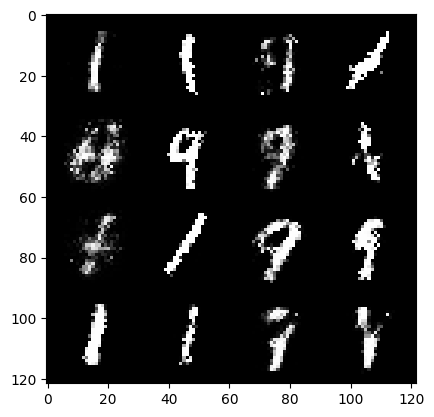

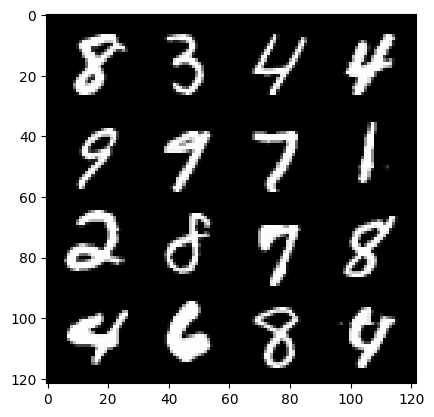

37: step 17400 / Gen loss: 0.9807587510347364 / disc_loss: 0.06495494774853189


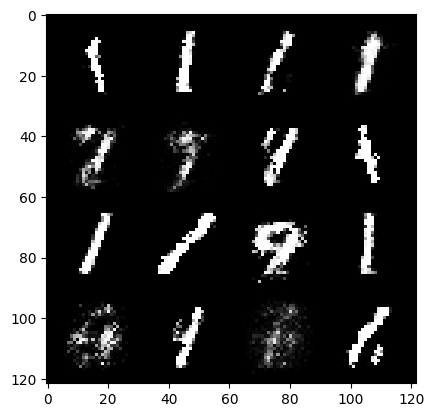

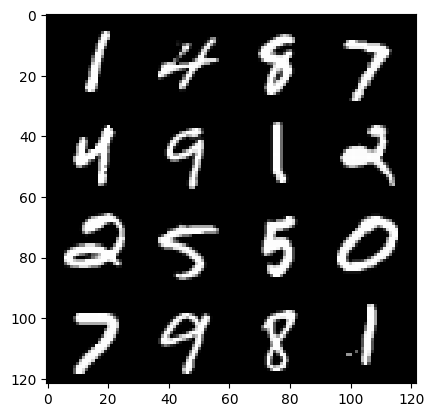

37: step 17700 / Gen loss: 0.9800317049026493 / disc_loss: 0.07084943566471338


  0%|          | 0/469 [00:00<?, ?it/s]

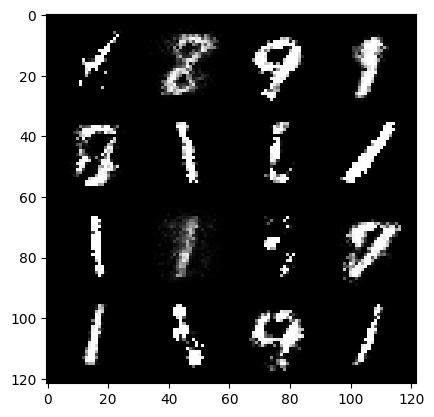

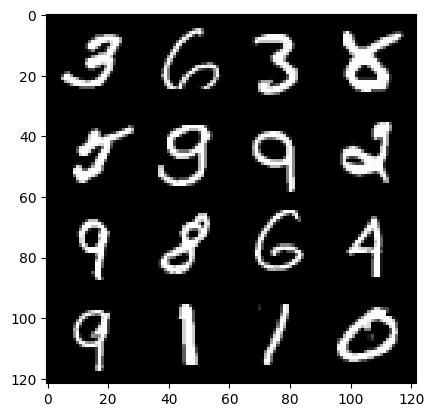

38: step 18000 / Gen loss: 0.9780788054068885 / disc_loss: 0.06846855776384472


  0%|          | 0/469 [00:00<?, ?it/s]

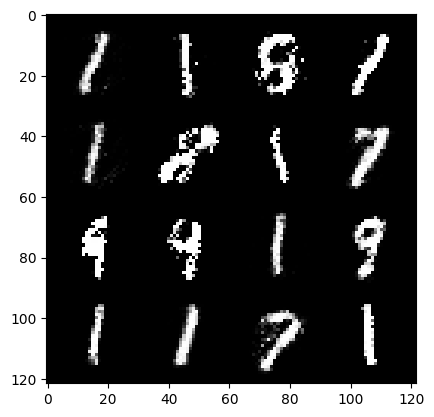

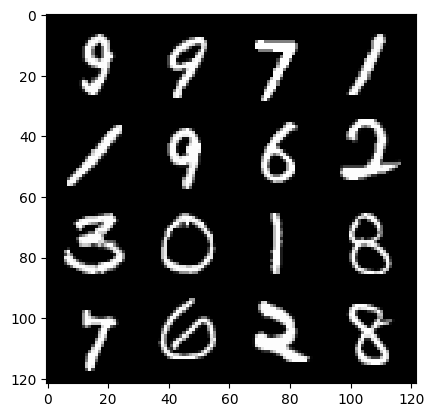

39: step 18300 / Gen loss: 0.9797204621632896 / disc_loss: 0.06931482728570701


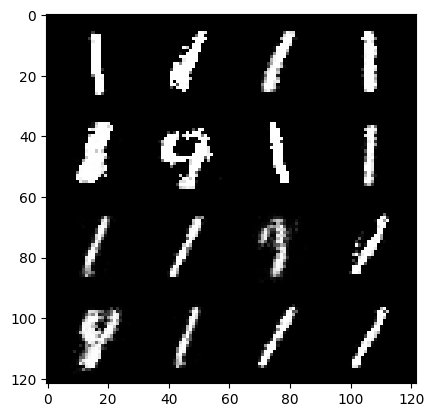

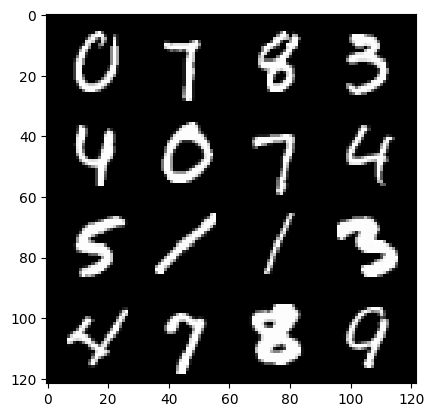

39: step 18600 / Gen loss: 0.9783904268344249 / disc_loss: 0.06769413306067386


  0%|          | 0/469 [00:00<?, ?it/s]

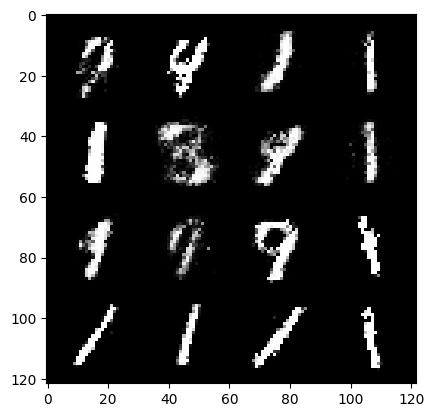

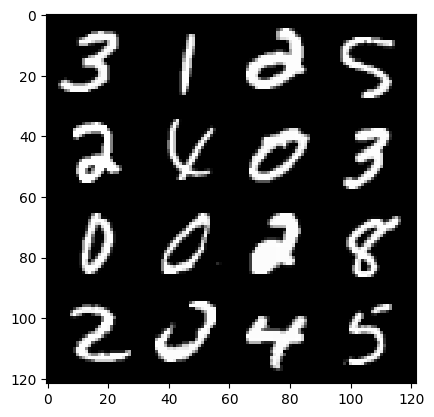

40: step 18900 / Gen loss: 0.9807342312733333 / disc_loss: 0.07258761895199616


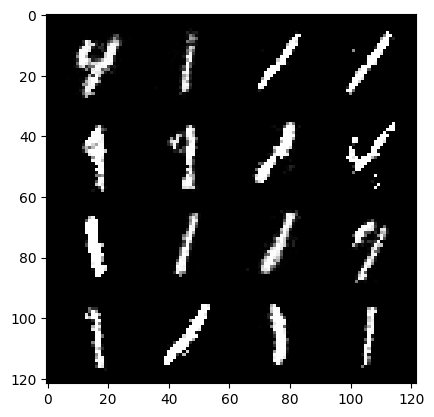

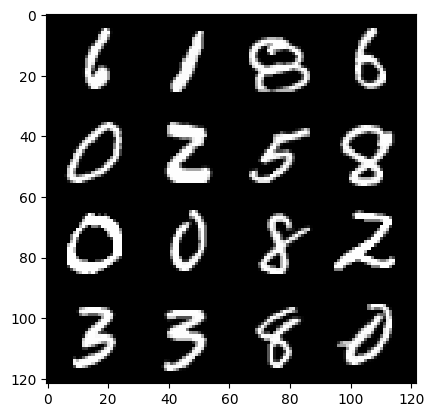

40: step 19200 / Gen loss: 0.9772932843367256 / disc_loss: 0.07665306540826948


  0%|          | 0/469 [00:00<?, ?it/s]

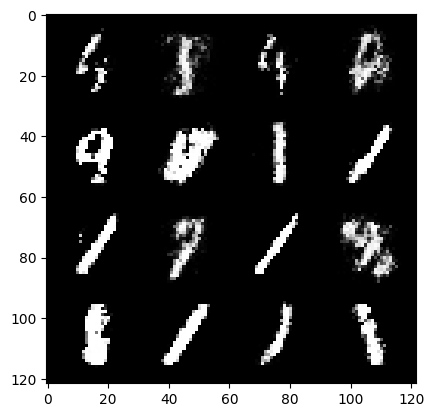

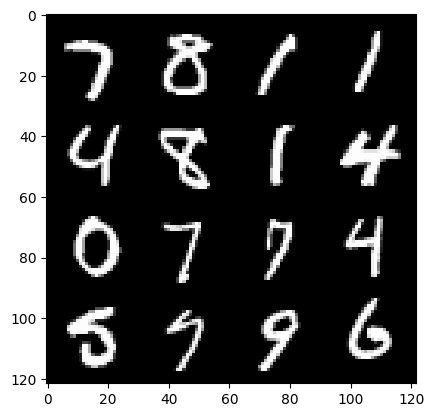

41: step 19500 / Gen loss: 0.9760585922002794 / disc_loss: 0.07427018919338786


  0%|          | 0/469 [00:00<?, ?it/s]

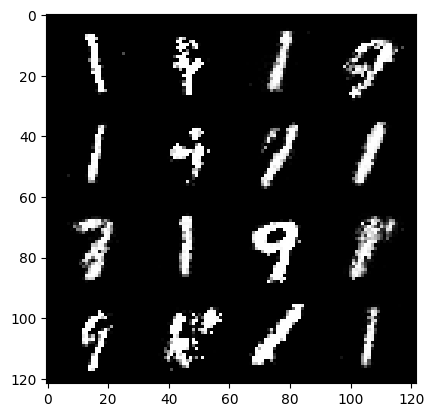

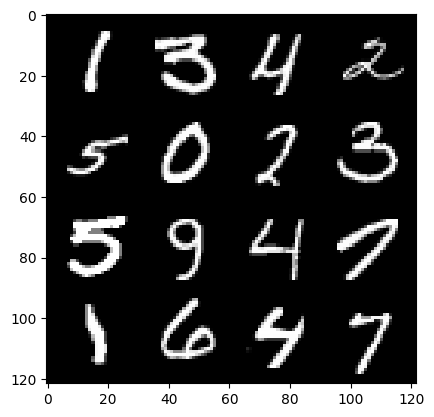

42: step 19800 / Gen loss: 0.9682596556345623 / disc_loss: 0.0908898484520614


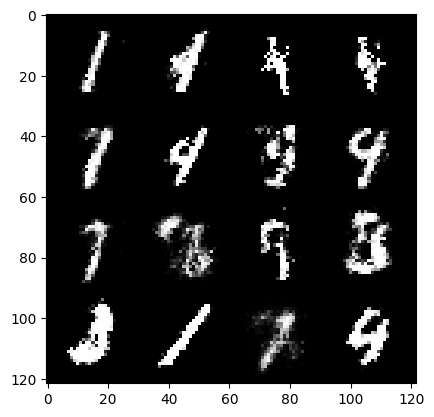

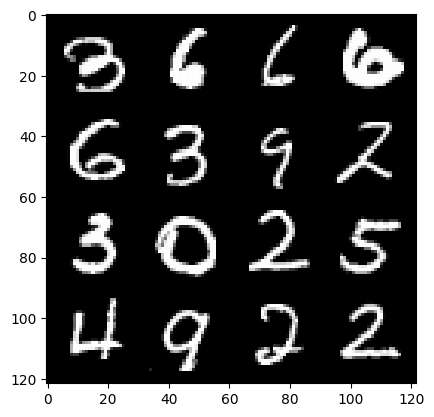

42: step 20100 / Gen loss: 0.9701173351208364 / disc_loss: 0.08245994787663226


  0%|          | 0/469 [00:00<?, ?it/s]

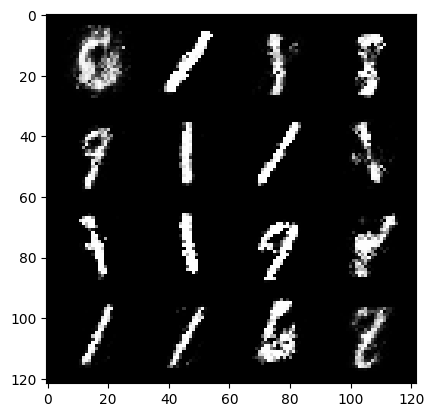

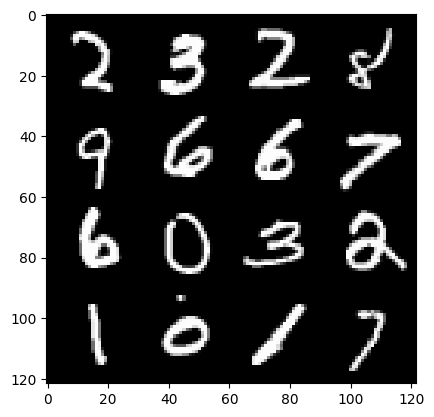

43: step 20400 / Gen loss: 0.9727102249860766 / disc_loss: 0.07511264964938161


  0%|          | 0/469 [00:00<?, ?it/s]

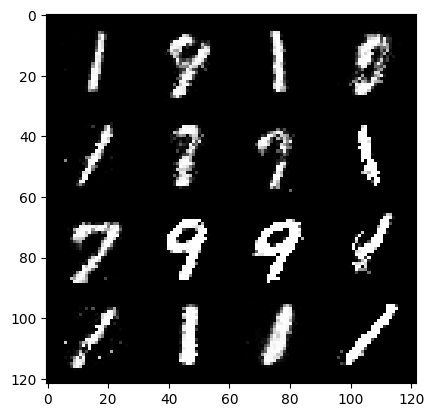

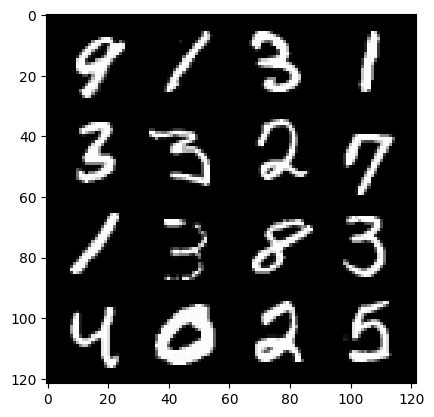

44: step 20700 / Gen loss: 0.9685837654272713 / disc_loss: 0.0850559495016932


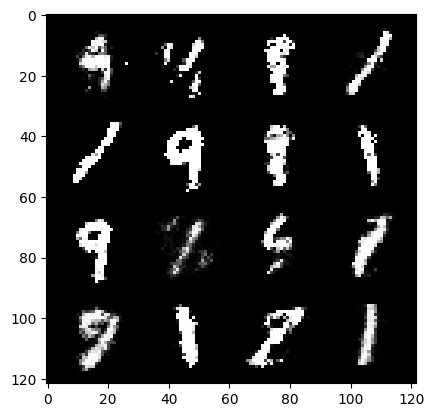

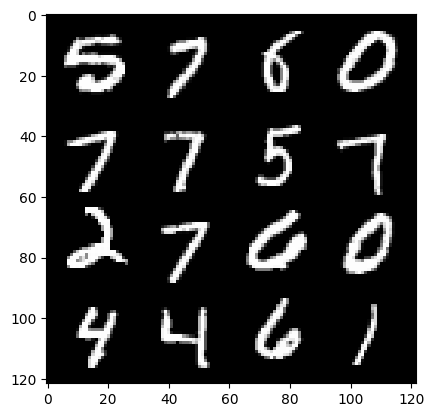

44: step 21000 / Gen loss: 0.9686289421717322 / disc_loss: 0.0895427625377973


  0%|          | 0/469 [00:00<?, ?it/s]

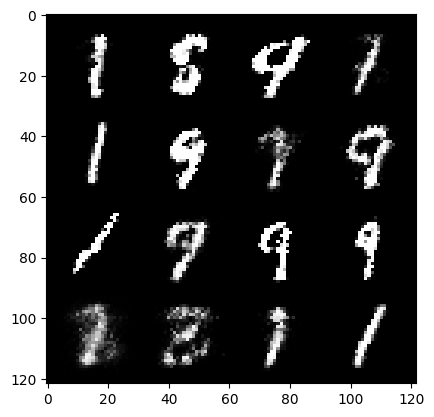

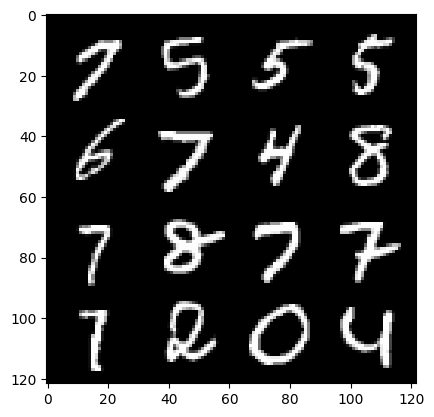

45: step 21300 / Gen loss: 0.9656342091162998 / disc_loss: 0.0863592582320174


  0%|          | 0/469 [00:00<?, ?it/s]

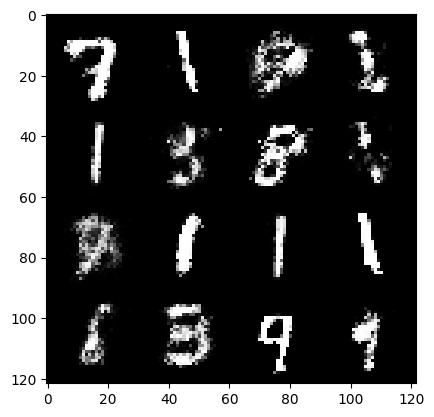

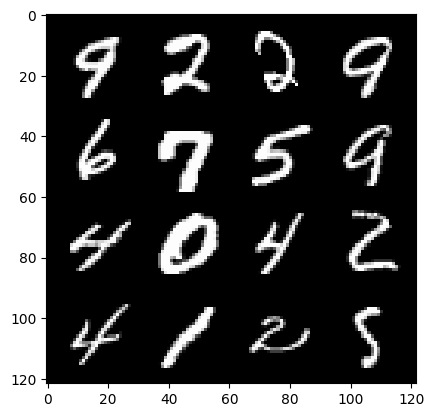

46: step 21600 / Gen loss: 0.965998865564665 / disc_loss: 0.09263327714055773


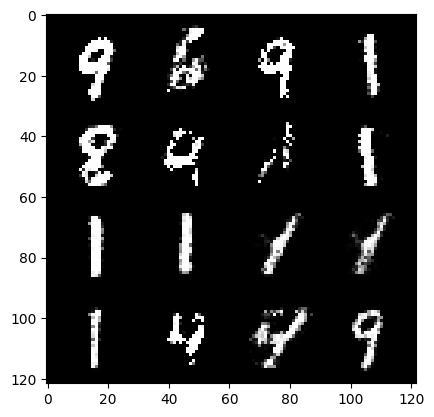

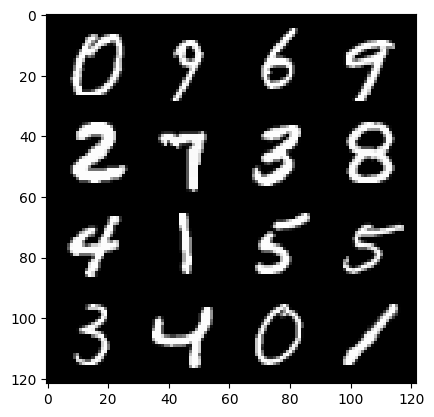

46: step 21900 / Gen loss: 0.9662113189697266 / disc_loss: 0.08766352990021305


  0%|          | 0/469 [00:00<?, ?it/s]

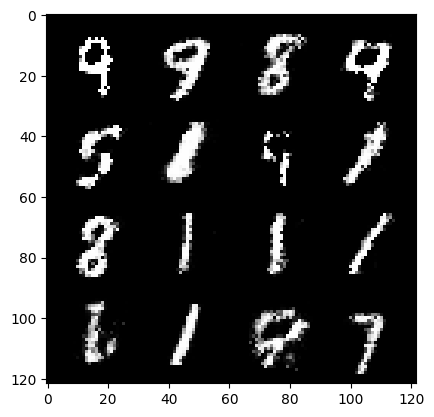

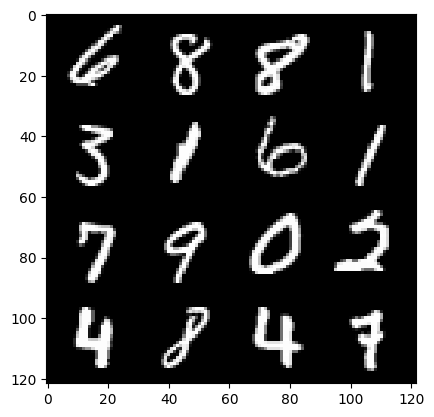

47: step 22200 / Gen loss: 0.963079016407331 / disc_loss: 0.09932926529397565


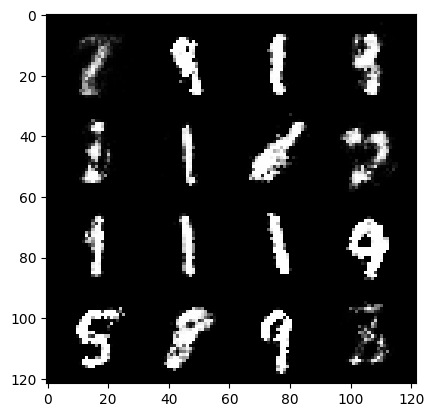

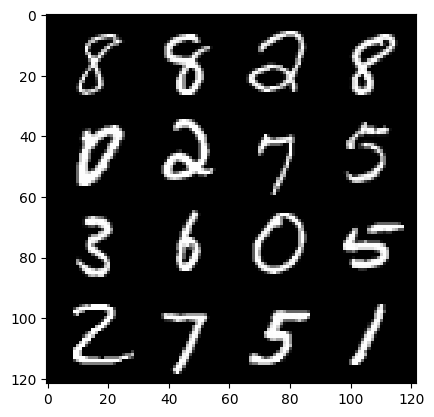

47: step 22500 / Gen loss: 0.9613952000935875 / disc_loss: 0.09727673550446815


  0%|          | 0/469 [00:00<?, ?it/s]

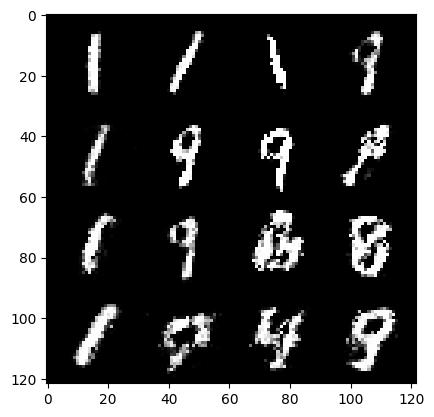

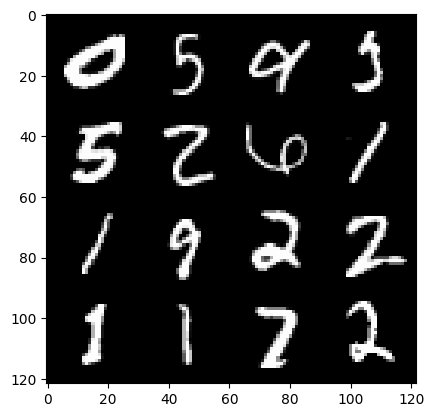

48: step 22800 / Gen loss: 0.9610581950346632 / disc_loss: 0.0984378888582191


  0%|          | 0/469 [00:00<?, ?it/s]

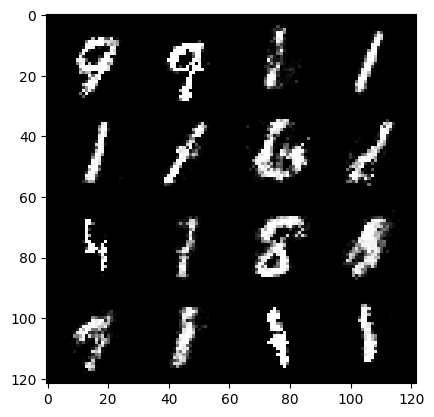

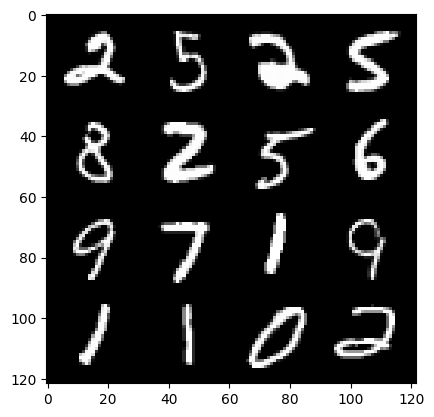

49: step 23100 / Gen loss: 0.9565784897406895 / disc_loss: 0.10346139562626686


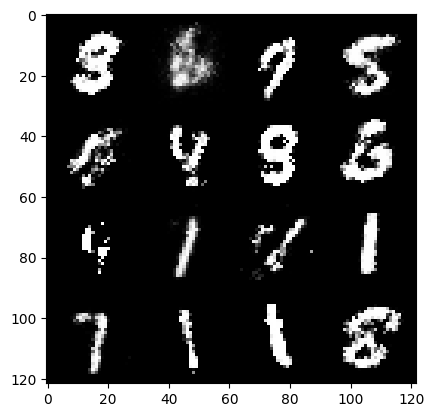

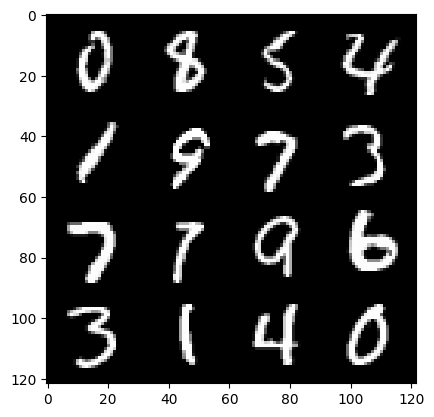

49: step 23400 / Gen loss: 0.9588250293334326 / disc_loss: 0.09938376575708385


  0%|          | 0/469 [00:00<?, ?it/s]

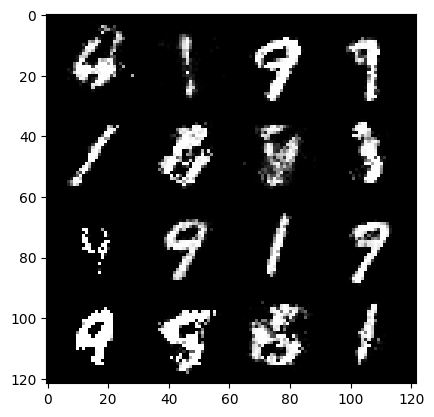

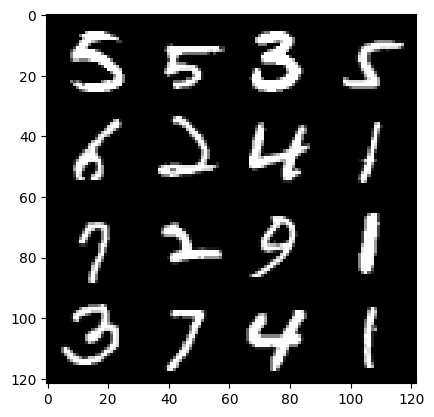

50: step 23700 / Gen loss: 0.9586017274856568 / disc_loss: 0.09517509845395875


  0%|          | 0/469 [00:00<?, ?it/s]

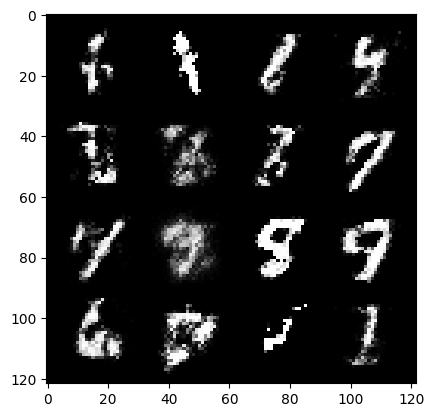

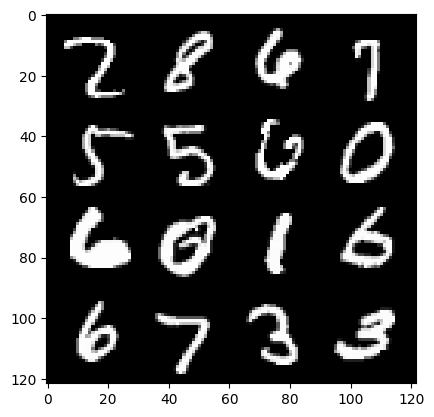

51: step 24000 / Gen loss: 0.9556865187486014 / disc_loss: 0.1061400620266795


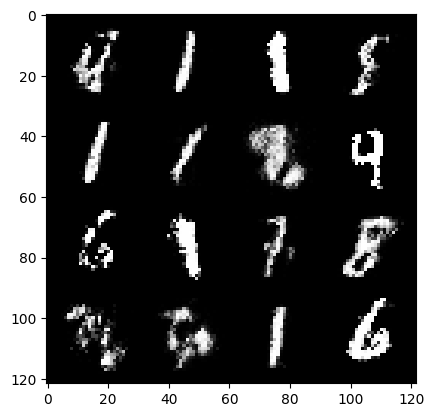

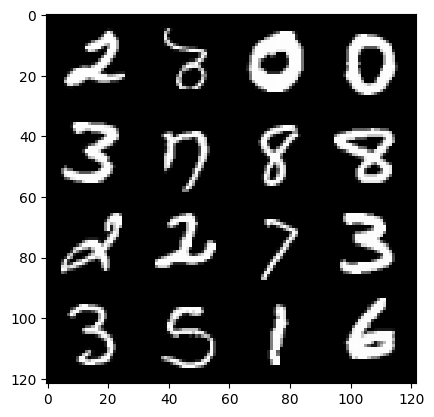

51: step 24300 / Gen loss: 0.9525687166055046 / disc_loss: 0.11086656451225274


  0%|          | 0/469 [00:00<?, ?it/s]

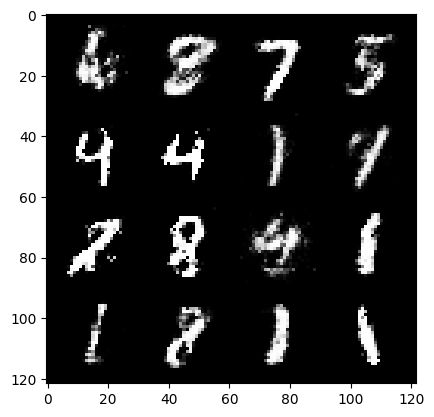

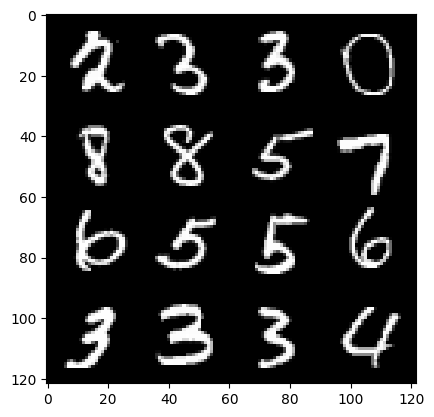

52: step 24600 / Gen loss: 0.9528685567776368 / disc_loss: 0.10421885752429574


  0%|          | 0/469 [00:00<?, ?it/s]

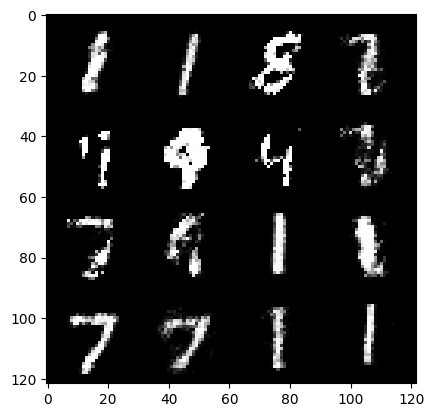

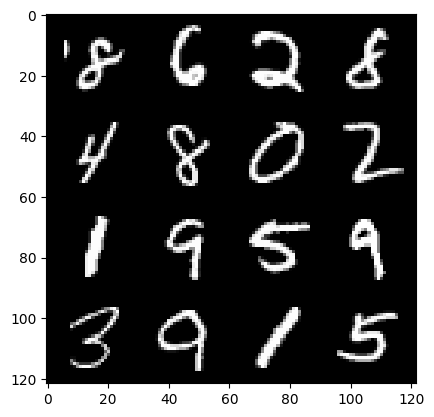

53: step 24900 / Gen loss: 0.9515560533603032 / disc_loss: 0.11244587677220508


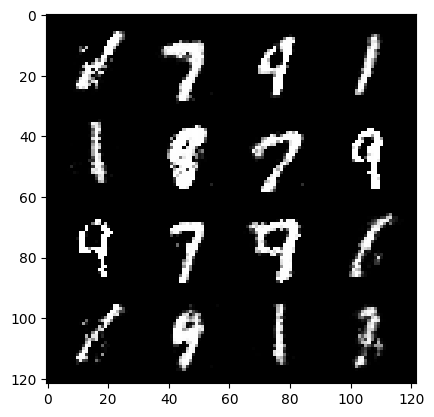

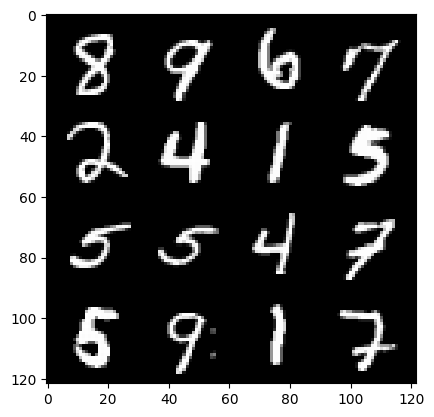

53: step 25200 / Gen loss: 0.9562806260585792 / disc_loss: 0.1048441636934876


  0%|          | 0/469 [00:00<?, ?it/s]

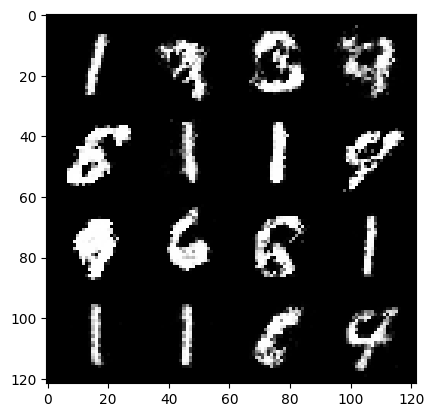

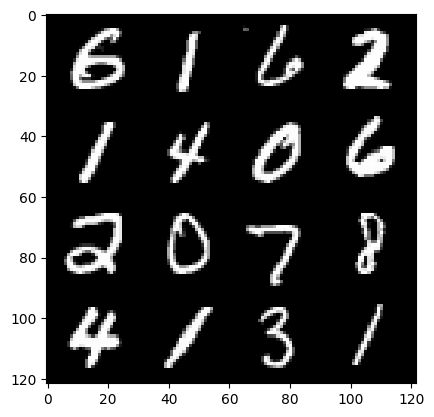

54: step 25500 / Gen loss: 0.9514345069726302 / disc_loss: 0.11416641059021153


  0%|          | 0/469 [00:00<?, ?it/s]

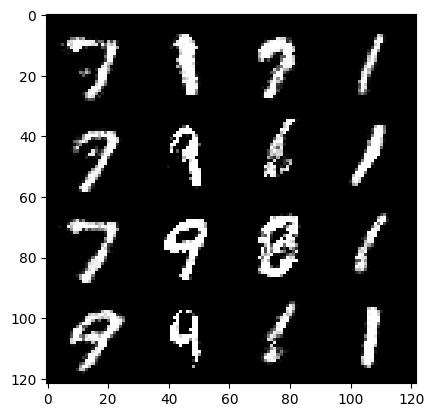

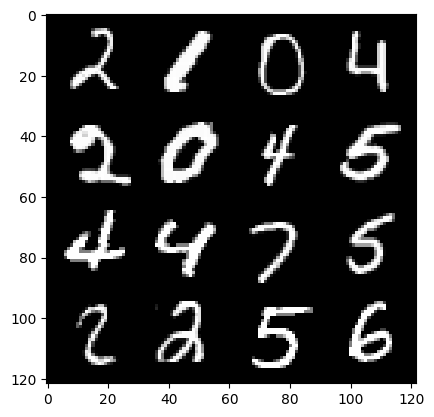

55: step 25800 / Gen loss: 0.9410376063982638 / disc_loss: 0.12189911832412084


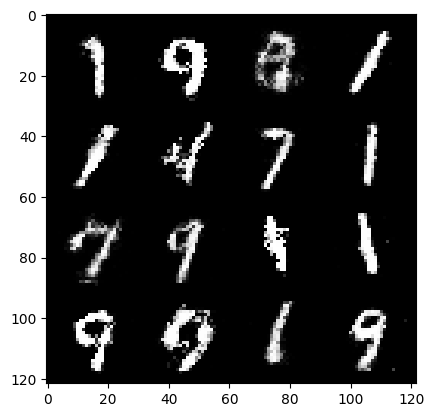

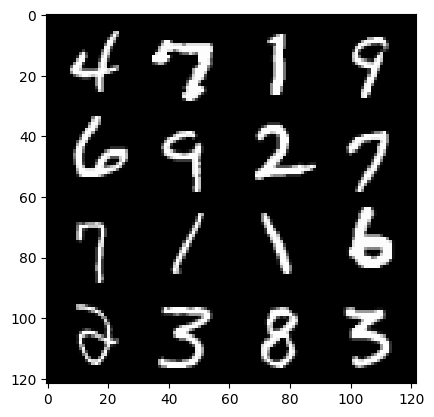

55: step 26100 / Gen loss: 0.9396802737315487 / disc_loss: 0.12223569656411809


  0%|          | 0/469 [00:00<?, ?it/s]

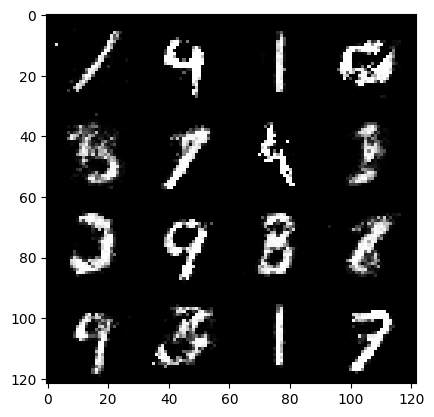

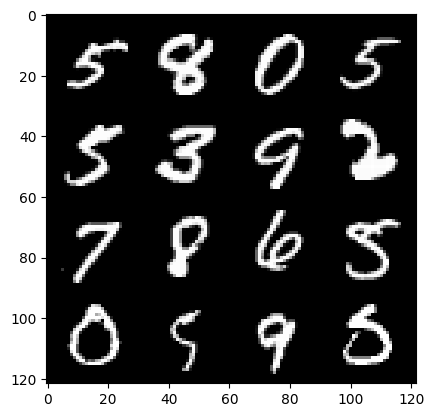

56: step 26400 / Gen loss: 0.9428832530975342 / disc_loss: 0.12596339618166294


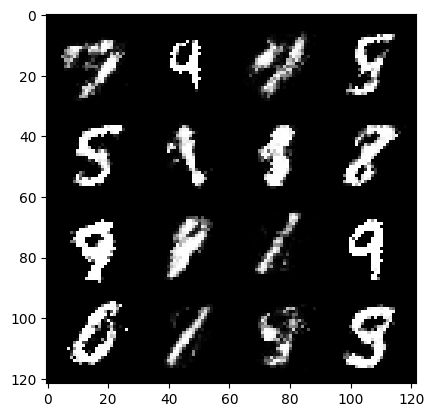

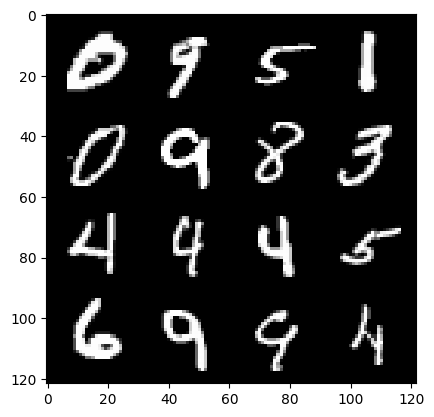

56: step 26700 / Gen loss: 0.9393645882606506 / disc_loss: 0.12610637033979094


  0%|          | 0/469 [00:00<?, ?it/s]

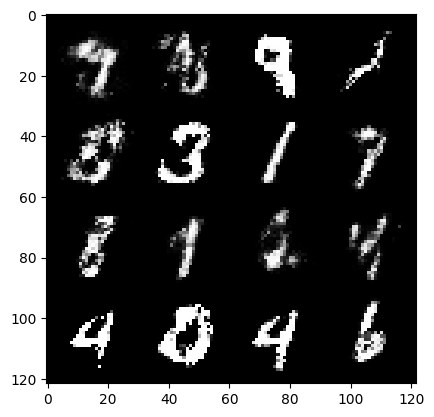

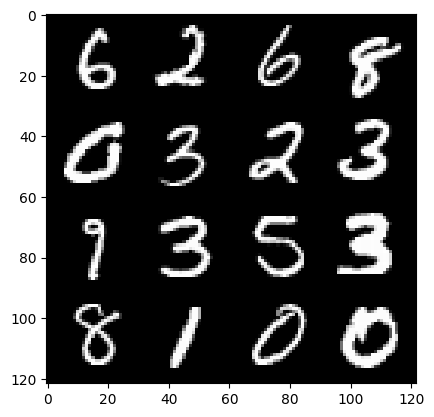

57: step 27000 / Gen loss: 0.9369216104348503 / disc_loss: 0.13176023950179425


  0%|          | 0/469 [00:00<?, ?it/s]

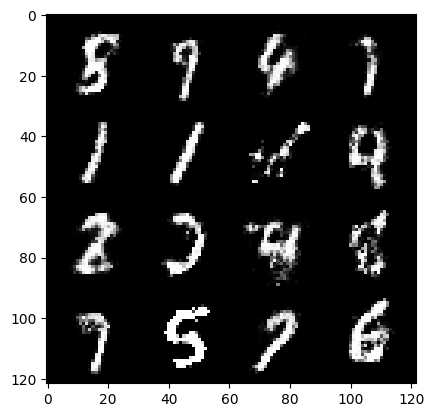

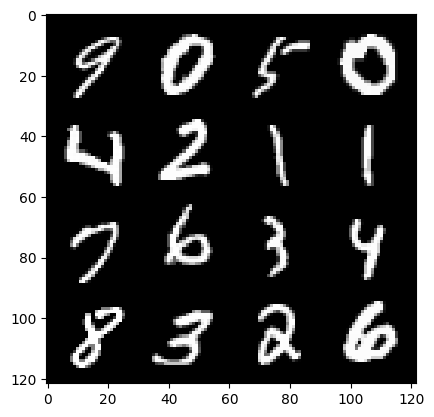

58: step 27300 / Gen loss: 0.93838076988856 / disc_loss: 0.1289853623012702


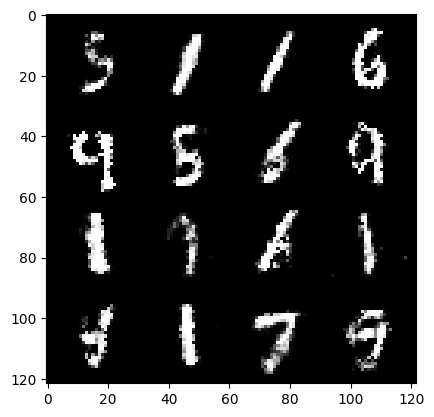

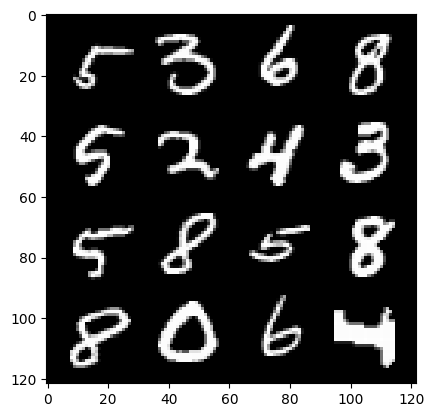

58: step 27600 / Gen loss: 0.9311261663834249 / disc_loss: 0.13734240904450426


  0%|          | 0/469 [00:00<?, ?it/s]

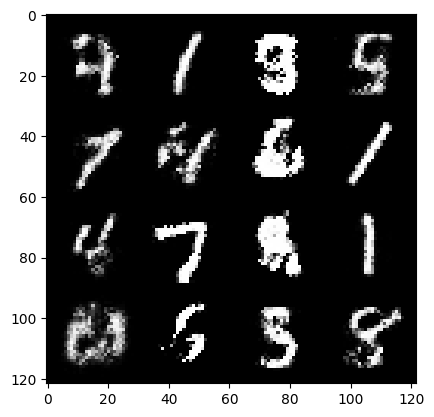

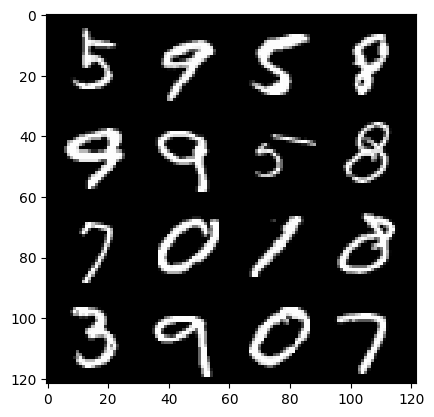

59: step 27900 / Gen loss: 0.9364443494876231 / disc_loss: 0.13188048248489695


  0%|          | 0/469 [00:00<?, ?it/s]

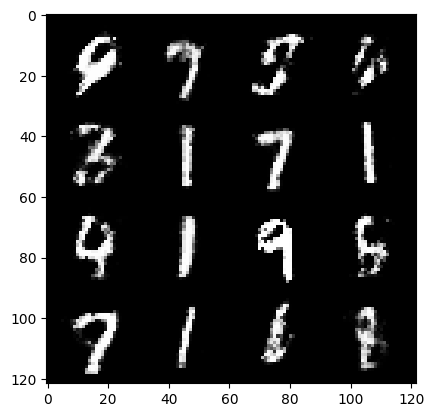

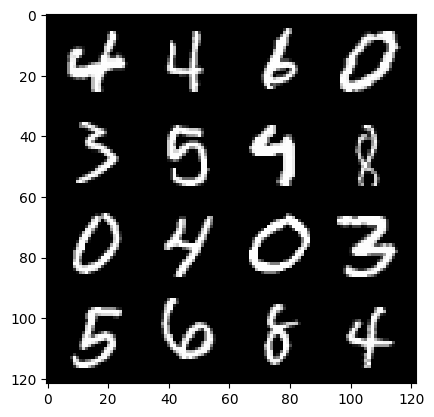

60: step 28200 / Gen loss: 0.932593351801236 / disc_loss: 0.13960057723025482


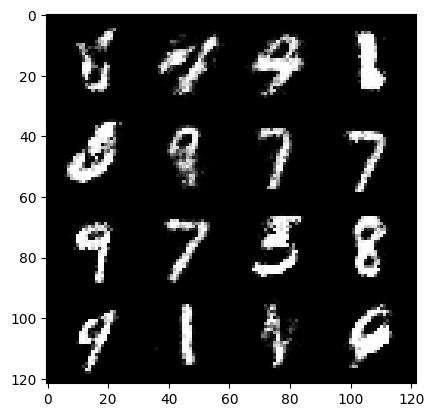

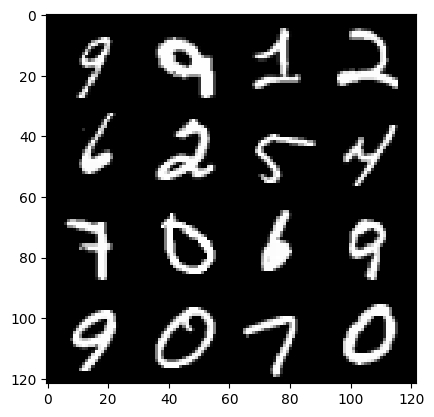

60: step 28500 / Gen loss: 0.9283406674861905 / disc_loss: 0.14459731164077913


  0%|          | 0/469 [00:00<?, ?it/s]

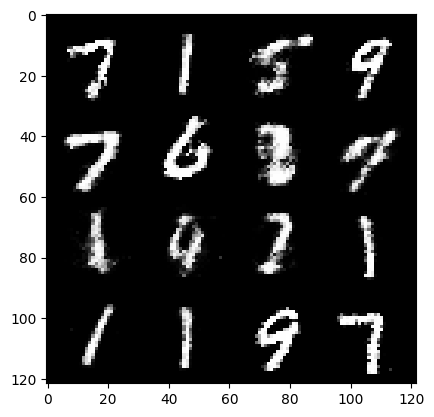

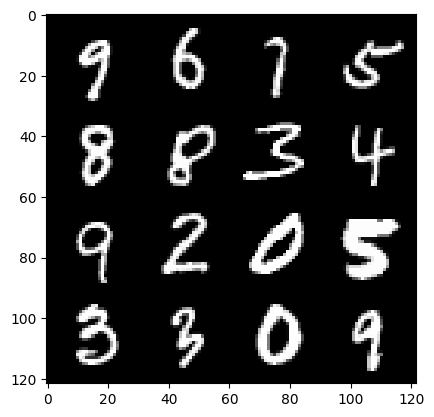

61: step 28800 / Gen loss: 0.9298583652575808 / disc_loss: 0.14045158982276926


  0%|          | 0/469 [00:00<?, ?it/s]

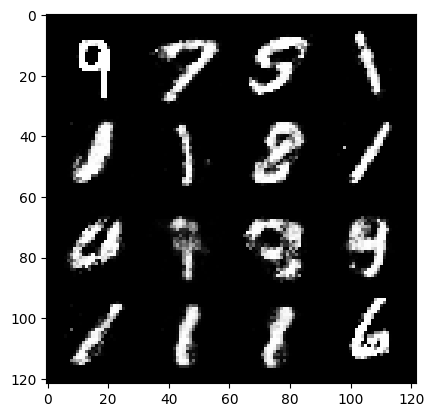

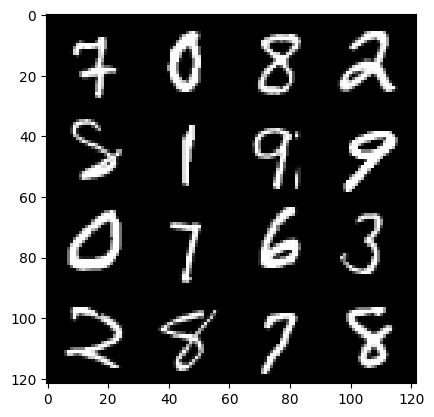

62: step 29100 / Gen loss: 0.9337579468886055 / disc_loss: 0.1403734219074249


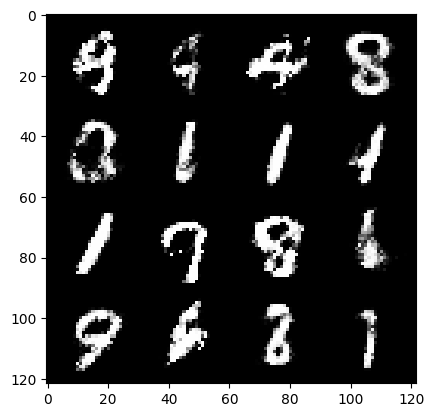

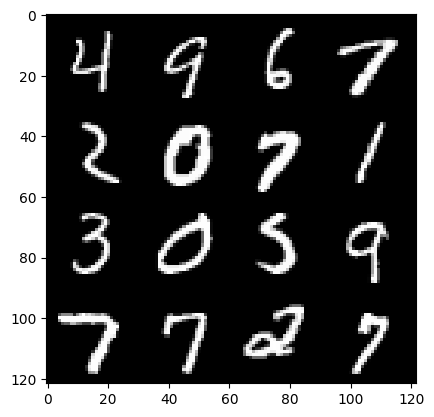

62: step 29400 / Gen loss: 0.9296228202184043 / disc_loss: 0.14843668460845955


  0%|          | 0/469 [00:00<?, ?it/s]

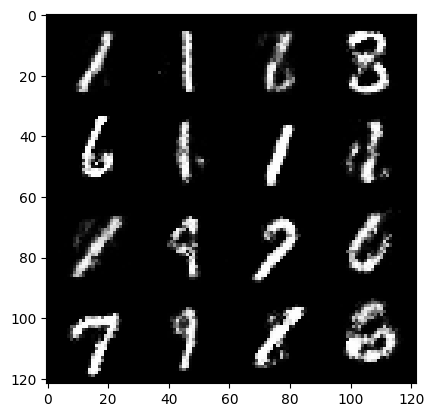

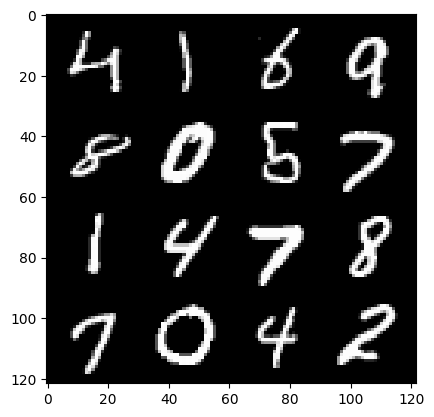

63: step 29700 / Gen loss: 0.9264643049240108 / disc_loss: 0.14775016444424785


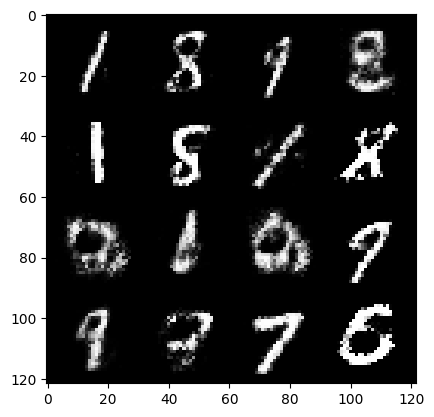

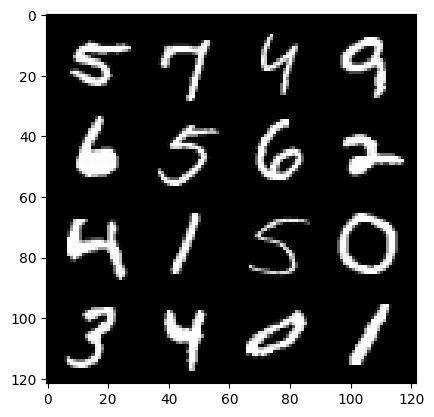

63: step 30000 / Gen loss: 0.9229707594712575 / disc_loss: 0.15042004344364004


  0%|          | 0/469 [00:00<?, ?it/s]

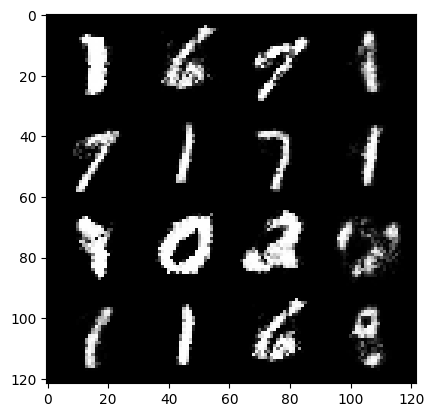

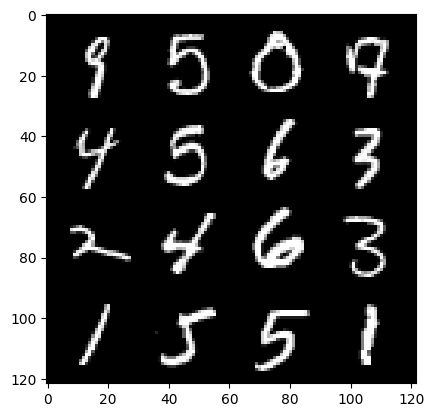

64: step 30300 / Gen loss: 0.9169949541489278 / disc_loss: 0.16011211156845087


  0%|          | 0/469 [00:00<?, ?it/s]

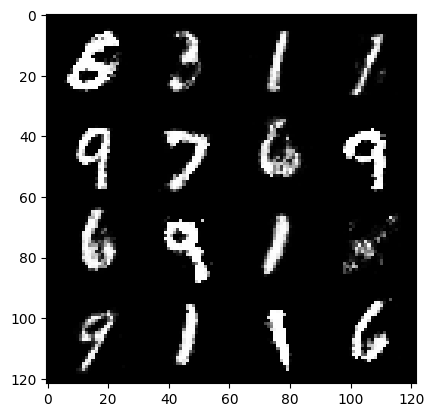

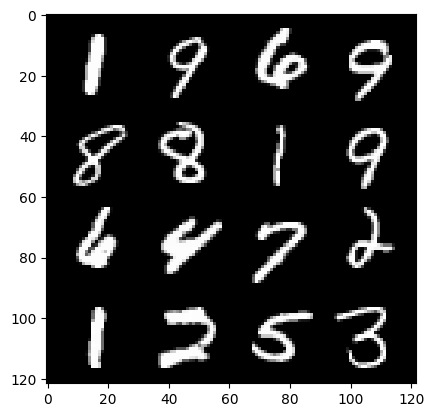

65: step 30600 / Gen loss: 0.9244378137588503 / disc_loss: 0.14719124806423992


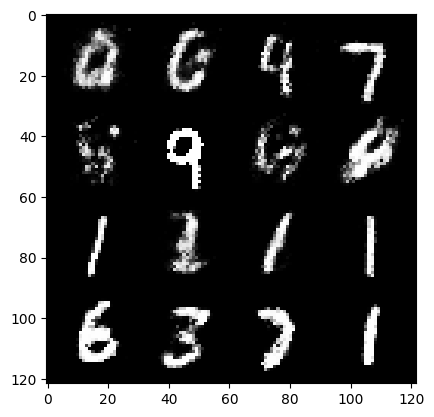

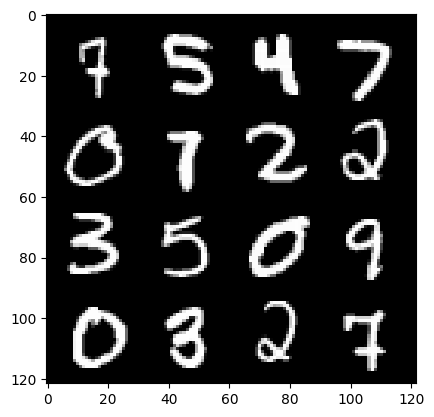

65: step 30900 / Gen loss: 0.9191765342156092 / disc_loss: 0.15649033660689998


  0%|          | 0/469 [00:00<?, ?it/s]

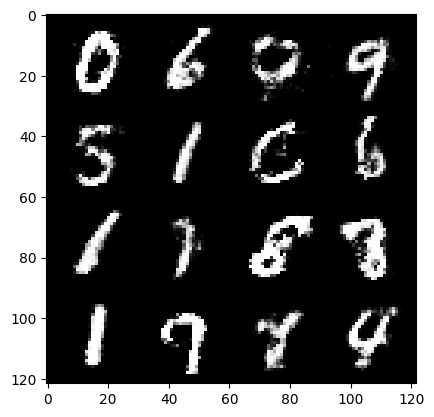

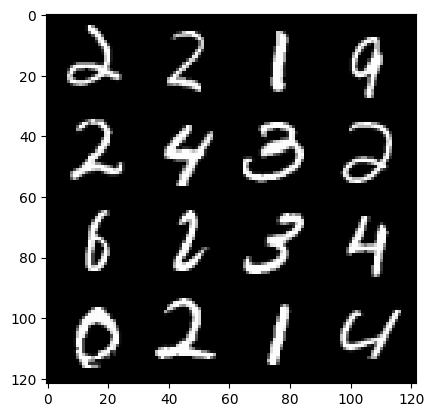

66: step 31200 / Gen loss: 0.9177047441403062 / disc_loss: 0.15781313498814897


  0%|          | 0/469 [00:00<?, ?it/s]

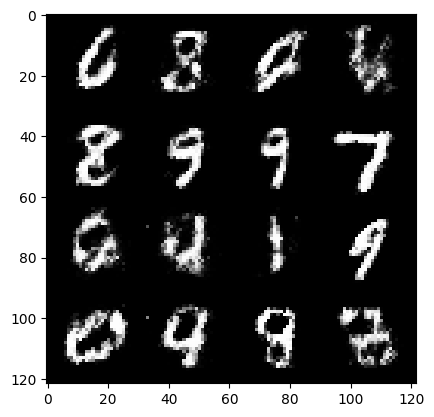

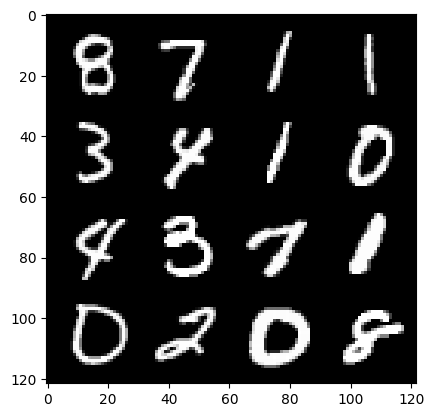

67: step 31500 / Gen loss: 0.9112748116254802 / disc_loss: 0.16822066205243275


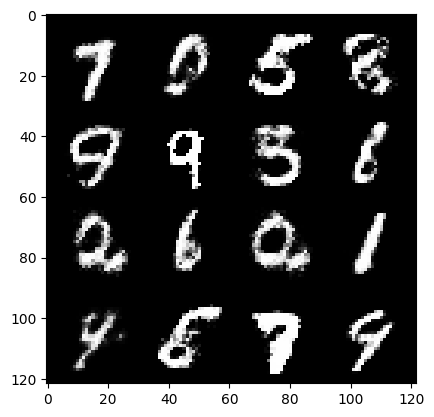

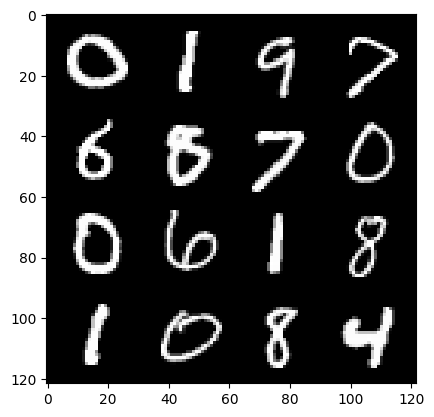

67: step 31800 / Gen loss: 0.915193745891253 / disc_loss: 0.16553270017107333


  0%|          | 0/469 [00:00<?, ?it/s]

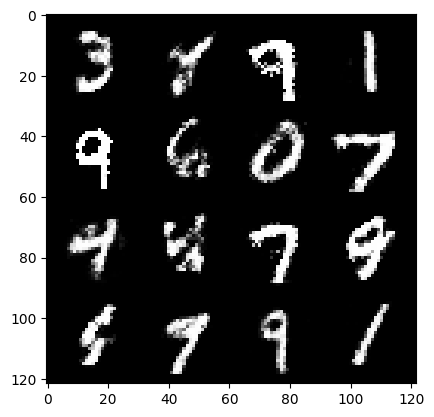

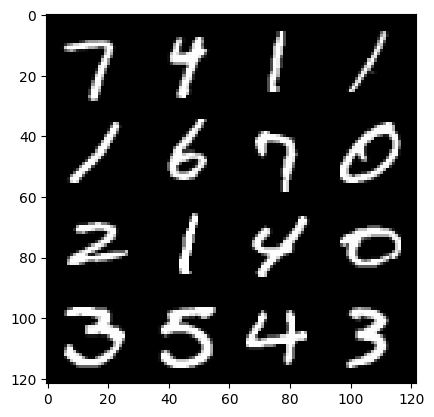

68: step 32100 / Gen loss: 0.9083382252852117 / disc_loss: 0.1766949009646972


  0%|          | 0/469 [00:00<?, ?it/s]

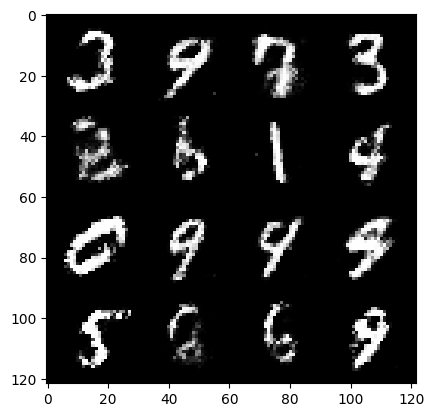

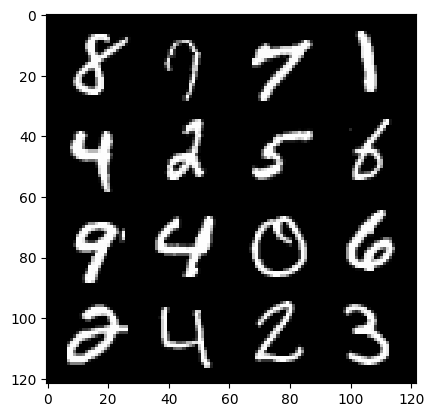

69: step 32400 / Gen loss: 0.91496389289697 / disc_loss: 0.17085953844090324


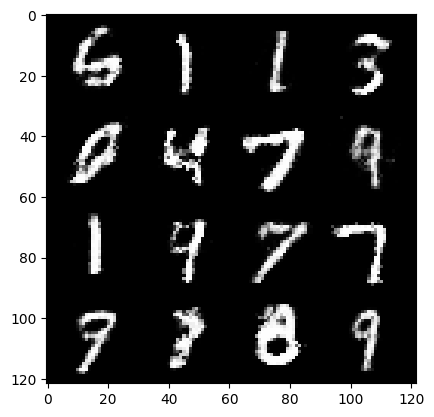

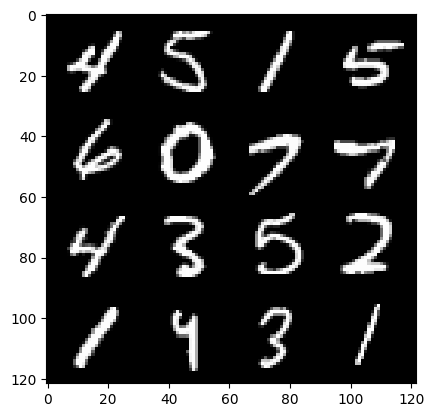

69: step 32700 / Gen loss: 0.9134824222326274 / disc_loss: 0.16676755279302596


  0%|          | 0/469 [00:00<?, ?it/s]

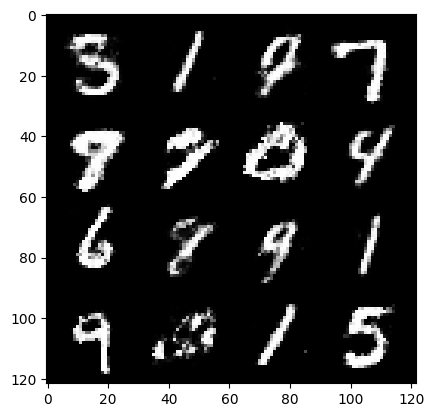

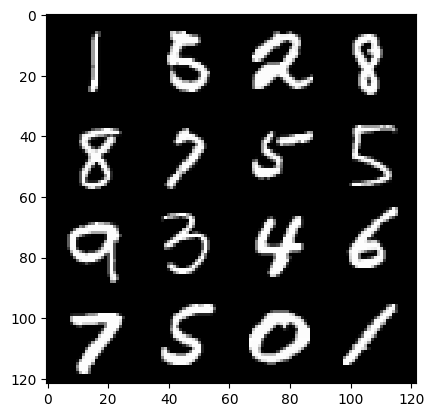

70: step 33000 / Gen loss: 0.913483873605728 / disc_loss: 0.1710846330722174


  0%|          | 0/469 [00:00<?, ?it/s]

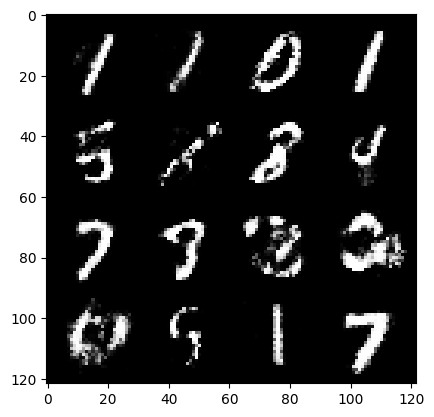

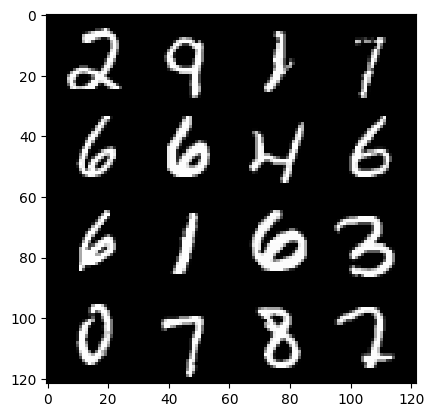

71: step 33300 / Gen loss: 0.9171689071257914 / disc_loss: 0.16766565129160885


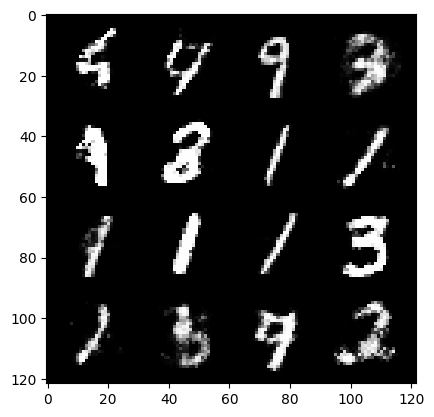

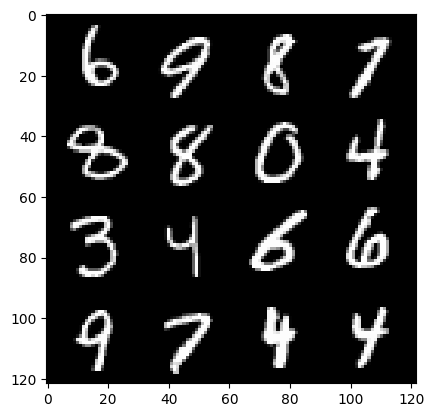

71: step 33600 / Gen loss: 0.9132404704888668 / disc_loss: 0.17485784967740384


  0%|          | 0/469 [00:00<?, ?it/s]

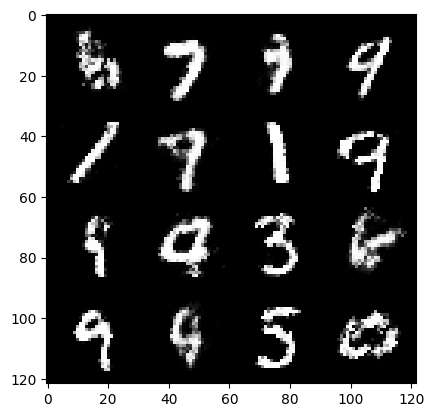

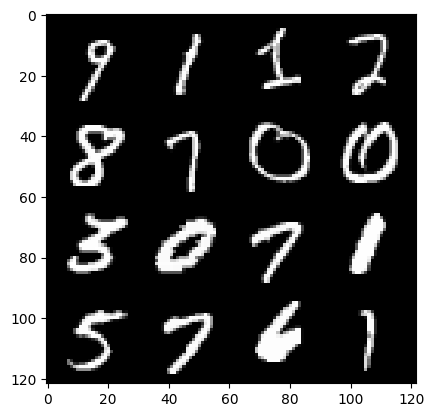

72: step 33900 / Gen loss: 0.9090103350083032 / disc_loss: 0.17358665287494662


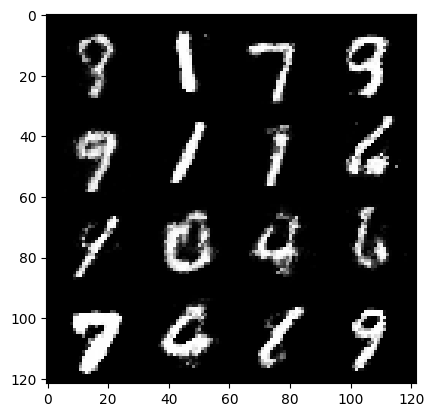

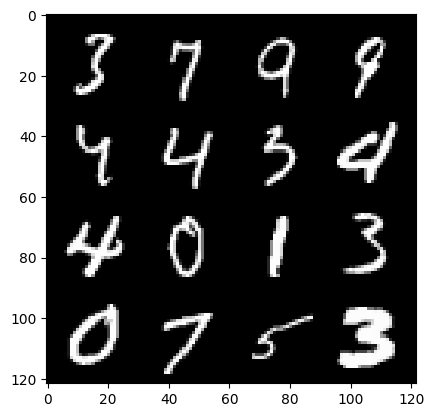

72: step 34200 / Gen loss: 0.9054994461933767 / disc_loss: 0.18024658809105557


  0%|          | 0/469 [00:00<?, ?it/s]

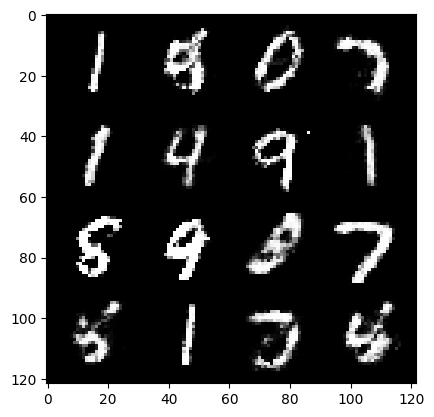

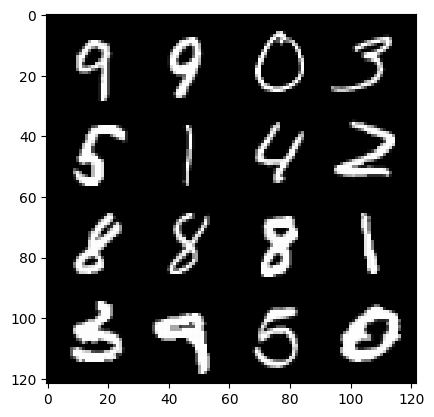

73: step 34500 / Gen loss: 0.9104063298304879 / disc_loss: 0.17504600288967317


  0%|          | 0/469 [00:00<?, ?it/s]

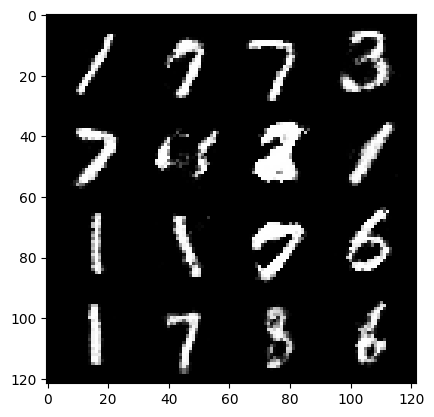

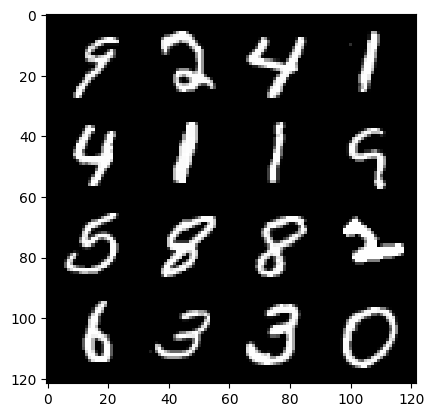

74: step 34800 / Gen loss: 0.908979485432307 / disc_loss: 0.176427113711834


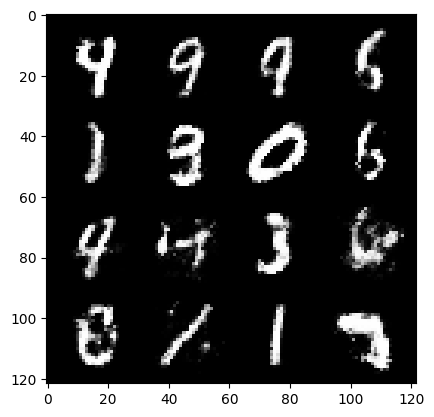

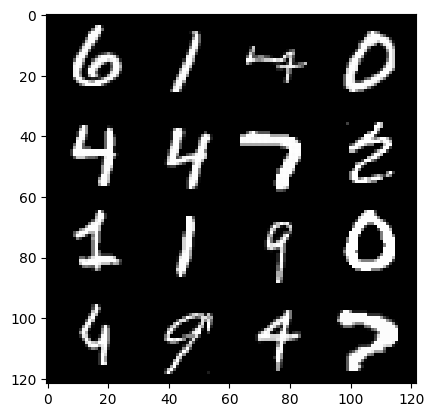

74: step 35100 / Gen loss: 0.9031361184517541 / disc_loss: 0.17354751517375305


  0%|          | 0/469 [00:00<?, ?it/s]

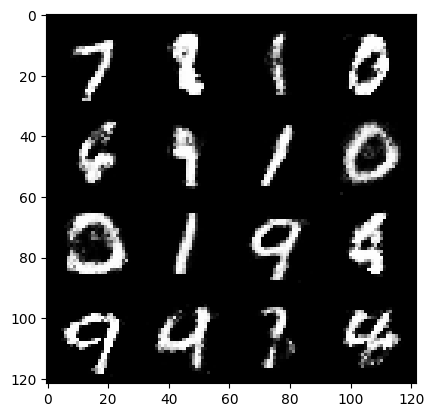

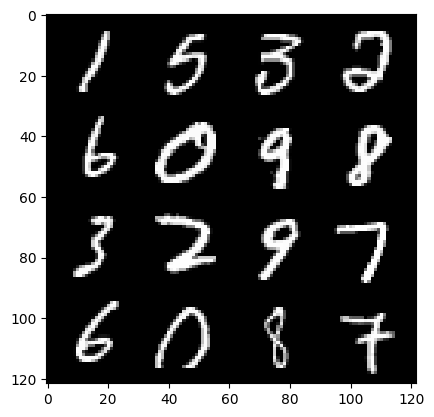

75: step 35400 / Gen loss: 0.9085646146535877 / disc_loss: 0.17166358893116304


  0%|          | 0/469 [00:00<?, ?it/s]

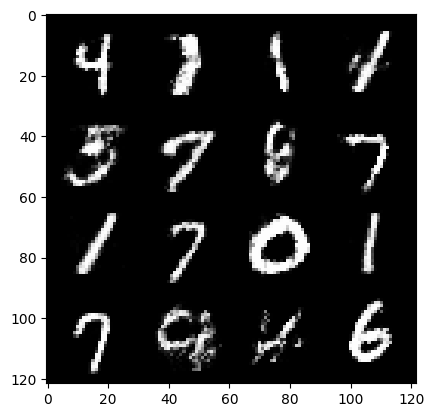

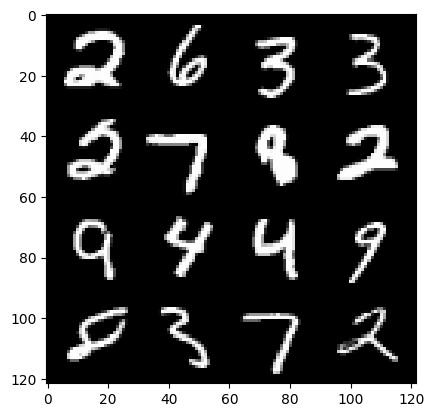

76: step 35700 / Gen loss: 0.9070401994387309 / disc_loss: 0.18055929231146967


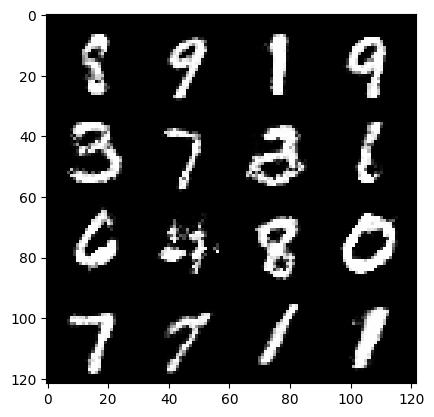

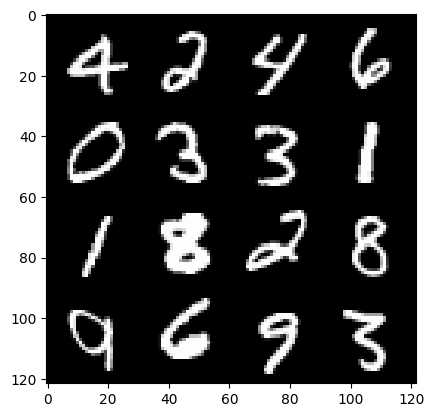

76: step 36000 / Gen loss: 0.9072090319792426 / disc_loss: 0.17670295894145951


  0%|          | 0/469 [00:00<?, ?it/s]

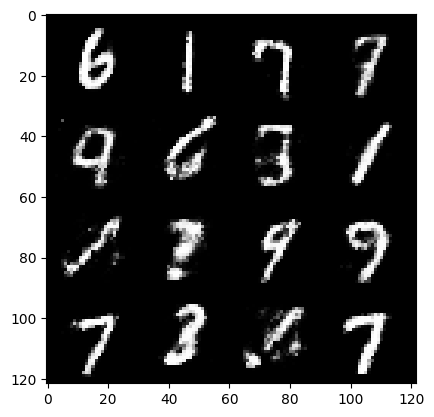

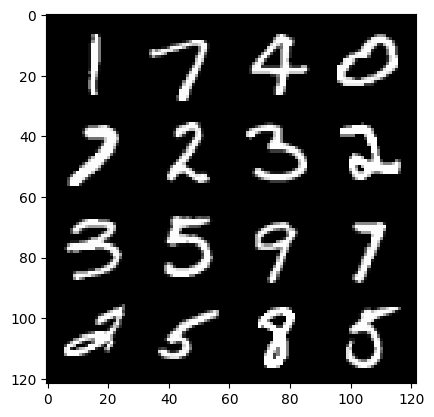

77: step 36300 / Gen loss: 0.8996339402596155 / disc_loss: 0.1828596518933773


  0%|          | 0/469 [00:00<?, ?it/s]

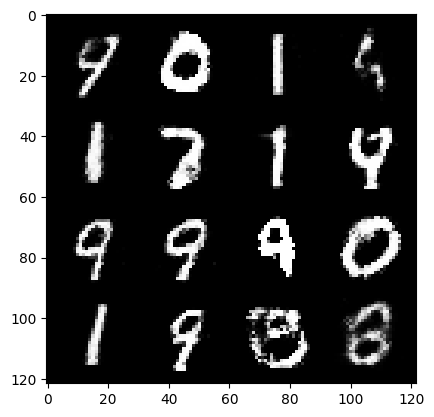

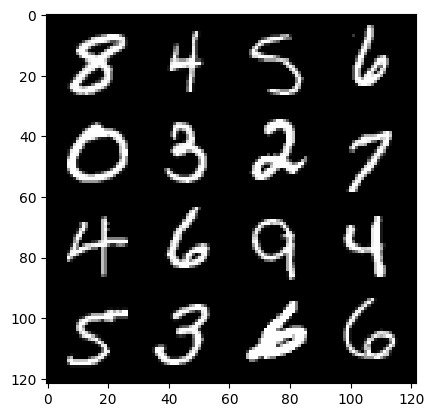

78: step 36600 / Gen loss: 0.8906448564926784 / disc_loss: 0.1898761635025342


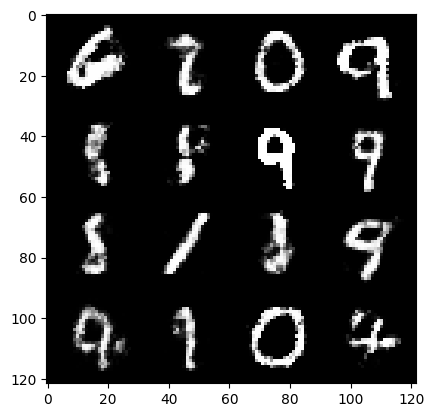

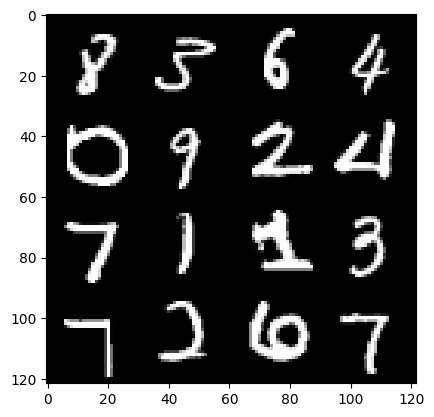

78: step 36900 / Gen loss: 0.9004835317532225 / disc_loss: 0.18691405422985563


  0%|          | 0/469 [00:00<?, ?it/s]

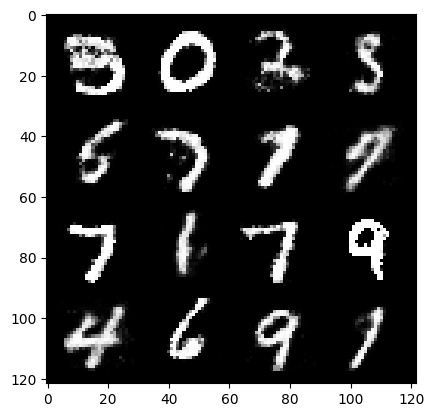

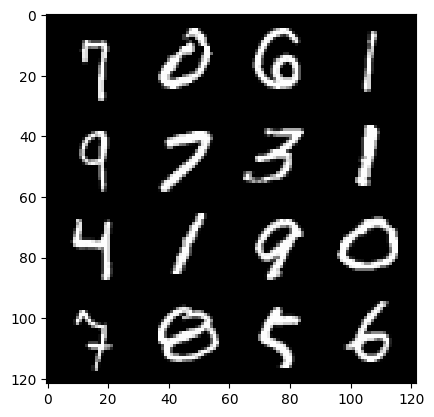

79: step 37200 / Gen loss: 0.8951511981089912 / disc_loss: 0.19657962073882418


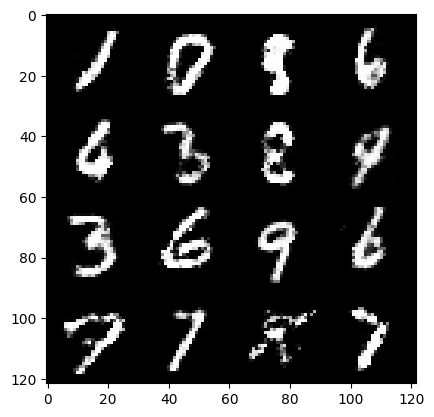

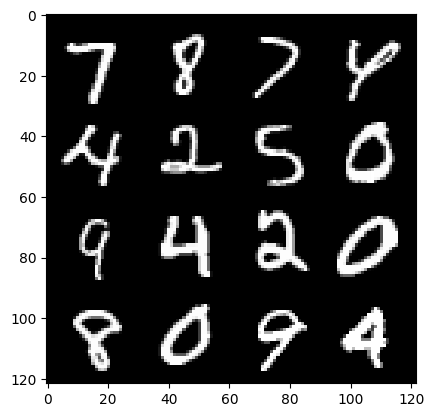

79: step 37500 / Gen loss: 0.8878112665812173 / disc_loss: 0.20103935028115894


  0%|          | 0/469 [00:00<?, ?it/s]

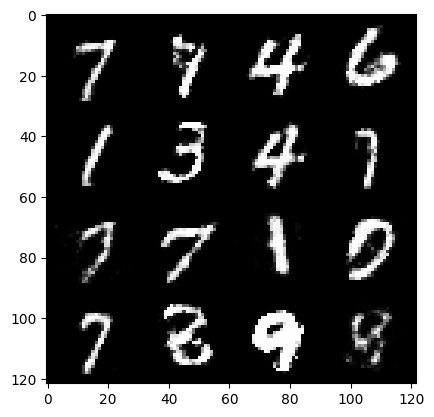

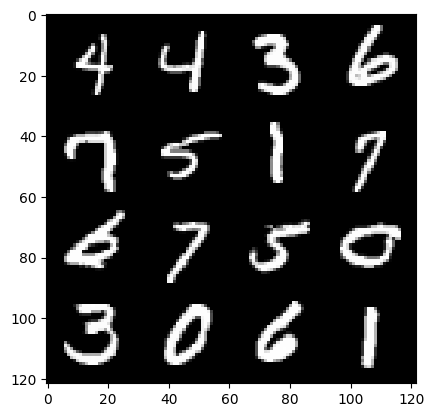

80: step 37800 / Gen loss: 0.8881064093112939 / disc_loss: 0.19828299554685763


  0%|          | 0/469 [00:00<?, ?it/s]

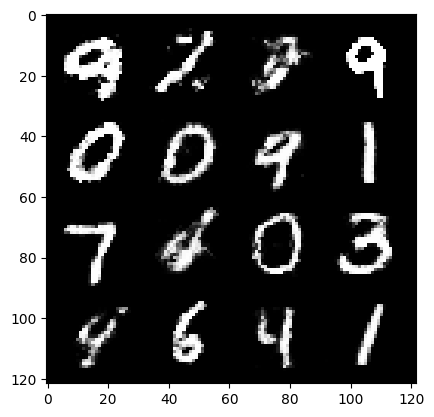

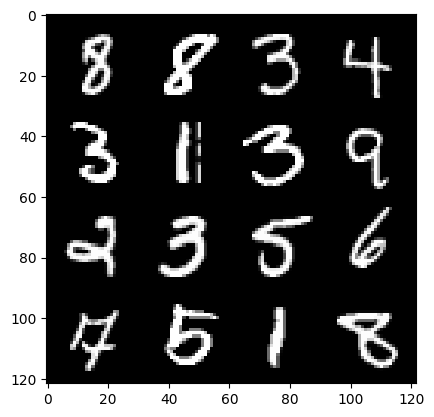

81: step 38100 / Gen loss: 0.8836964134375251 / disc_loss: 0.21236182962854688


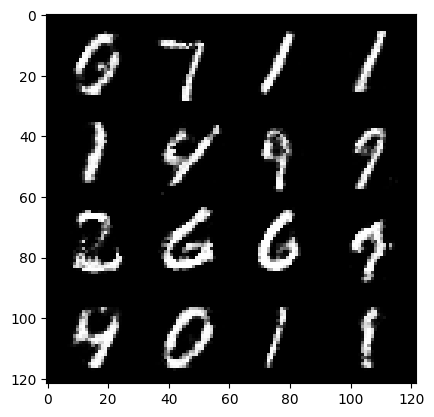

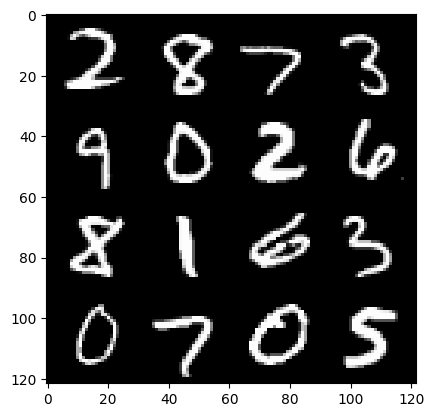

81: step 38400 / Gen loss: 0.8886308318376537 / disc_loss: 0.19869909385840095


  0%|          | 0/469 [00:00<?, ?it/s]

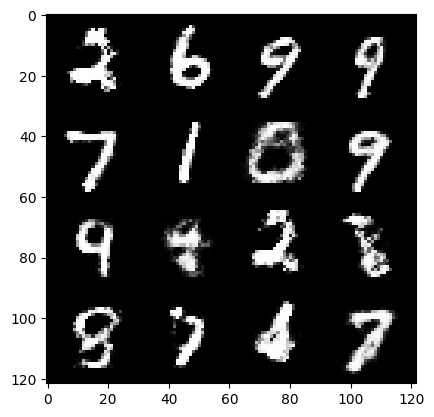

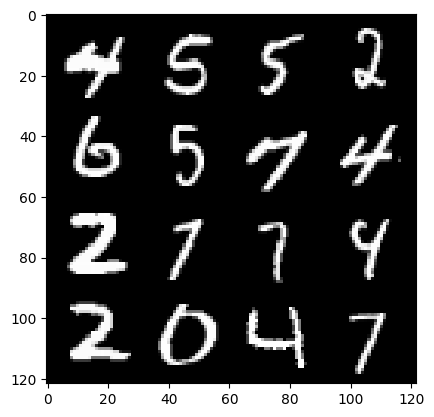

82: step 38700 / Gen loss: 0.8946793560187022 / disc_loss: 0.20574148004253695


  0%|          | 0/469 [00:00<?, ?it/s]

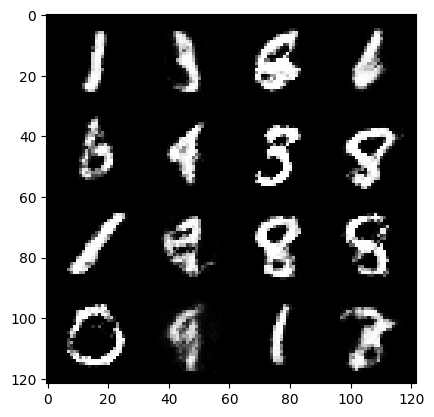

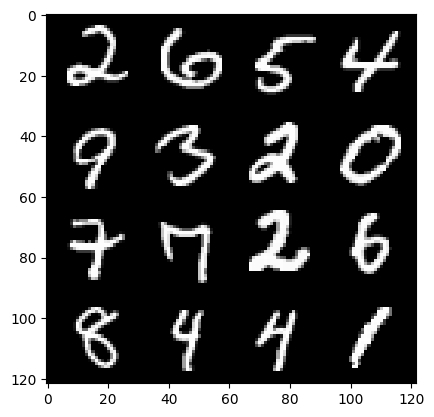

83: step 39000 / Gen loss: 0.8803705869118372 / disc_loss: 0.20980576142668733


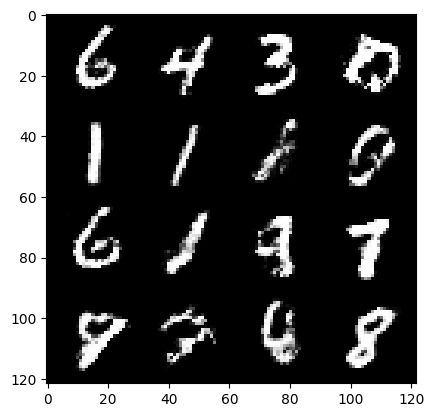

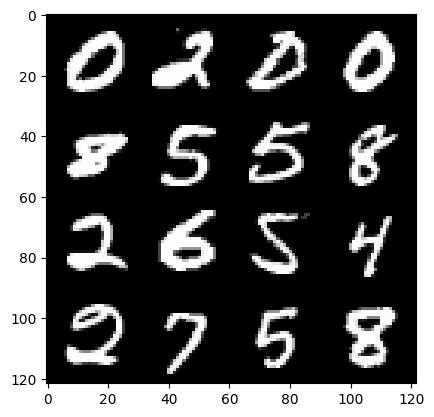

83: step 39300 / Gen loss: 0.8814926767349242 / disc_loss: 0.21177968104680378


  0%|          | 0/469 [00:00<?, ?it/s]

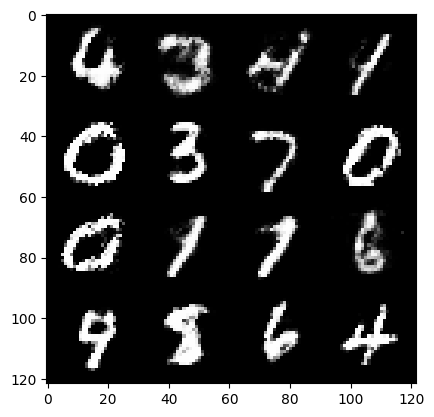

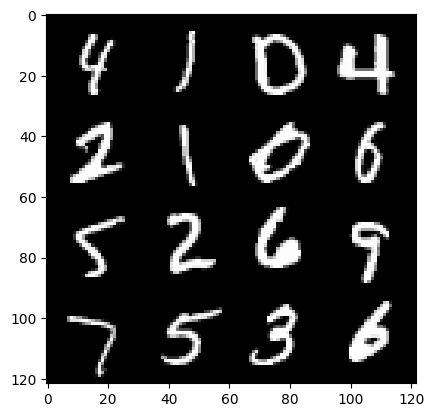

84: step 39600 / Gen loss: 0.8829028574625655 / disc_loss: 0.21368261039257047


  0%|          | 0/469 [00:00<?, ?it/s]

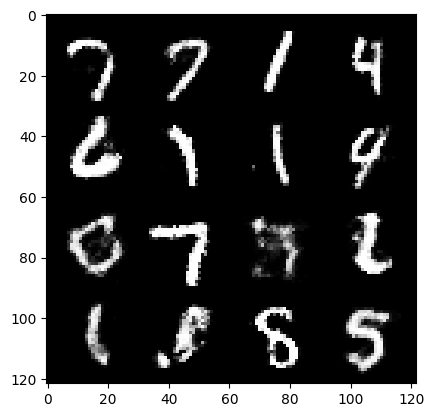

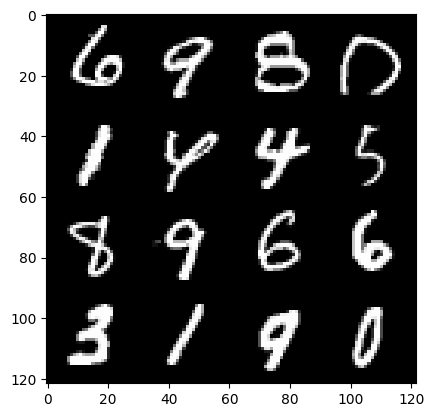

85: step 39900 / Gen loss: 0.8750618958473207 / disc_loss: 0.2223753376305103


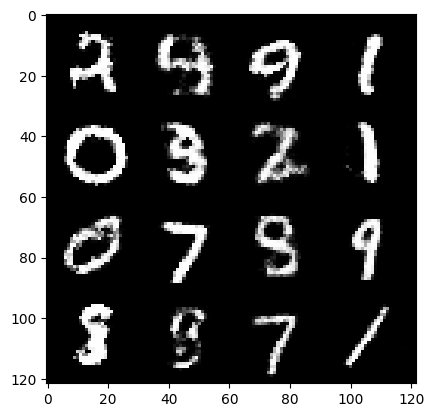

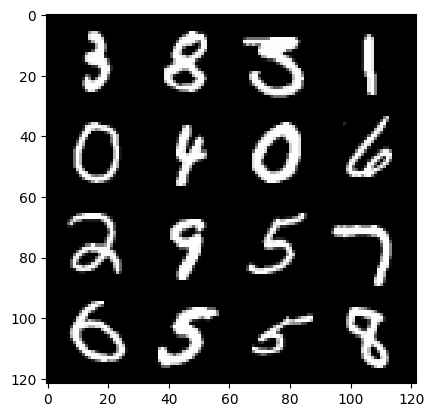

85: step 40200 / Gen loss: 0.8766283412774397 / disc_loss: 0.21818049018581698


  0%|          | 0/469 [00:00<?, ?it/s]

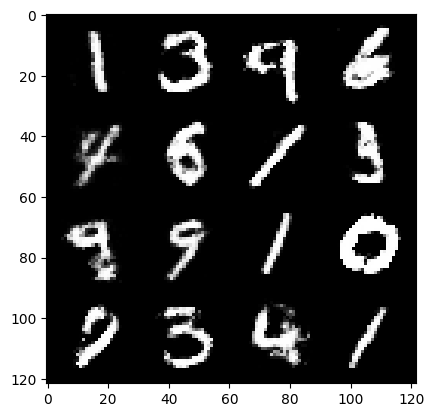

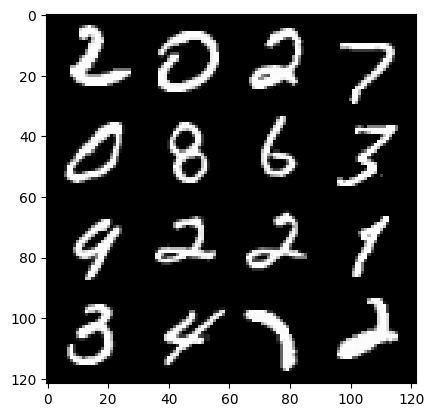

86: step 40500 / Gen loss: 0.8770812340577445 / disc_loss: 0.220692167232434


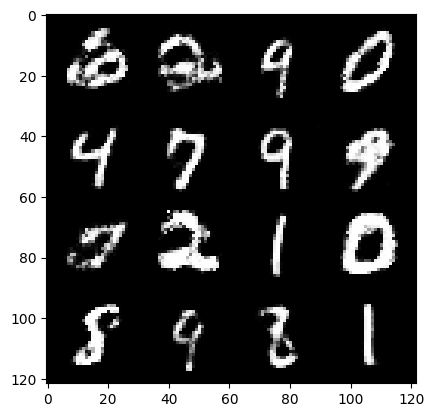

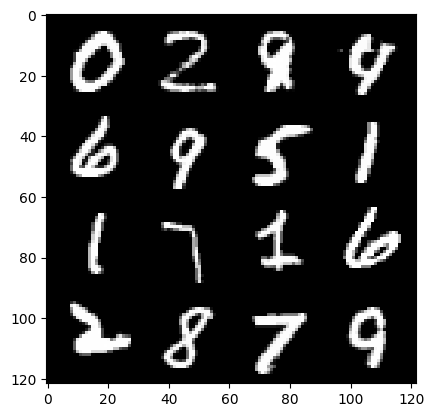

86: step 40800 / Gen loss: 0.8789668232202537 / disc_loss: 0.2200680247942605


  0%|          | 0/469 [00:00<?, ?it/s]

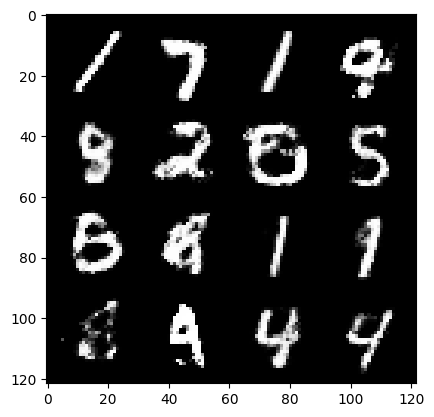

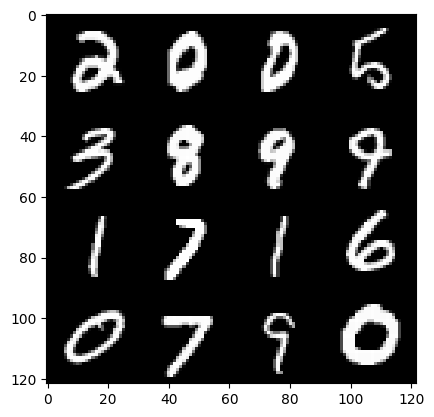

87: step 41100 / Gen loss: 0.8748827312390011 / disc_loss: 0.21900960331161817


  0%|          | 0/469 [00:00<?, ?it/s]

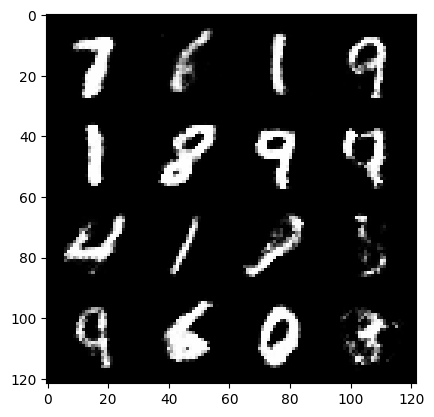

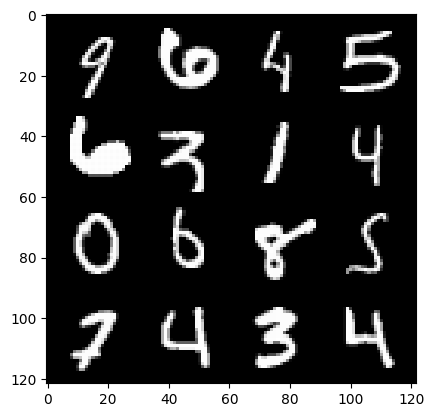

88: step 41400 / Gen loss: 0.8711739810307823 / disc_loss: 0.23031595612565678


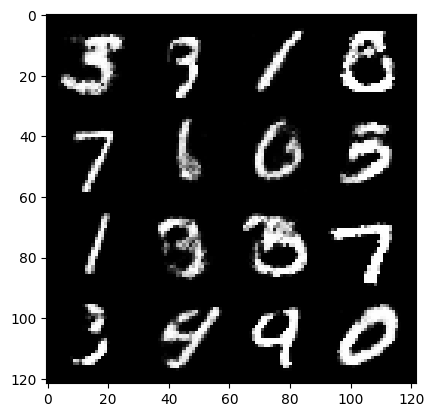

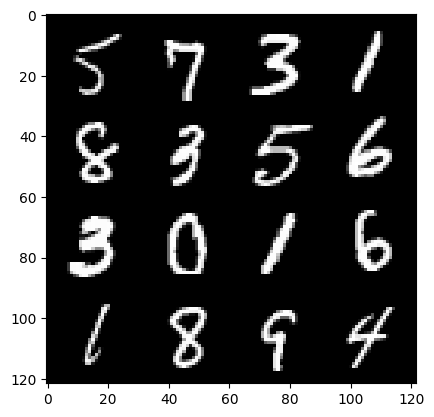

88: step 41700 / Gen loss: 0.8774739311138786 / disc_loss: 0.21481415842970222


  0%|          | 0/469 [00:00<?, ?it/s]

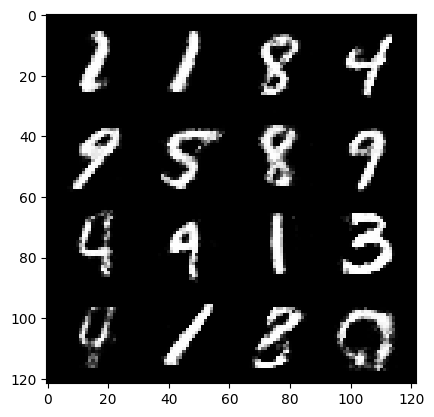

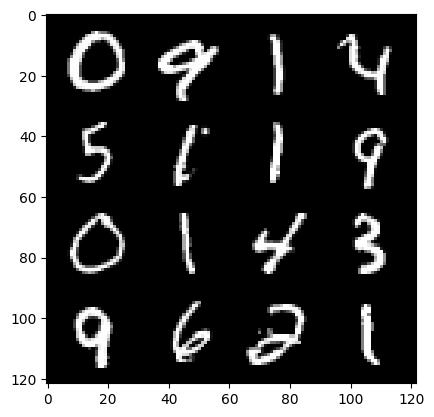

89: step 42000 / Gen loss: 0.873008135358493 / disc_loss: 0.22236065596342092


  0%|          | 0/469 [00:00<?, ?it/s]

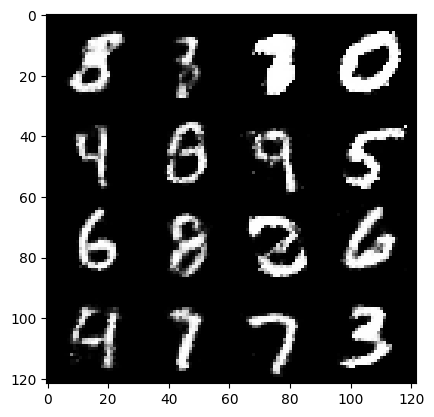

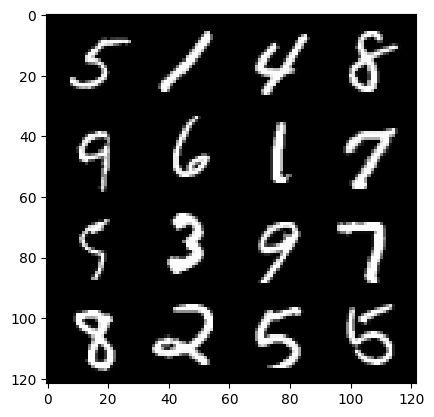

90: step 42300 / Gen loss: 0.8725041713317238 / disc_loss: 0.22309707035620988


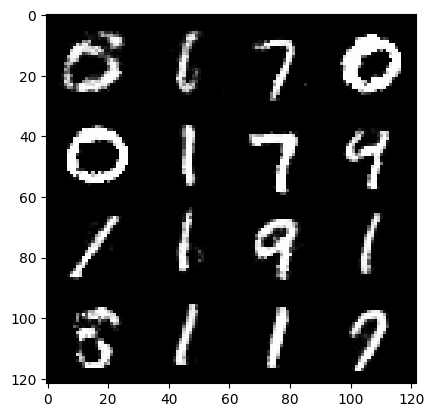

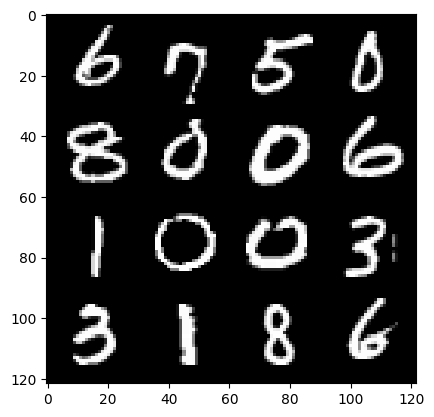

90: step 42600 / Gen loss: 0.8684130918979645 / disc_loss: 0.2248541260759036


  0%|          | 0/469 [00:00<?, ?it/s]

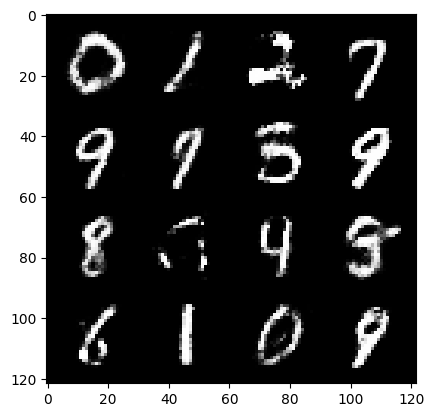

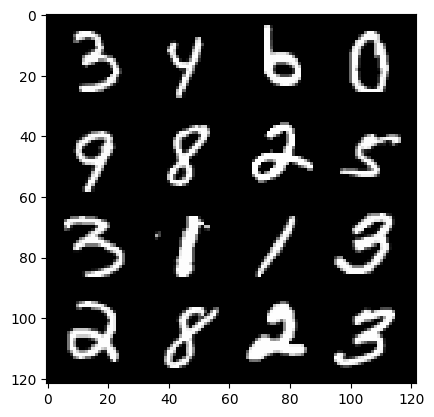

91: step 42900 / Gen loss: 0.8688792574405663 / disc_loss: 0.22970192755262053


  0%|          | 0/469 [00:00<?, ?it/s]

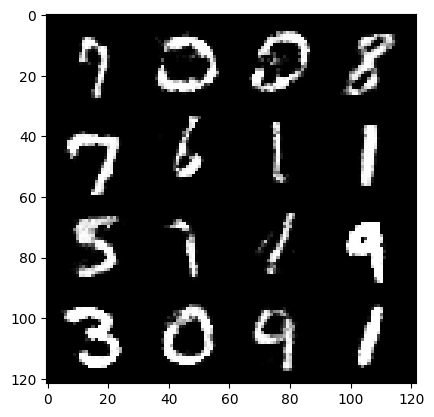

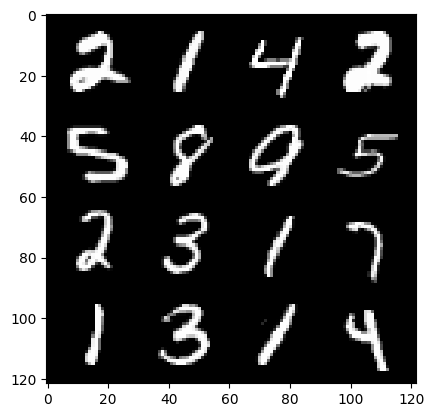

92: step 43200 / Gen loss: 0.8677584904432295 / disc_loss: 0.22749568819999705


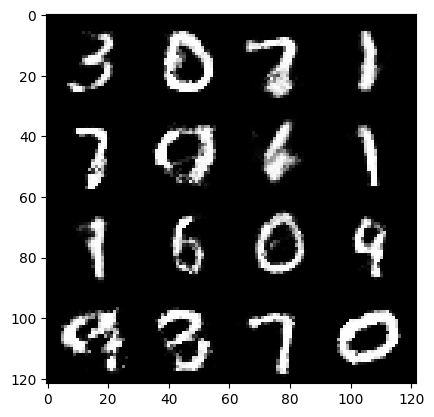

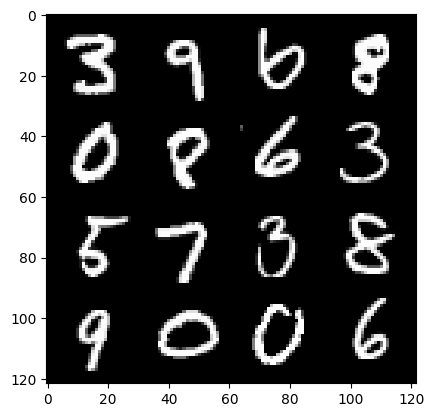

92: step 43500 / Gen loss: 0.8651982446511584 / disc_loss: 0.2312549331287544


  0%|          | 0/469 [00:00<?, ?it/s]

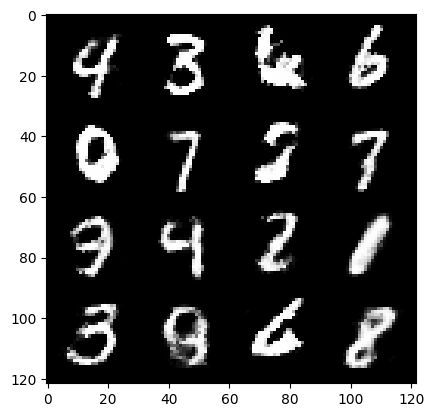

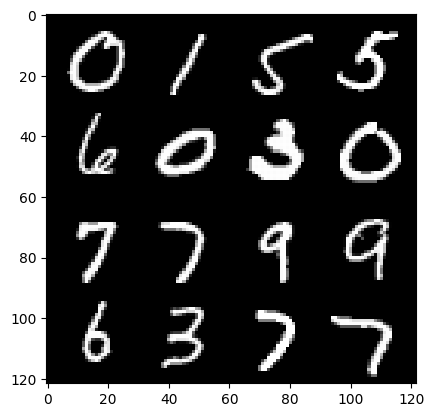

93: step 43800 / Gen loss: 0.8646393058697384 / disc_loss: 0.23391756902138405


  0%|          | 0/469 [00:00<?, ?it/s]

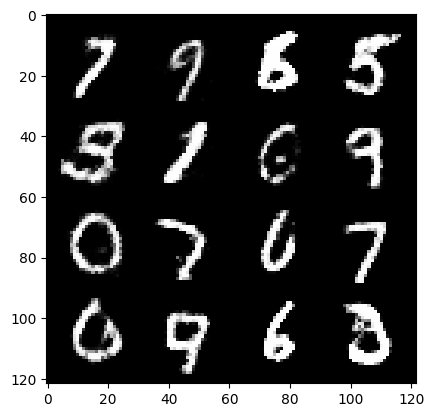

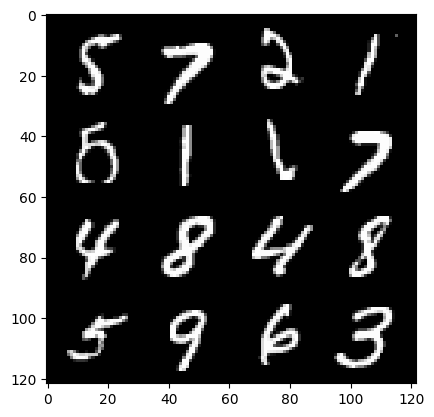

94: step 44100 / Gen loss: 0.8652814350525536 / disc_loss: 0.23253061095873523


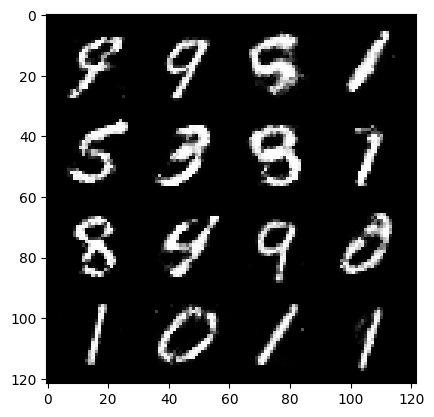

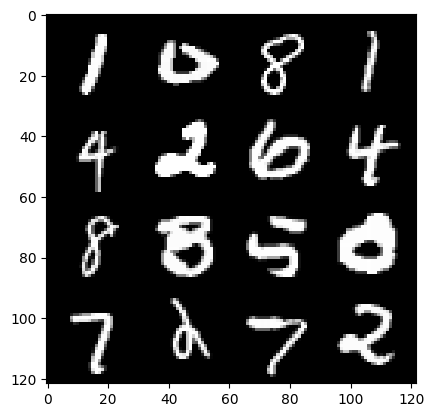

94: step 44400 / Gen loss: 0.8639796638488775 / disc_loss: 0.23017049213250473


  0%|          | 0/469 [00:00<?, ?it/s]

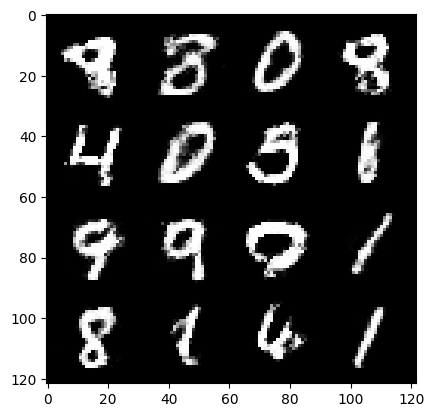

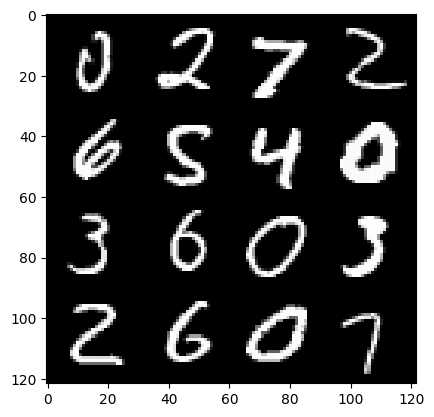

95: step 44700 / Gen loss: 0.8657296651601799 / disc_loss: 0.23110003963112827


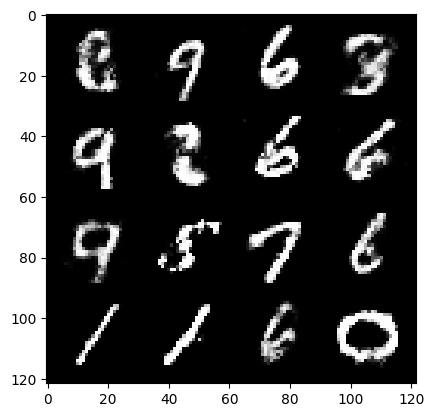

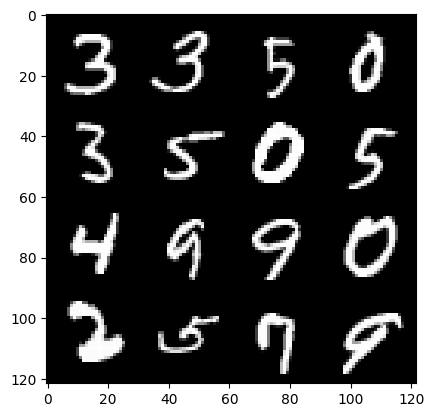

95: step 45000 / Gen loss: 0.8578053438663483 / disc_loss: 0.2361351074278354


  0%|          | 0/469 [00:00<?, ?it/s]

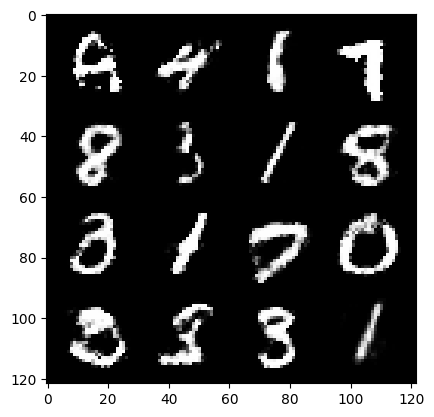

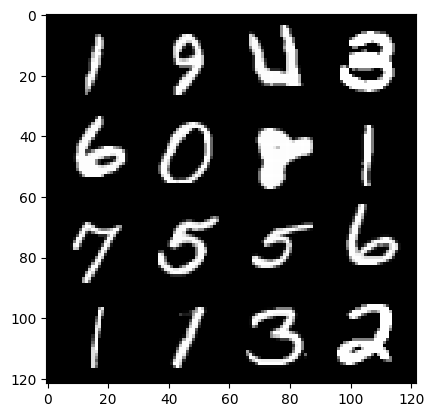

96: step 45300 / Gen loss: 0.859162416855494 / disc_loss: 0.23615284080306695


  0%|          | 0/469 [00:00<?, ?it/s]

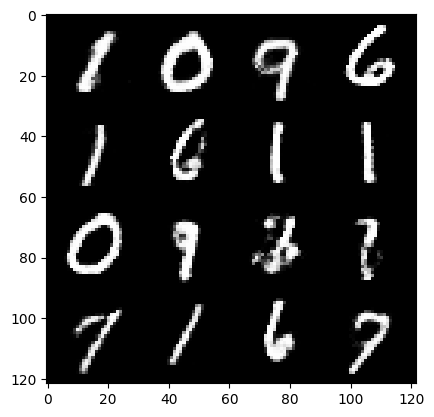

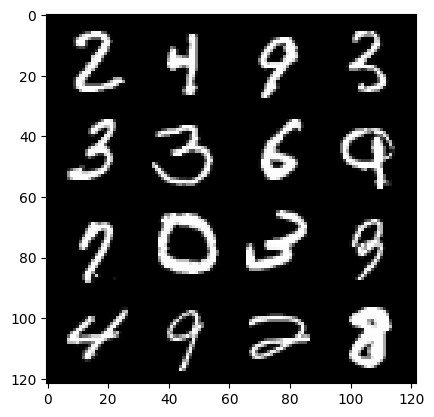

97: step 45600 / Gen loss: 0.8556253675619767 / disc_loss: 0.23938971757888802


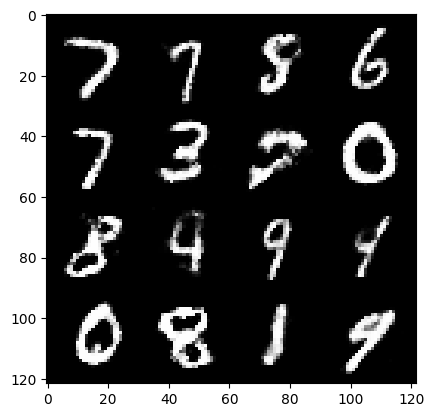

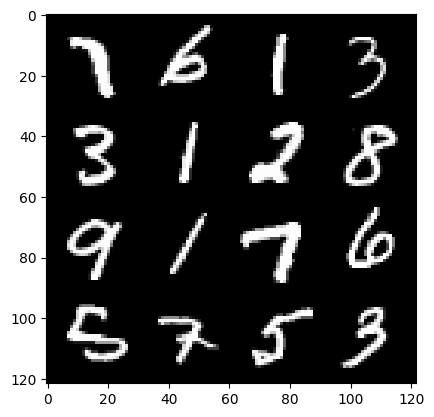

97: step 45900 / Gen loss: 0.8528767935434975 / disc_loss: 0.23760702237486836


  0%|          | 0/469 [00:00<?, ?it/s]

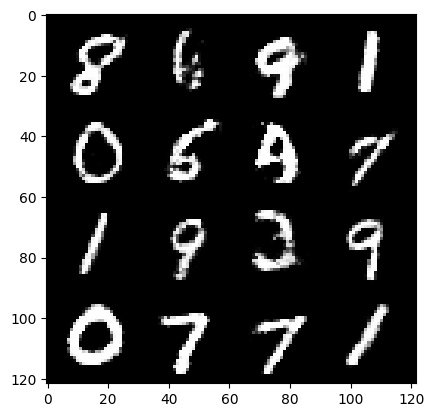

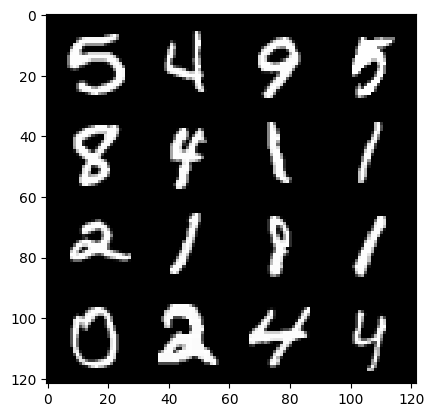

98: step 46200 / Gen loss: 0.8560048311948771 / disc_loss: 0.24323524221777926


  0%|          | 0/469 [00:00<?, ?it/s]

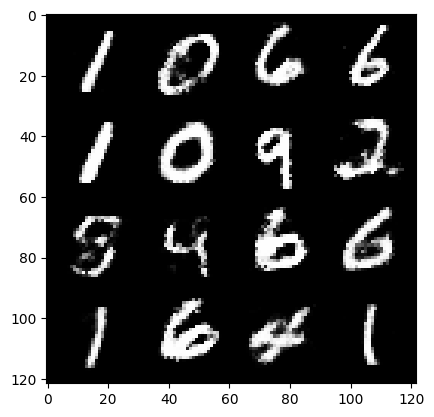

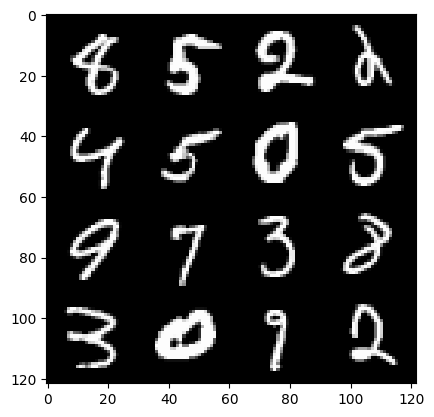

99: step 46500 / Gen loss: 0.8533475567897155 / disc_loss: 0.24708114340901388


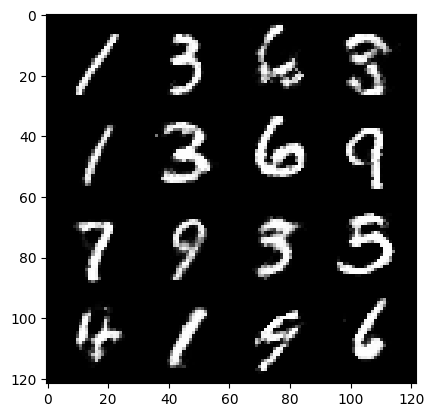

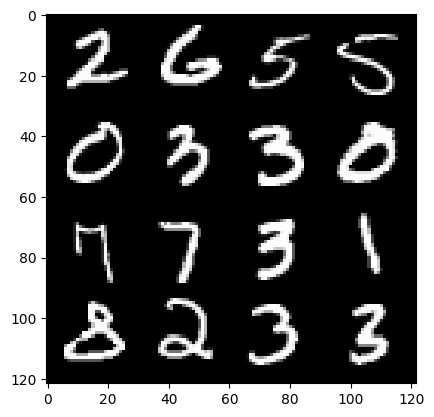

99: step 46800 / Gen loss: 0.8561684598525368 / disc_loss: 0.24208982706069954


  0%|          | 0/469 [00:00<?, ?it/s]

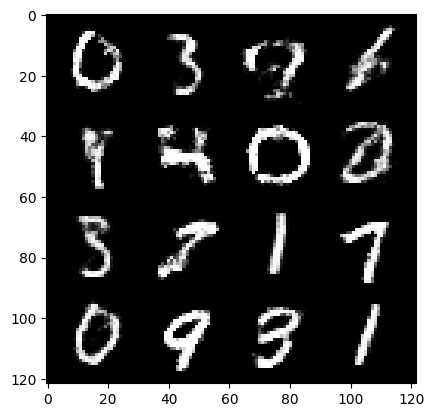

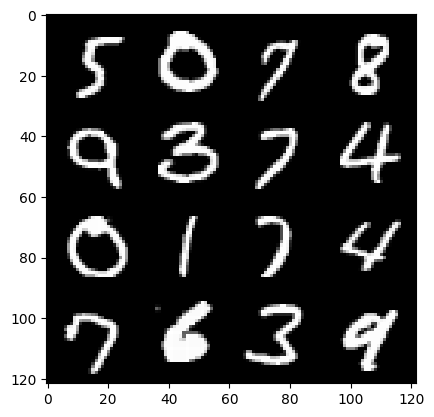

100: step 47100 / Gen loss: 0.8490060891707738 / disc_loss: 0.2442211946348348


  0%|          | 0/469 [00:00<?, ?it/s]

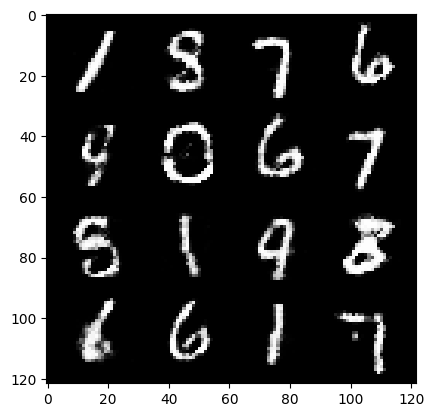

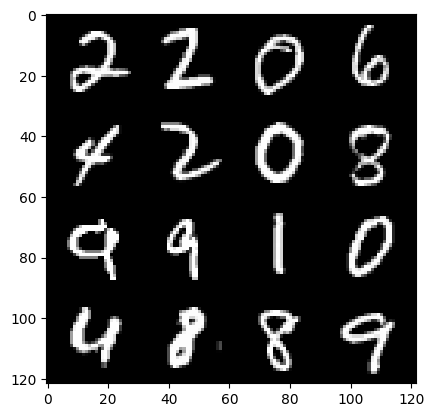

101: step 47400 / Gen loss: 0.8457233069340385 / disc_loss: 0.2553786744177342


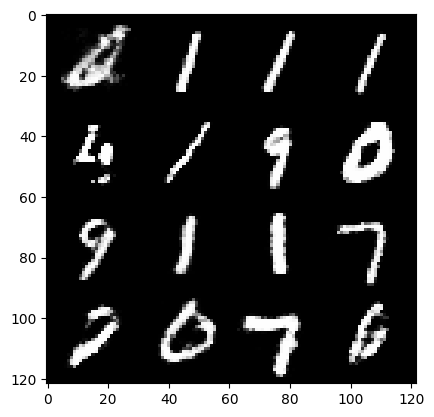

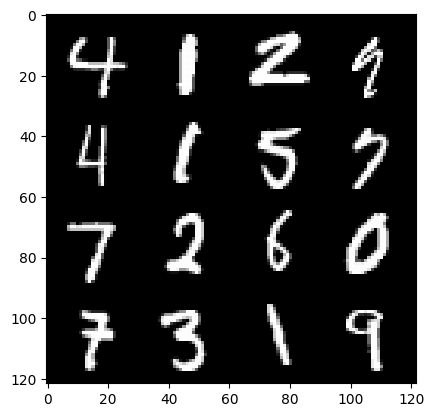

101: step 47700 / Gen loss: 0.8469036293029786 / disc_loss: 0.24525127549966172


  0%|          | 0/469 [00:00<?, ?it/s]

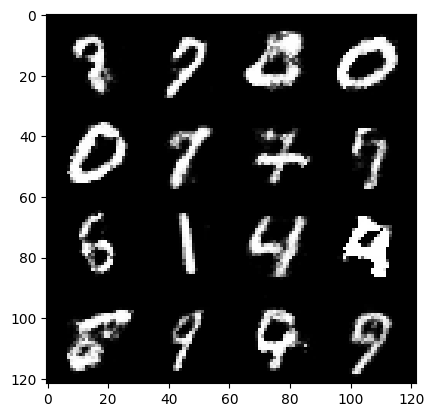

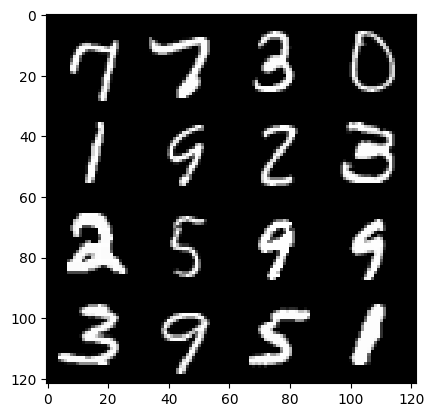

102: step 48000 / Gen loss: 0.8476652089754743 / disc_loss: 0.24356662645936006


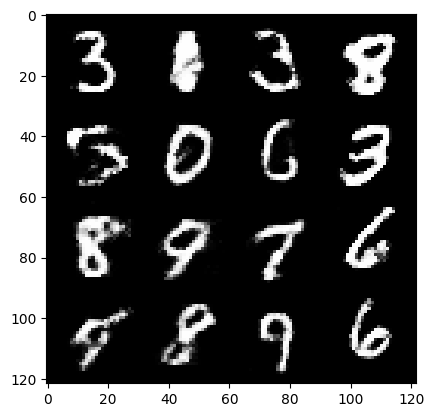

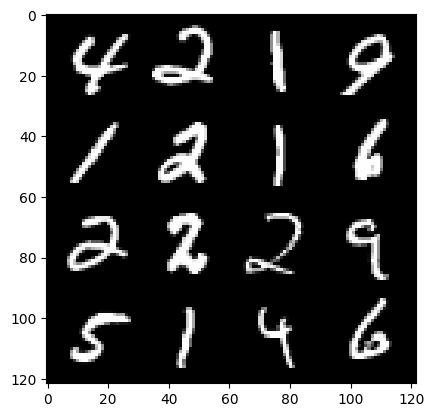

102: step 48300 / Gen loss: 0.850056358575821 / disc_loss: 0.2440724845727284


  0%|          | 0/469 [00:00<?, ?it/s]

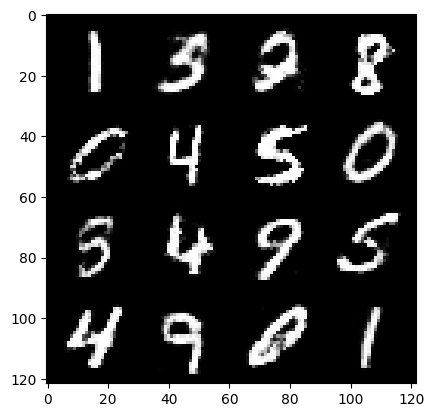

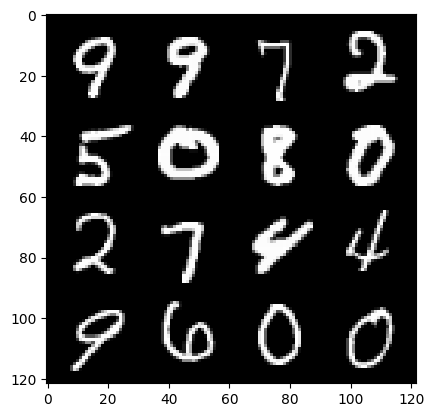

103: step 48600 / Gen loss: 0.847544986009598 / disc_loss: 0.2524183565874896


  0%|          | 0/469 [00:00<?, ?it/s]

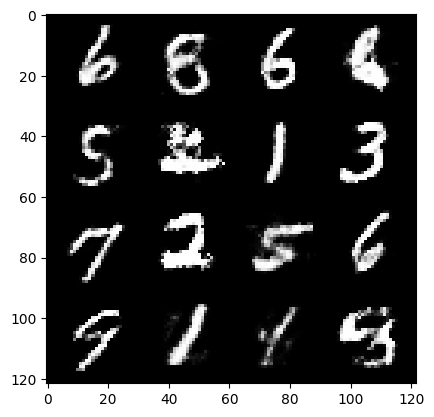

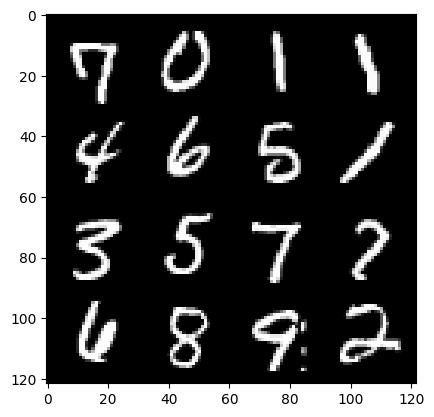

104: step 48900 / Gen loss: 0.8441254287958148 / disc_loss: 0.25496329451600713


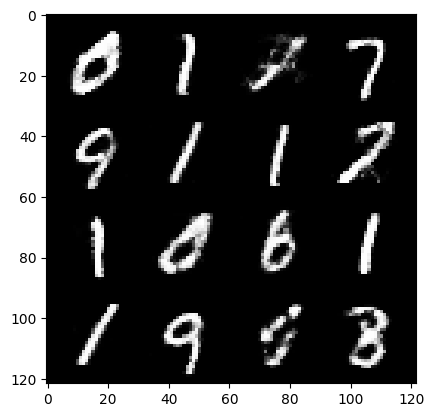

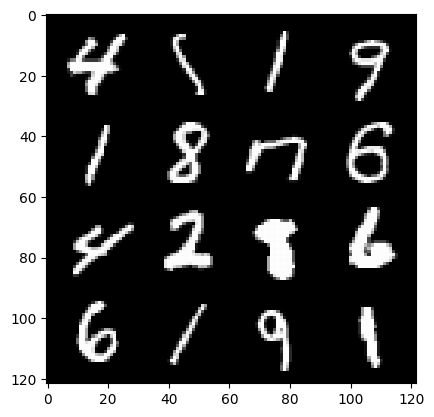

104: step 49200 / Gen loss: 0.8412136612335837 / disc_loss: 0.2536830934882163


  0%|          | 0/469 [00:00<?, ?it/s]

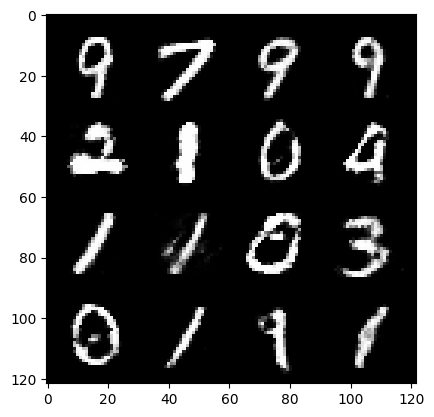

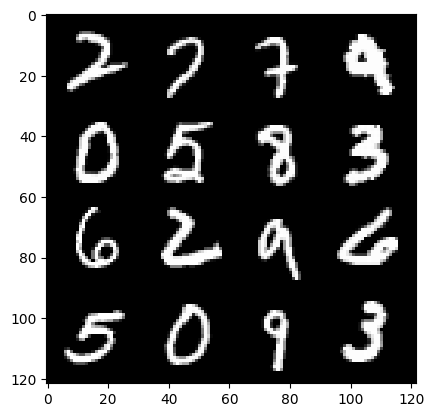

105: step 49500 / Gen loss: 0.8468099335829422 / disc_loss: 0.2472295733789603


  0%|          | 0/469 [00:00<?, ?it/s]

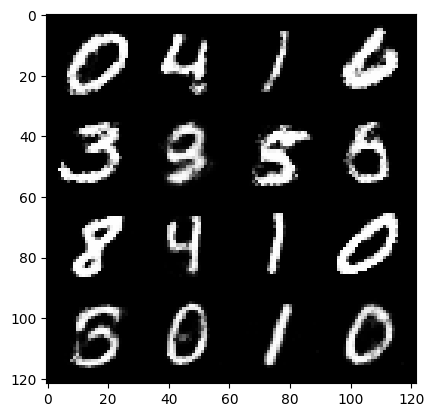

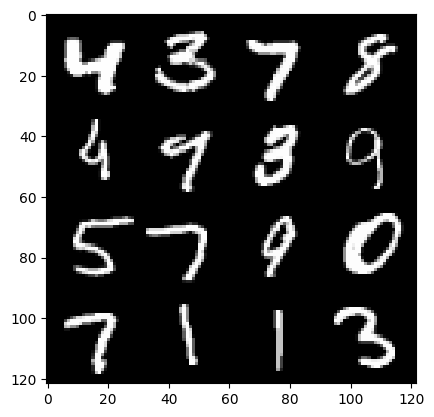

106: step 49800 / Gen loss: 0.8394741278886803 / disc_loss: 0.25635955716172865


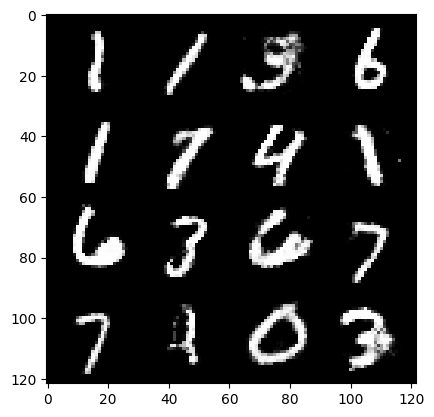

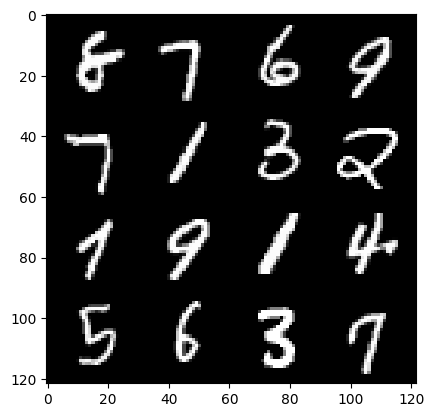

106: step 50100 / Gen loss: 0.8394378874699274 / disc_loss: 0.25252907092372595


  0%|          | 0/469 [00:00<?, ?it/s]

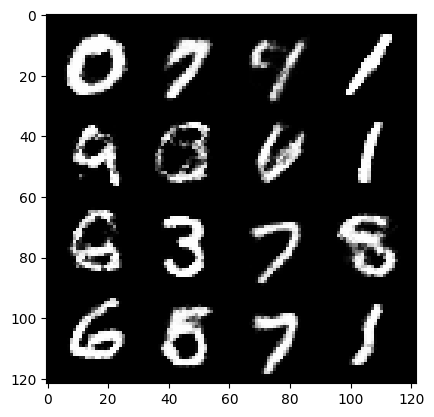

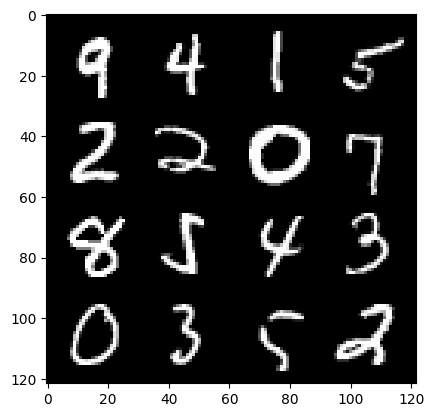

107: step 50400 / Gen loss: 0.8392910760641097 / disc_loss: 0.2527526833613713


  0%|          | 0/469 [00:00<?, ?it/s]

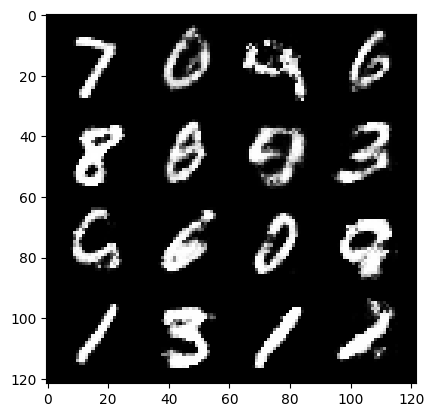

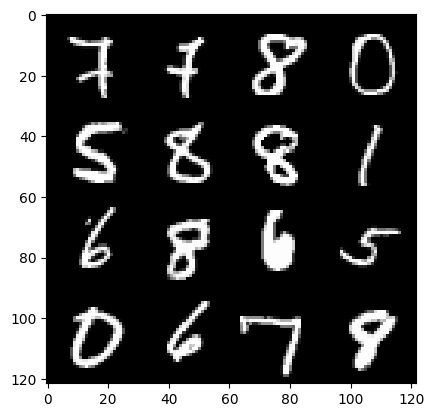

108: step 50700 / Gen loss: 0.8426043345530826 / disc_loss: 0.2510778542856375


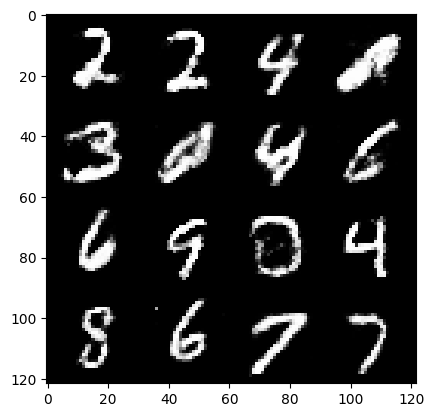

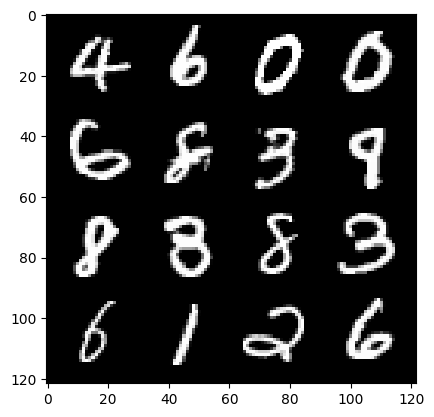

108: step 51000 / Gen loss: 0.844853890140851 / disc_loss: 0.24793781081835428


  0%|          | 0/469 [00:00<?, ?it/s]

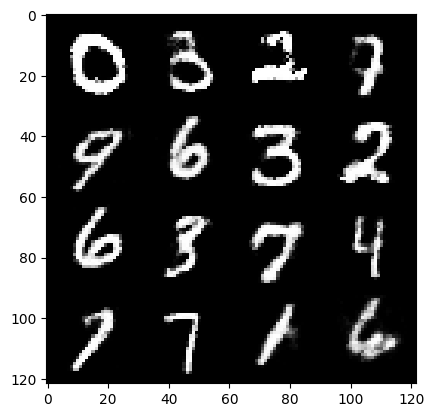

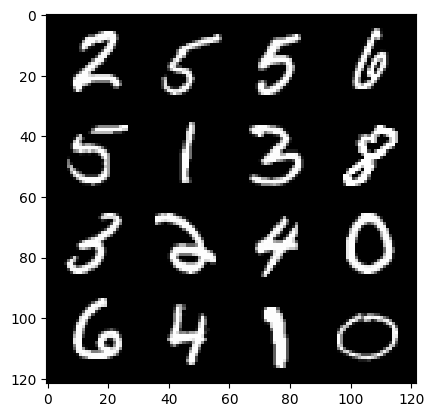

109: step 51300 / Gen loss: 0.832513360182444 / disc_loss: 0.25553818970918646


  0%|          | 0/469 [00:00<?, ?it/s]

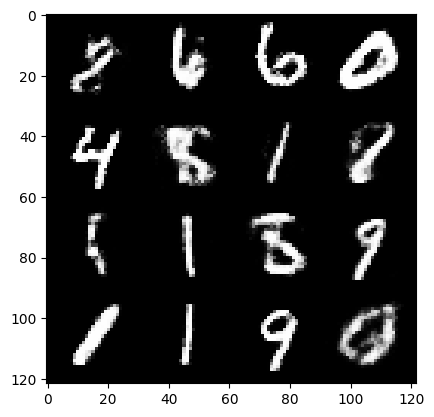

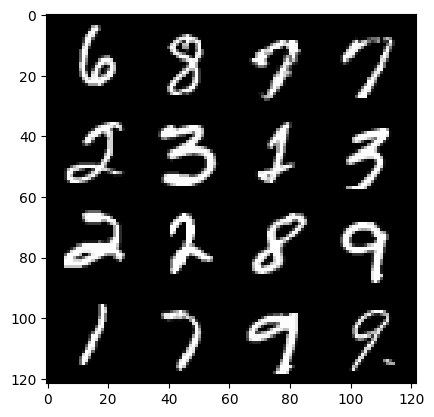

110: step 51600 / Gen loss: 0.8367157963911698 / disc_loss: 0.25265773266553887


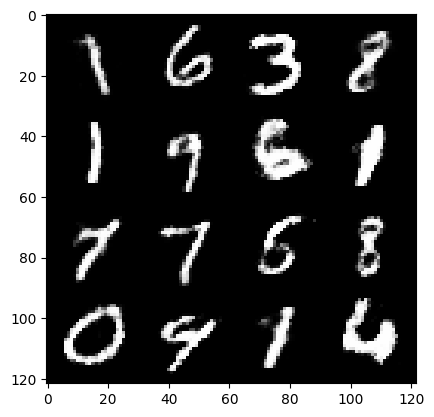

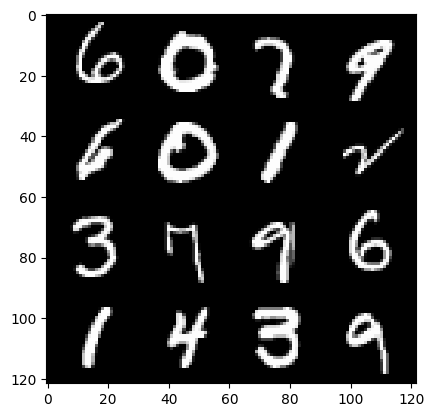

110: step 51900 / Gen loss: 0.8360718017816539 / disc_loss: 0.2551902649799983


  0%|          | 0/469 [00:00<?, ?it/s]

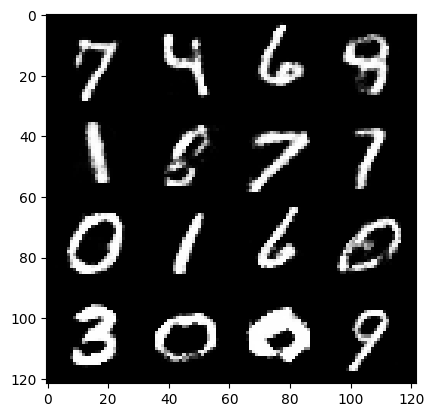

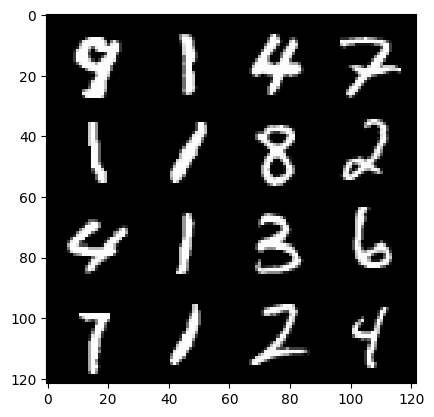

111: step 52200 / Gen loss: 0.8307374296585718 / disc_loss: 0.26037762244542434


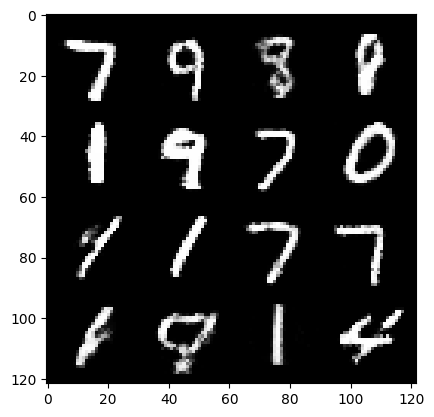

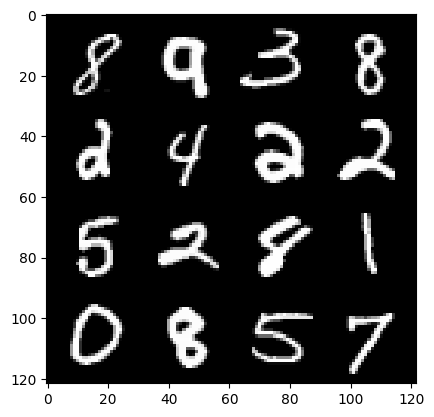

111: step 52500 / Gen loss: 0.8291202578941986 / disc_loss: 0.26508745690186847


  0%|          | 0/469 [00:00<?, ?it/s]

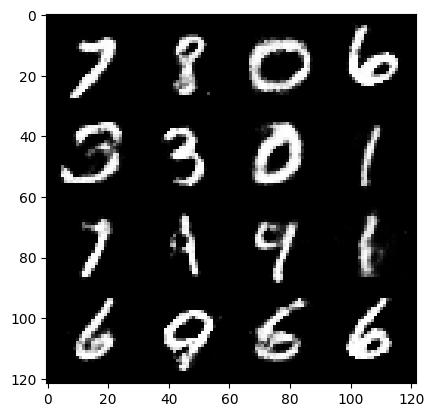

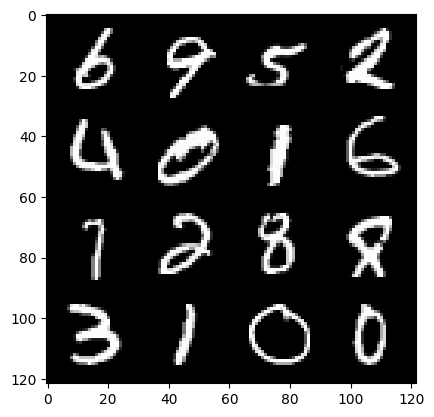

112: step 52800 / Gen loss: 0.8348043076197306 / disc_loss: 0.2543395419915516


  0%|          | 0/469 [00:00<?, ?it/s]

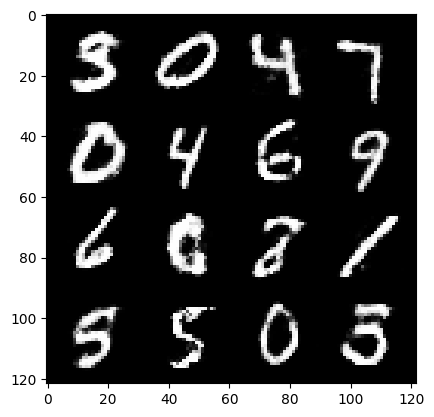

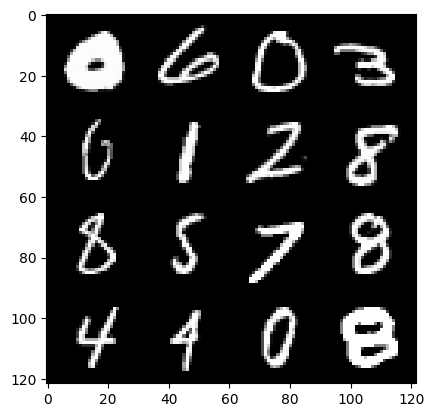

113: step 53100 / Gen loss: 0.8324967676401142 / disc_loss: 0.2633624539275965


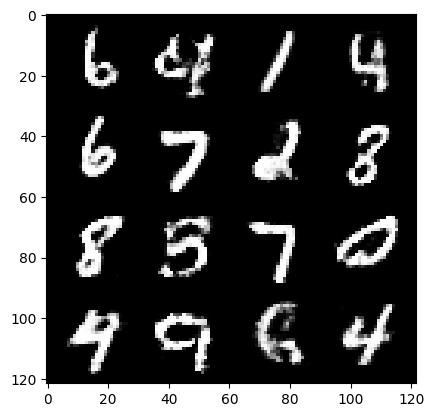

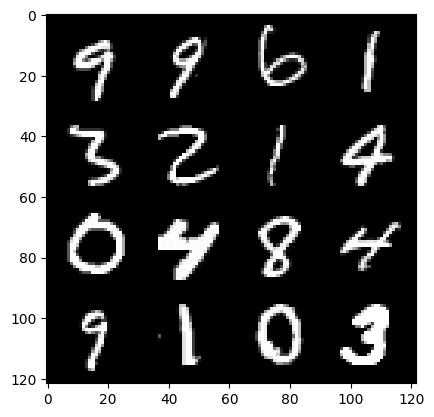

113: step 53400 / Gen loss: 0.8365536810954408 / disc_loss: 0.26038479944070186


  0%|          | 0/469 [00:00<?, ?it/s]

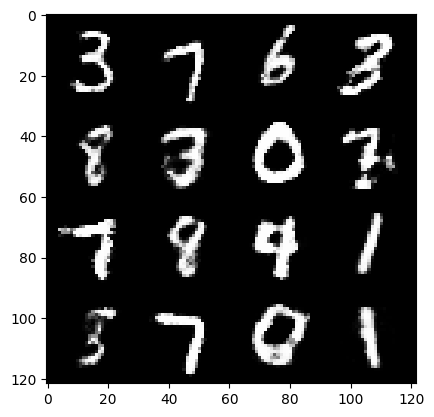

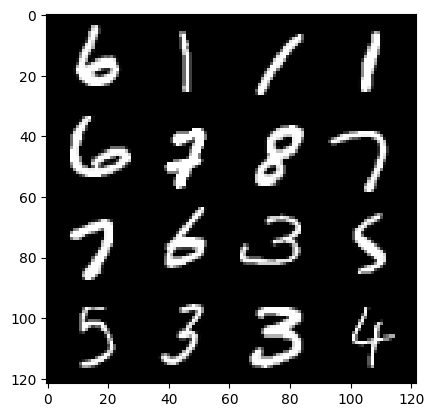

114: step 53700 / Gen loss: 0.8315889193614322 / disc_loss: 0.2593789838751156


  0%|          | 0/469 [00:00<?, ?it/s]

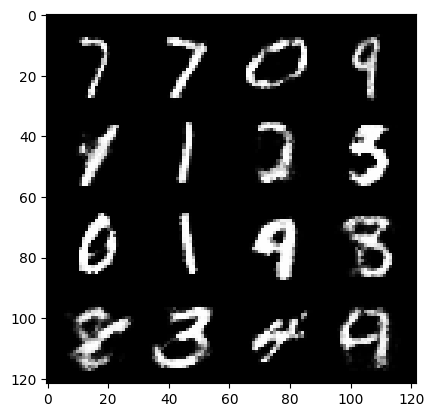

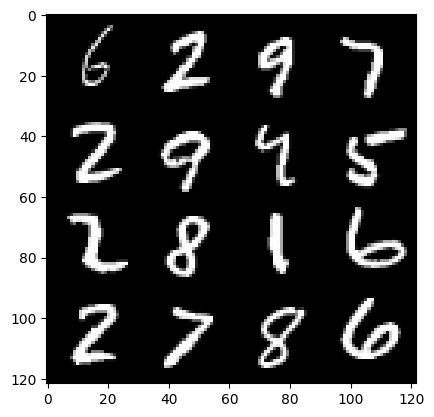

115: step 54000 / Gen loss: 0.8346358515818911 / disc_loss: 0.262659655511379


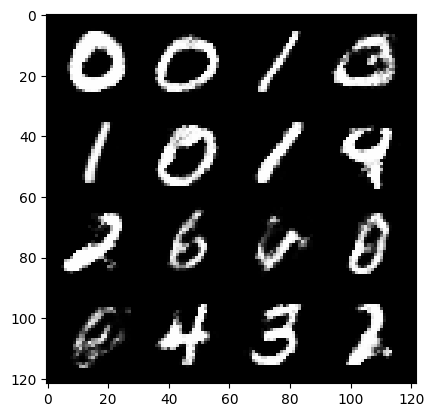

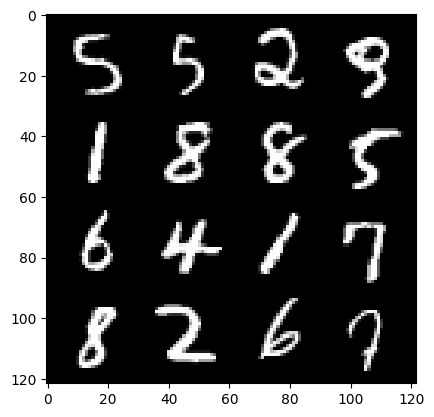

115: step 54300 / Gen loss: 0.8289054000377655 / disc_loss: 0.25966134975353866


  0%|          | 0/469 [00:00<?, ?it/s]

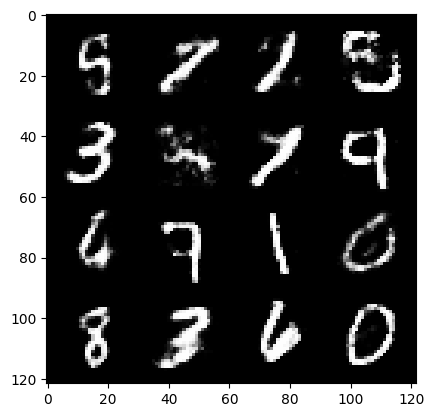

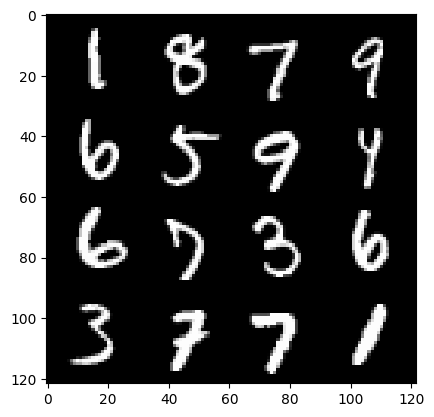

116: step 54600 / Gen loss: 0.8294660349686944 / disc_loss: 0.26362214351693797


  0%|          | 0/469 [00:00<?, ?it/s]

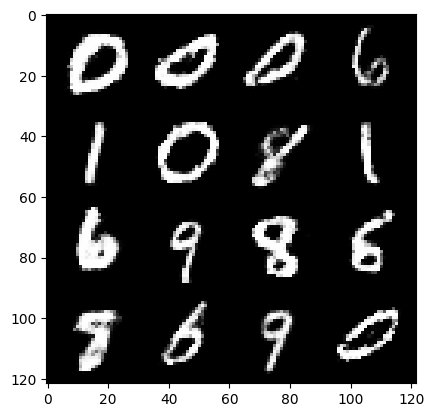

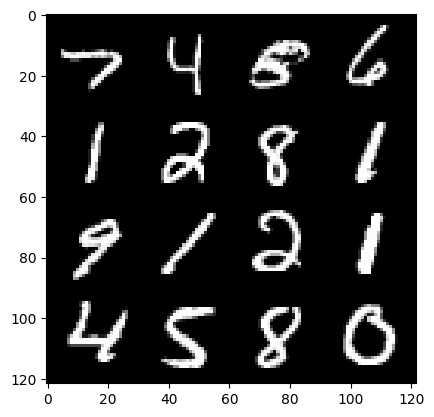

117: step 54900 / Gen loss: 0.8226205207904185 / disc_loss: 0.26498197471102075


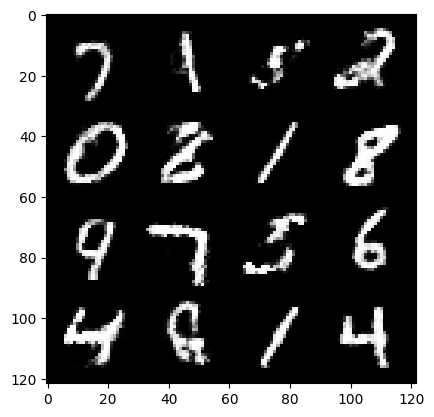

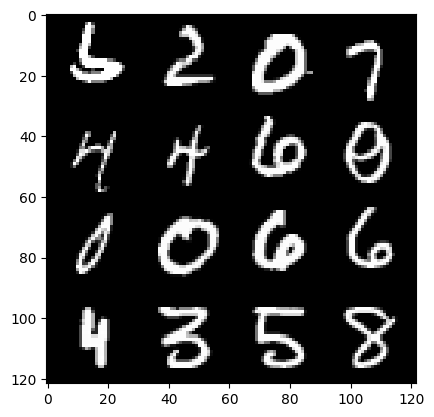

117: step 55200 / Gen loss: 0.8371160189310715 / disc_loss: 0.2560766898592312


  0%|          | 0/469 [00:00<?, ?it/s]

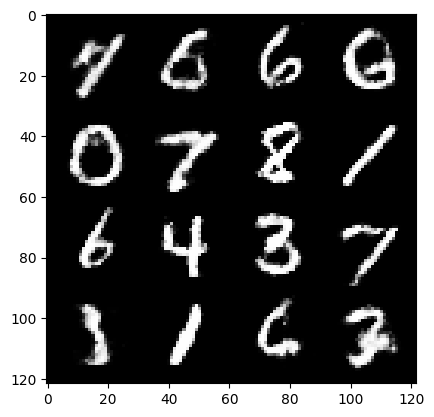

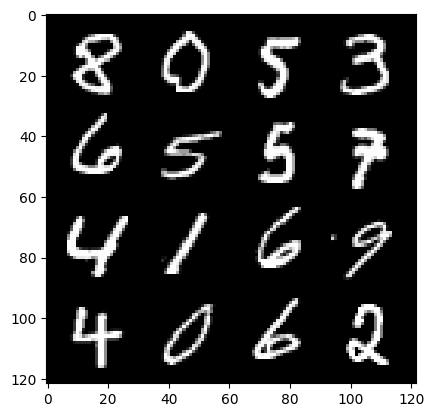

118: step 55500 / Gen loss: 0.8245959617694212 / disc_loss: 0.26810162514448155


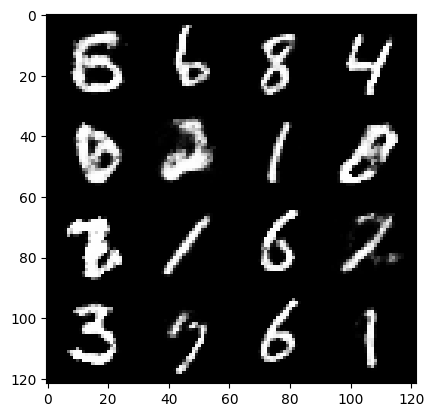

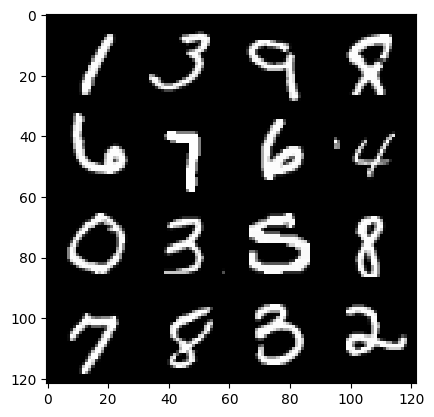

118: step 55800 / Gen loss: 0.8268415985504789 / disc_loss: 0.2681453019877274


  0%|          | 0/469 [00:00<?, ?it/s]

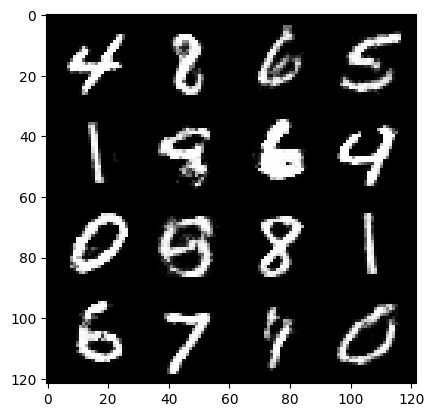

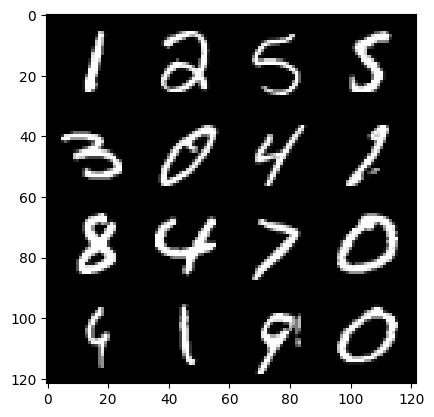

119: step 56100 / Gen loss: 0.8262494605779641 / disc_loss: 0.26490865568319943


  0%|          | 0/469 [00:00<?, ?it/s]

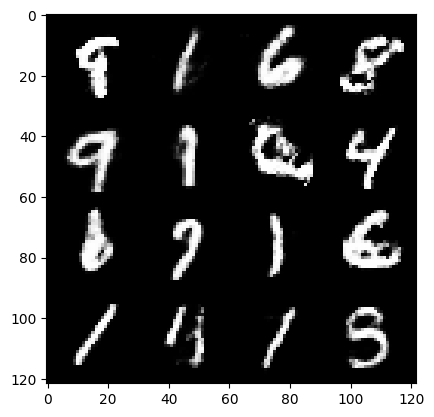

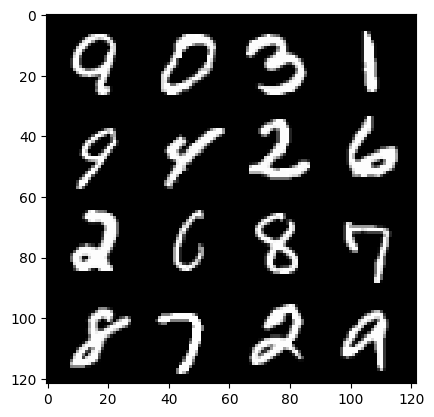

120: step 56400 / Gen loss: 0.8241754327217736 / disc_loss: 0.26556987613439537


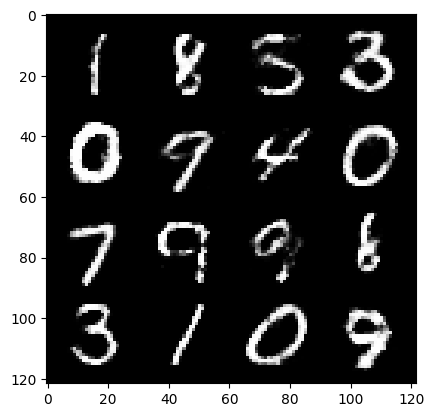

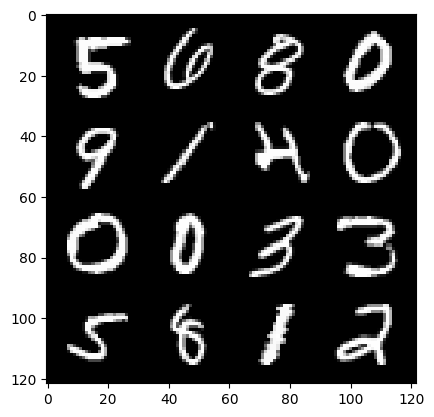

120: step 56700 / Gen loss: 0.8256572502851489 / disc_loss: 0.2689552306632203


  0%|          | 0/469 [00:00<?, ?it/s]

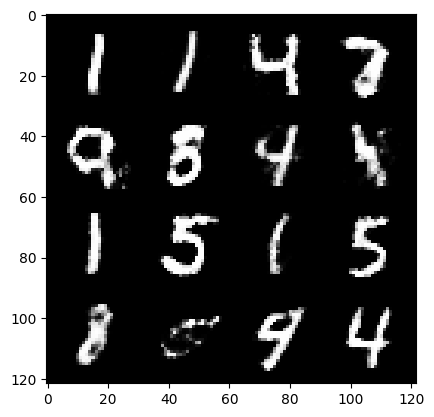

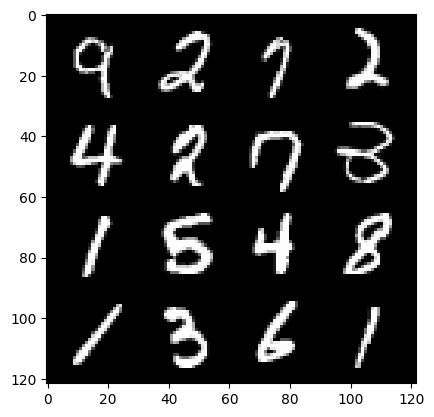

121: step 57000 / Gen loss: 0.8256779148181278 / disc_loss: 0.26260574296116823


  0%|          | 0/469 [00:00<?, ?it/s]

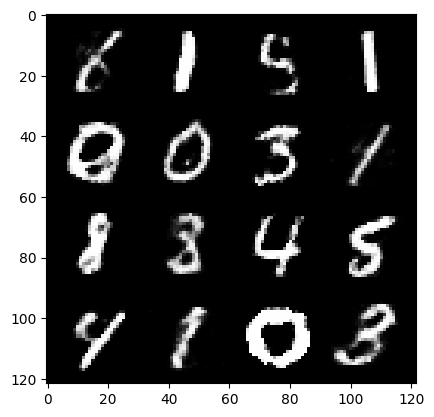

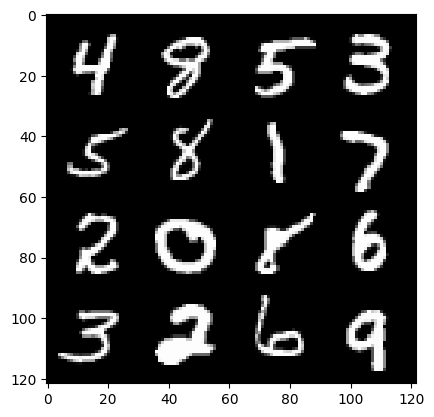

122: step 57300 / Gen loss: 0.8254642840226494 / disc_loss: 0.2683652879794437


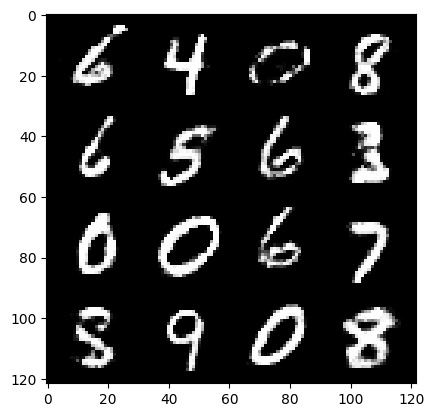

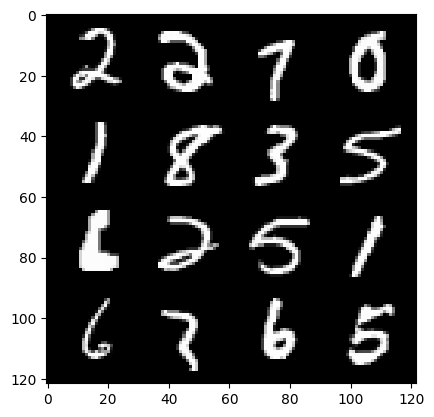

122: step 57600 / Gen loss: 0.8239979823430381 / disc_loss: 0.2671931069095929


  0%|          | 0/469 [00:00<?, ?it/s]

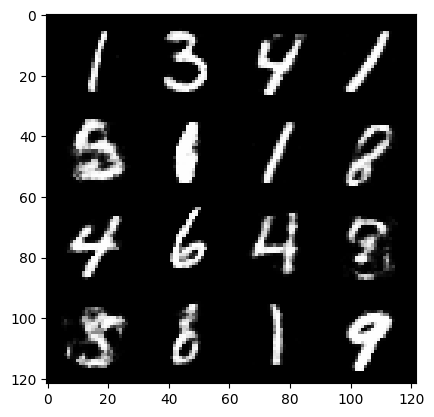

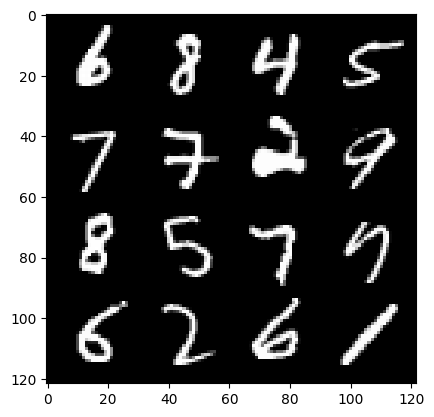

123: step 57900 / Gen loss: 0.8266227080424624 / disc_loss: 0.2680490120251974


  0%|          | 0/469 [00:00<?, ?it/s]

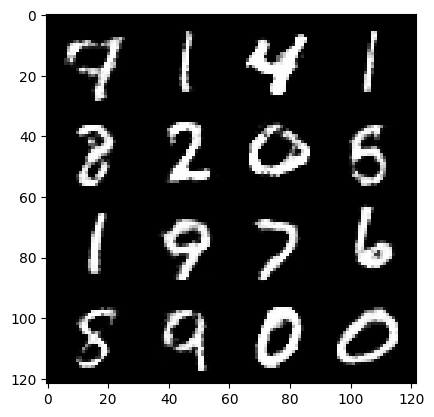

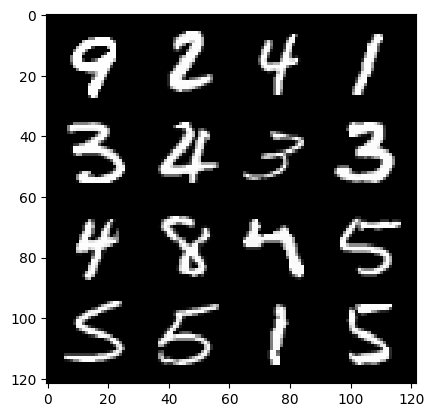

124: step 58200 / Gen loss: 0.824048789540927 / disc_loss: 0.26803733040889105


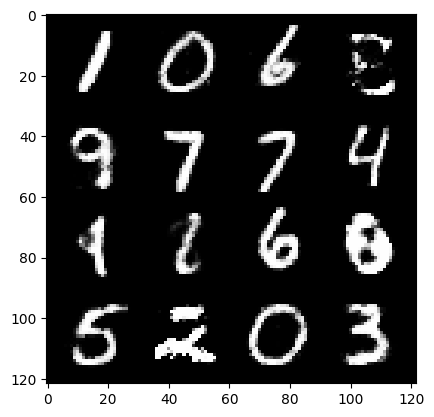

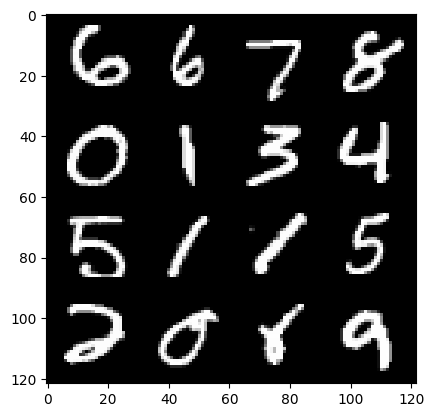

124: step 58500 / Gen loss: 0.8238467671473824 / disc_loss: 0.26169616331656775


  0%|          | 0/469 [00:00<?, ?it/s]

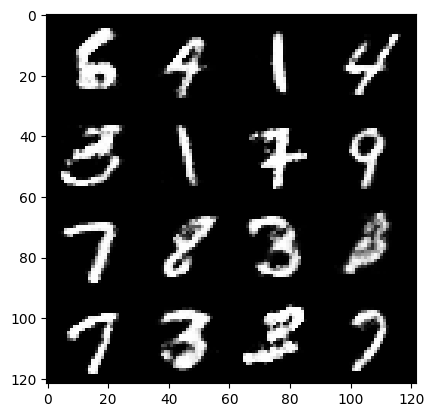

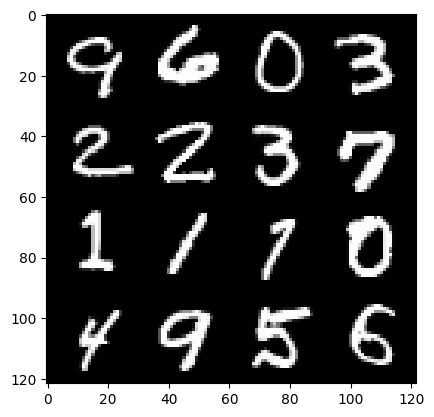

125: step 58800 / Gen loss: 0.8302184993028646 / disc_loss: 0.260276249895493


  0%|          | 0/469 [00:00<?, ?it/s]

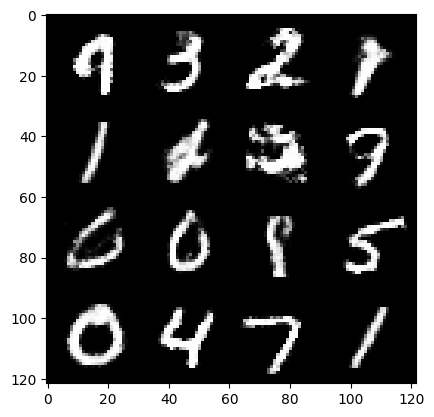

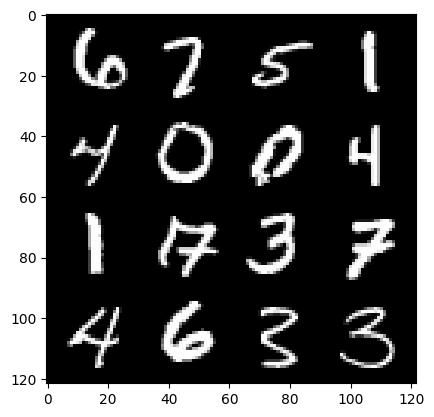

126: step 59100 / Gen loss: 0.8216994885603581 / disc_loss: 0.26488360097010955


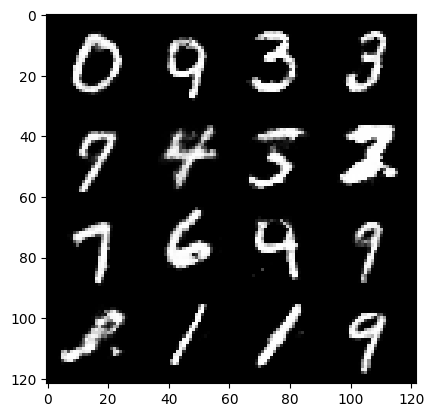

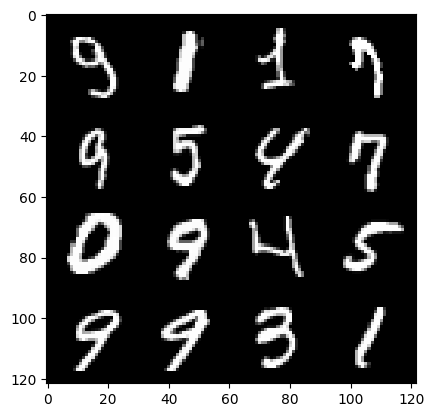

126: step 59400 / Gen loss: 0.8183927591641743 / disc_loss: 0.2631482730805874


  0%|          | 0/469 [00:00<?, ?it/s]

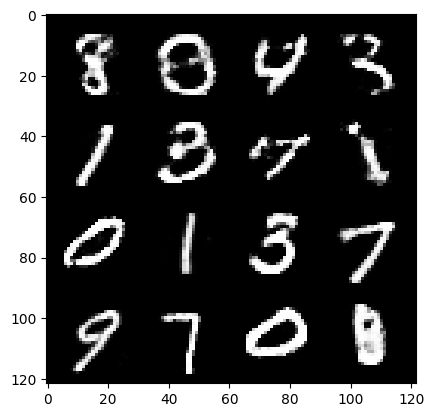

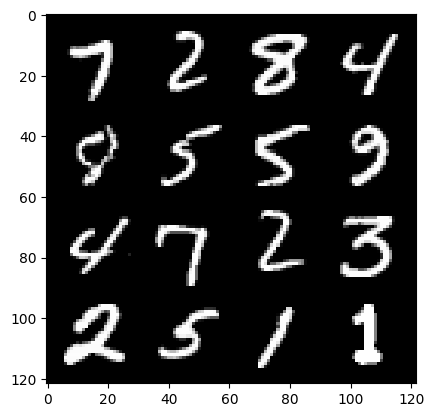

127: step 59700 / Gen loss: 0.8241108073790864 / disc_loss: 0.26891309832533217


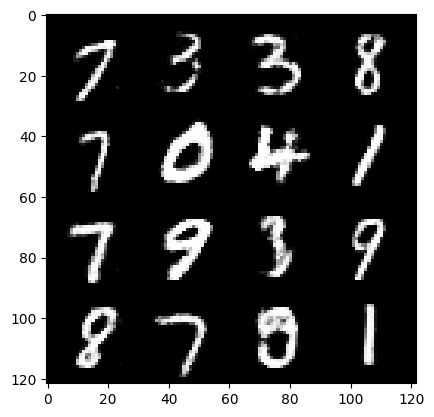

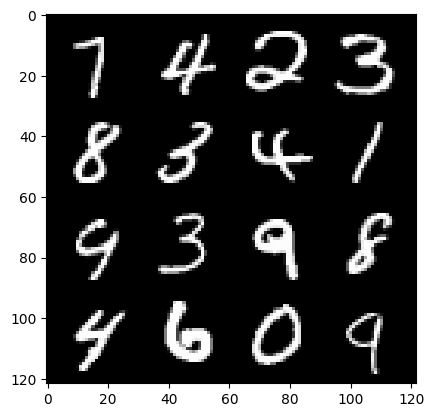

127: step 60000 / Gen loss: 0.8253919446468345 / disc_loss: 0.2646678719421228


  0%|          | 0/469 [00:00<?, ?it/s]

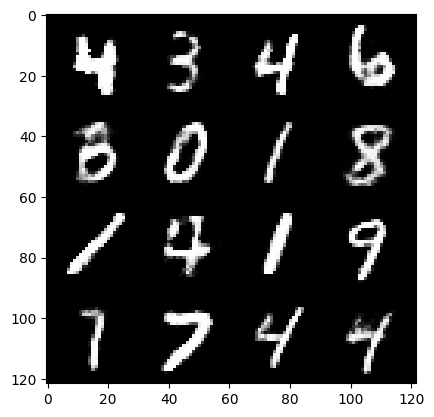

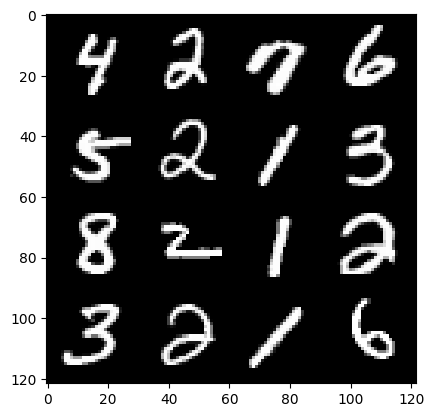

128: step 60300 / Gen loss: 0.8260894687970475 / disc_loss: 0.26724137385686253


  0%|          | 0/469 [00:00<?, ?it/s]

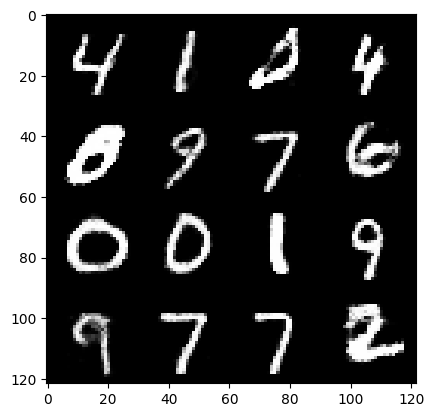

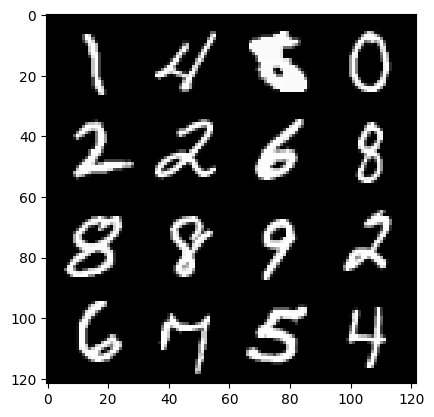

129: step 60600 / Gen loss: 0.8191857727368668 / disc_loss: 0.2707417352000874


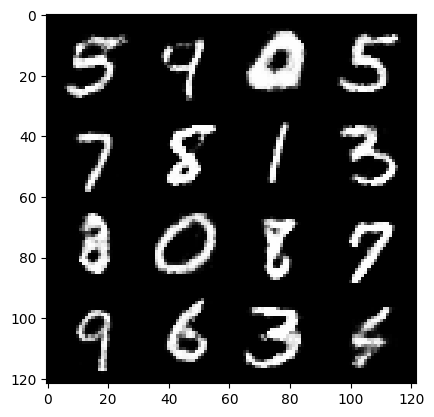

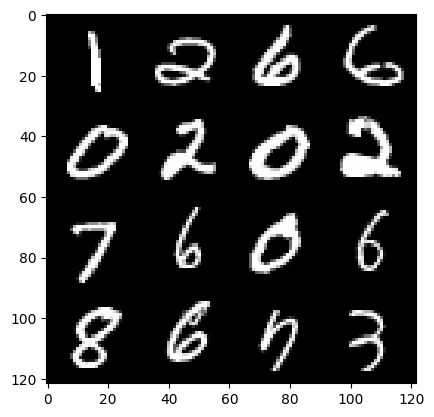

129: step 60900 / Gen loss: 0.8185331759850184 / disc_loss: 0.26817580779393524


  0%|          | 0/469 [00:00<?, ?it/s]

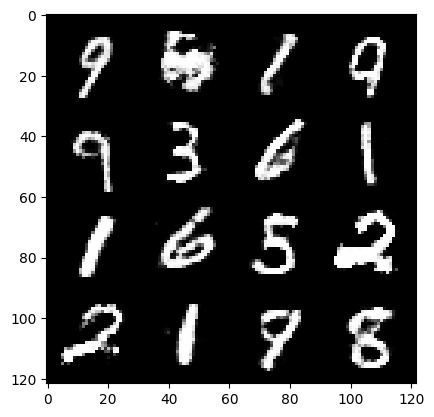

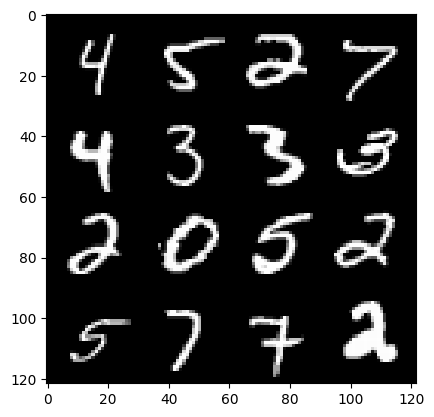

130: step 61200 / Gen loss: 0.8242323740323386 / disc_loss: 0.26750444884101526


  0%|          | 0/469 [00:00<?, ?it/s]

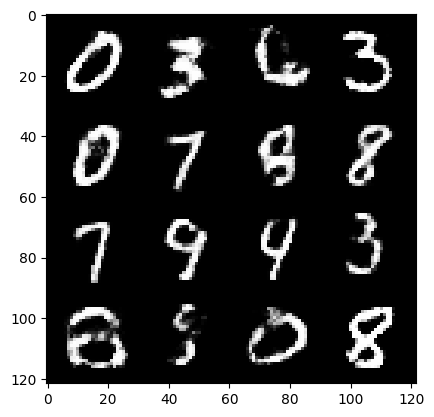

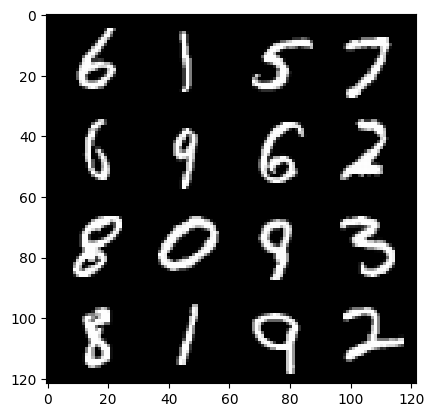

131: step 61500 / Gen loss: 0.8228890470663703 / disc_loss: 0.27011102303862566


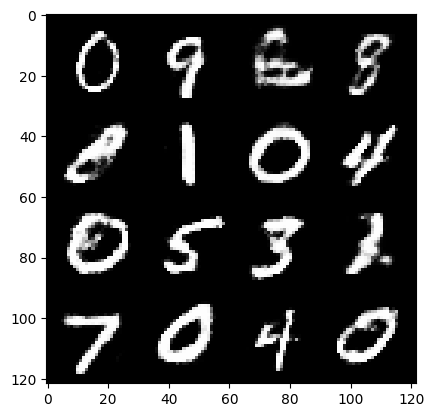

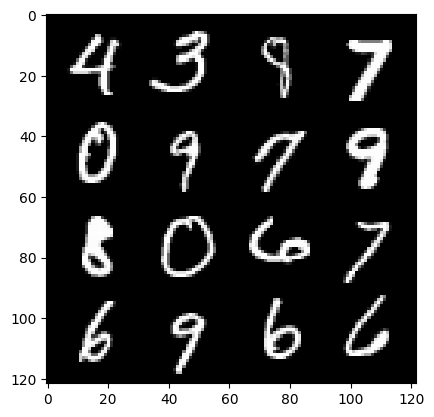

131: step 61800 / Gen loss: 0.8218078502019244 / disc_loss: 0.26846249461174


  0%|          | 0/469 [00:00<?, ?it/s]

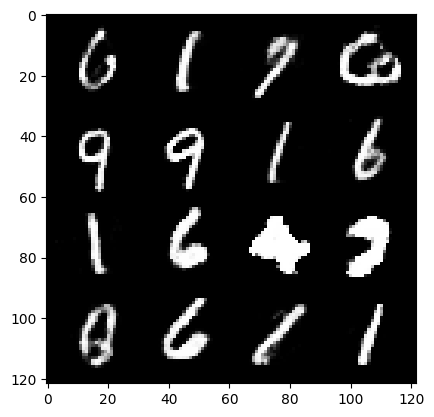

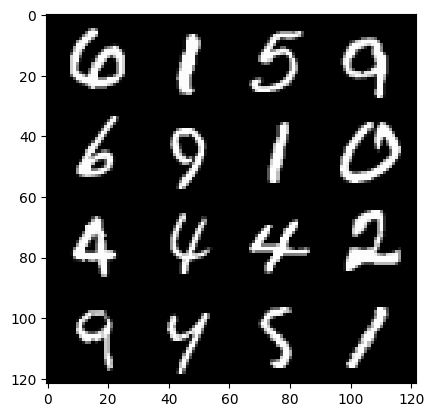

132: step 62100 / Gen loss: 0.8181711965799332 / disc_loss: 0.26823854302366573


  0%|          | 0/469 [00:00<?, ?it/s]

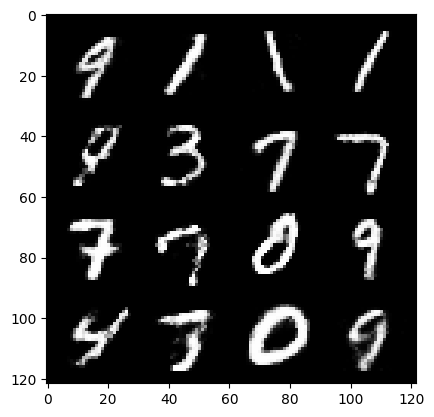

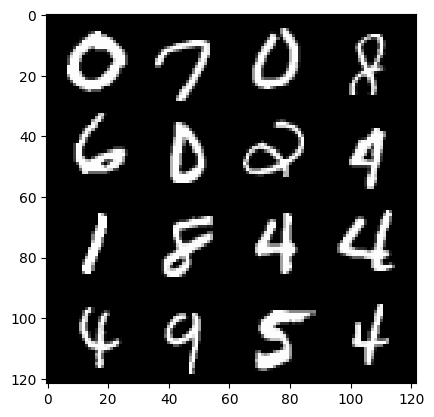

133: step 62400 / Gen loss: 0.8144915874799094 / disc_loss: 0.2768109325567881


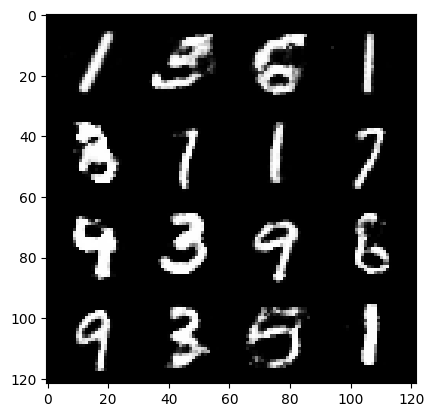

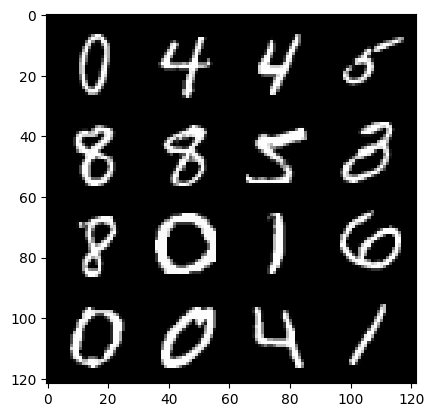

133: step 62700 / Gen loss: 0.814232633908589 / disc_loss: 0.27358166093627606


  0%|          | 0/469 [00:00<?, ?it/s]

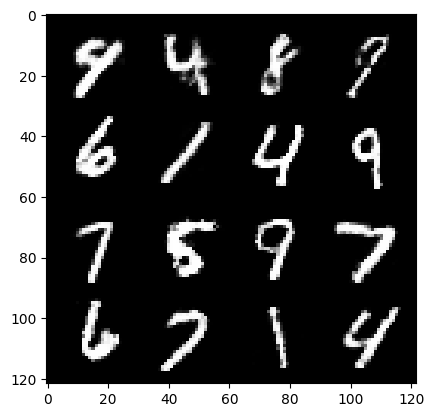

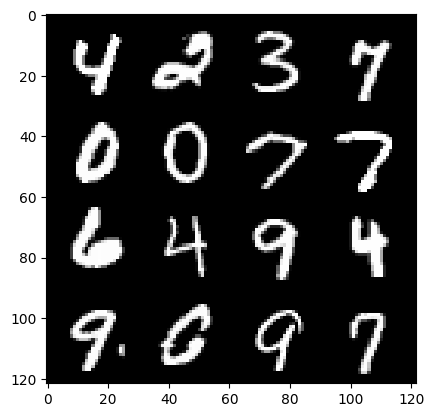

134: step 63000 / Gen loss: 0.8198227538665134 / disc_loss: 0.2723820003867151


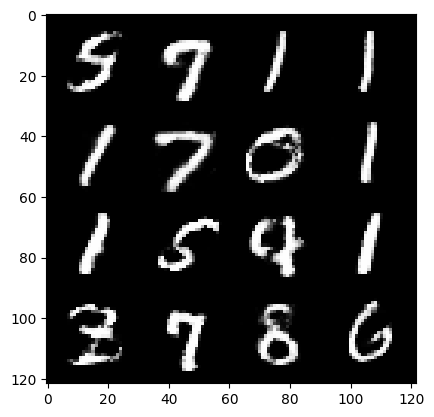

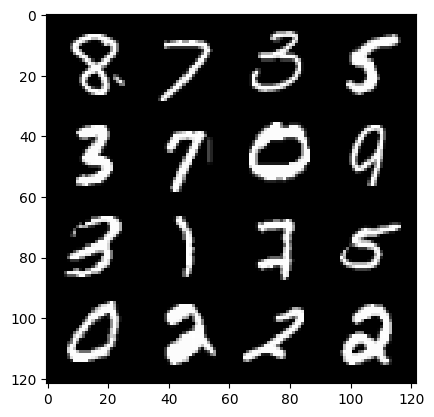

134: step 63300 / Gen loss: 0.8118489505847294 / disc_loss: 0.27595452388127634


  0%|          | 0/469 [00:00<?, ?it/s]

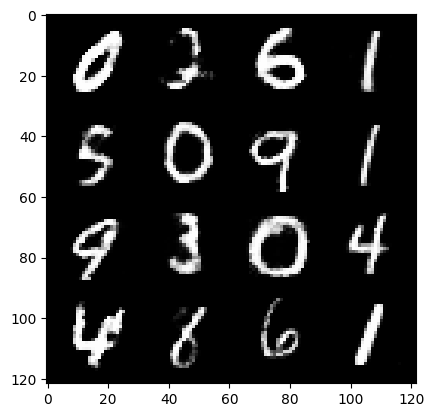

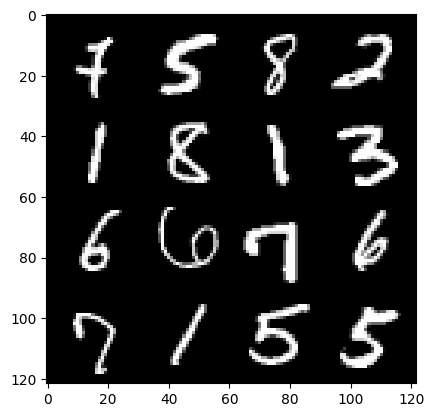

135: step 63600 / Gen loss: 0.8201613559325535 / disc_loss: 0.2659397253890833


  0%|          | 0/469 [00:00<?, ?it/s]

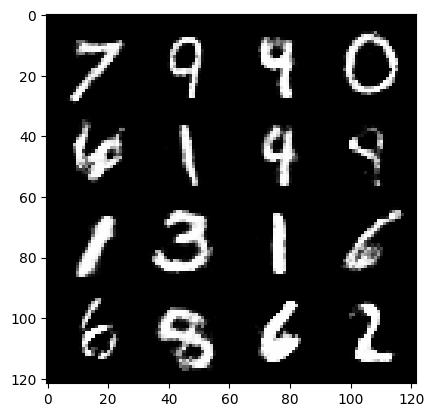

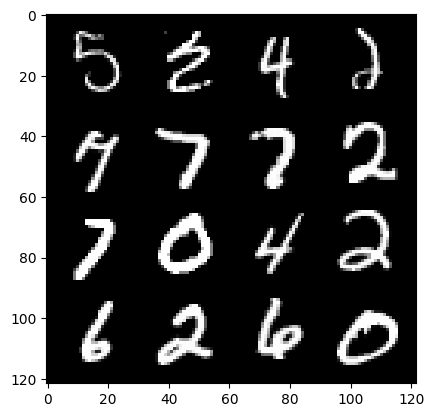

136: step 63900 / Gen loss: 0.8146888005733494 / disc_loss: 0.2799363740285238


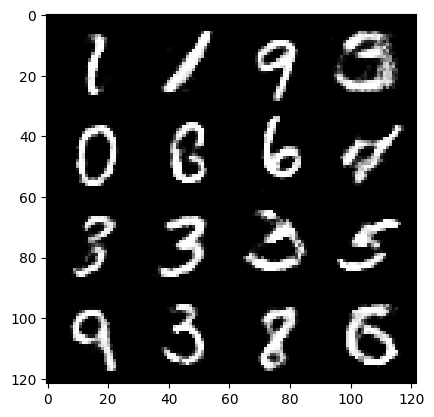

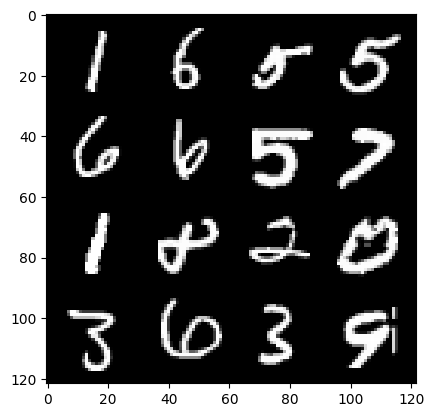

136: step 64200 / Gen loss: 0.8155068657795592 / disc_loss: 0.2733313294251759


  0%|          | 0/469 [00:00<?, ?it/s]

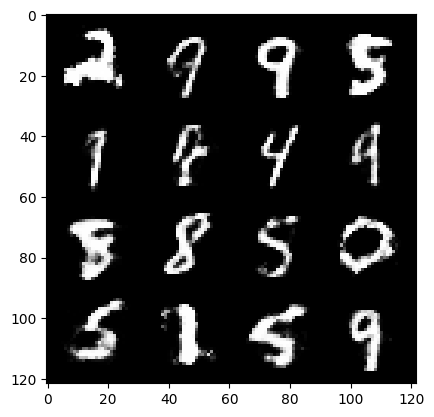

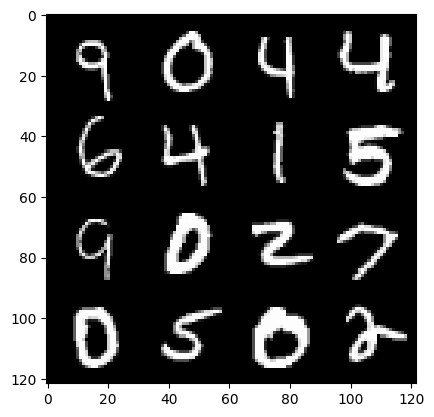

137: step 64500 / Gen loss: 0.8113812311490378 / disc_loss: 0.27775776063402485


  0%|          | 0/469 [00:00<?, ?it/s]

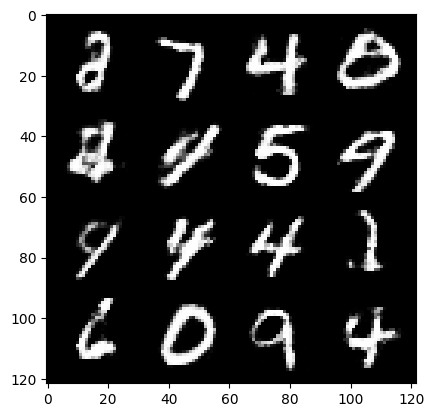

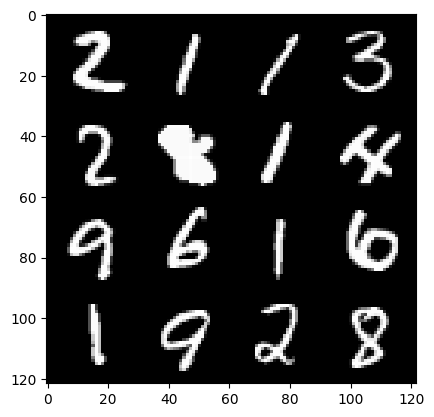

138: step 64800 / Gen loss: 0.8097387015819552 / disc_loss: 0.27554257233937585


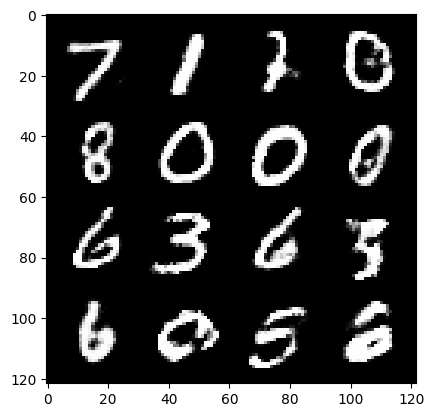

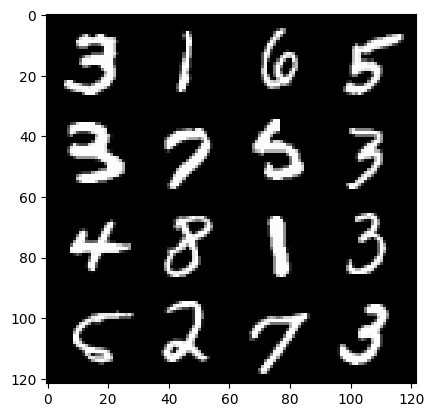

138: step 65100 / Gen loss: 0.8175017619132993 / disc_loss: 0.27256661529342346


  0%|          | 0/469 [00:00<?, ?it/s]

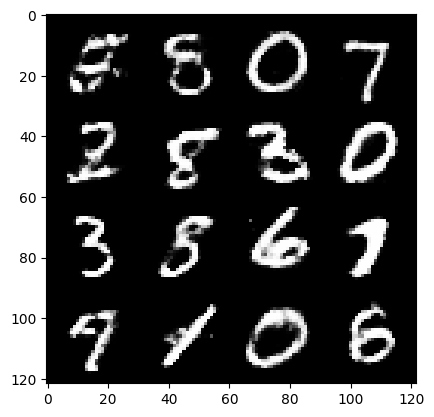

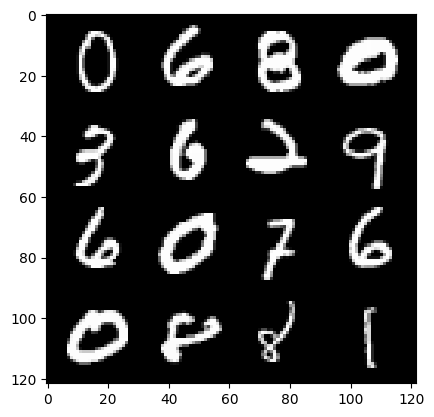

139: step 65400 / Gen loss: 0.8092916657527286 / disc_loss: 0.27912809719642


  0%|          | 0/469 [00:00<?, ?it/s]

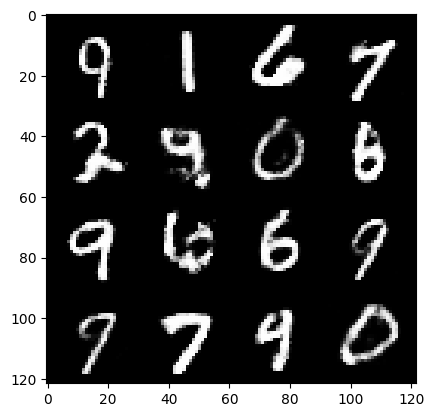

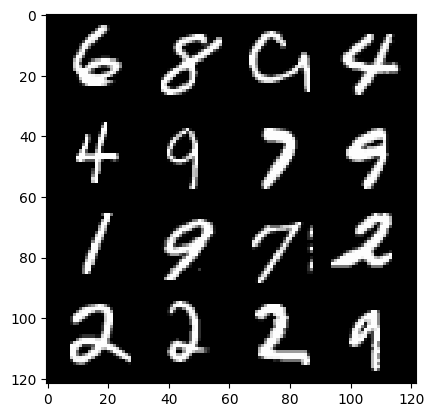

140: step 65700 / Gen loss: 0.8073174176613492 / disc_loss: 0.27743111282587063


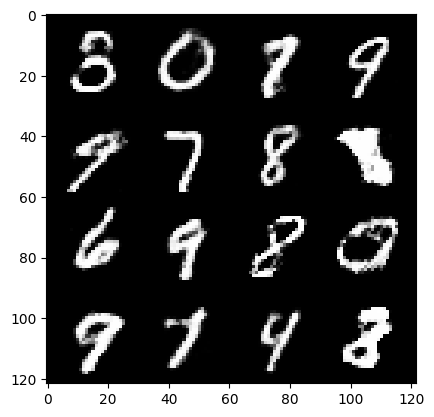

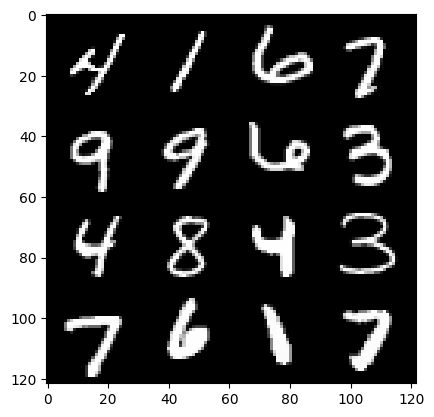

140: step 66000 / Gen loss: 0.807279577453931 / disc_loss: 0.2793297993640104


  0%|          | 0/469 [00:00<?, ?it/s]

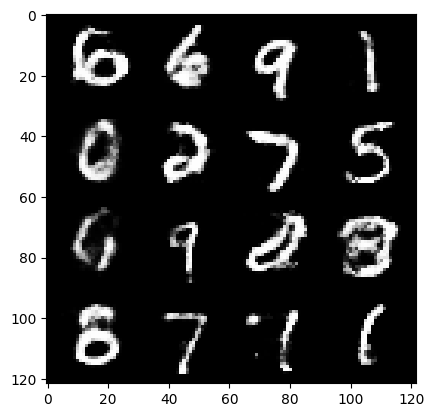

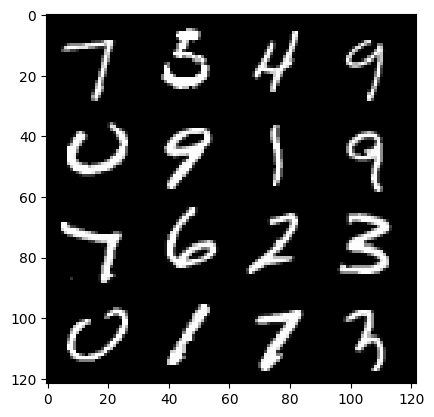

141: step 66300 / Gen loss: 0.814596133033435 / disc_loss: 0.27933163444201164


  0%|          | 0/469 [00:00<?, ?it/s]

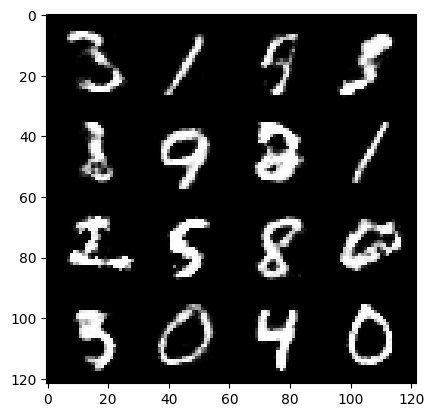

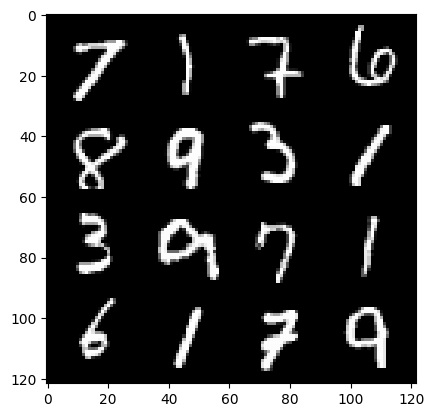

142: step 66600 / Gen loss: 0.810899509191513 / disc_loss: 0.2786759560306866


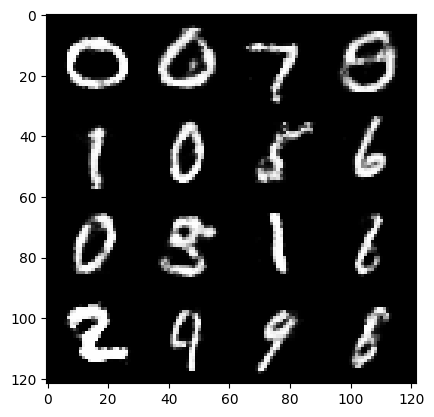

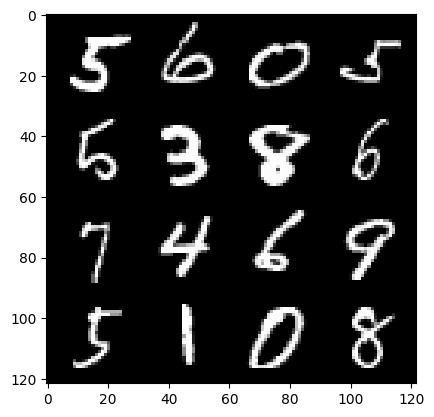

142: step 66900 / Gen loss: 0.8107580381631853 / disc_loss: 0.2764933180312316


  0%|          | 0/469 [00:00<?, ?it/s]

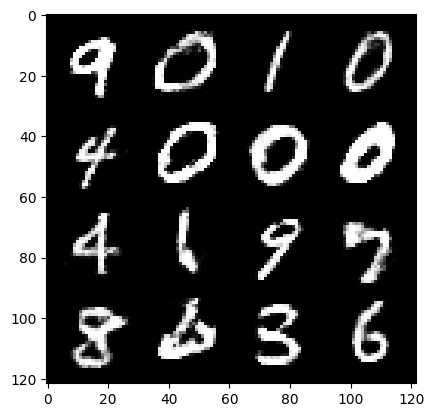

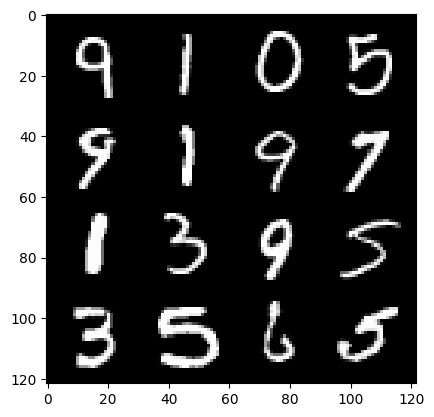

143: step 67200 / Gen loss: 0.8066353702545165 / disc_loss: 0.28212737406293537


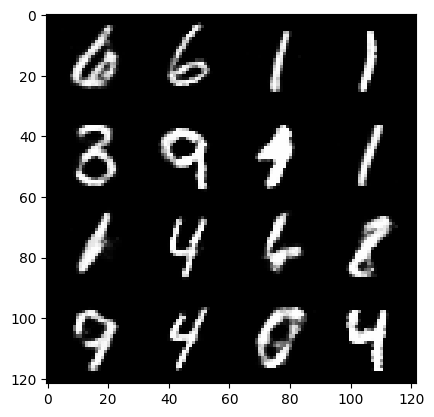

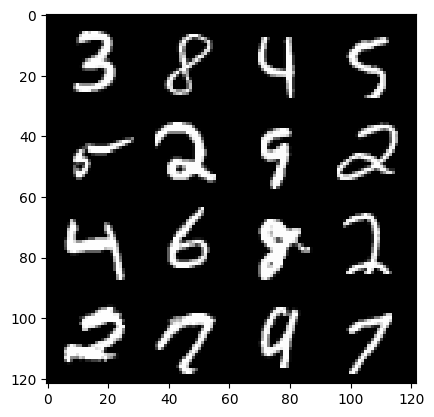

143: step 67500 / Gen loss: 0.8094550681114201 / disc_loss: 0.2775405173500379


  0%|          | 0/469 [00:00<?, ?it/s]

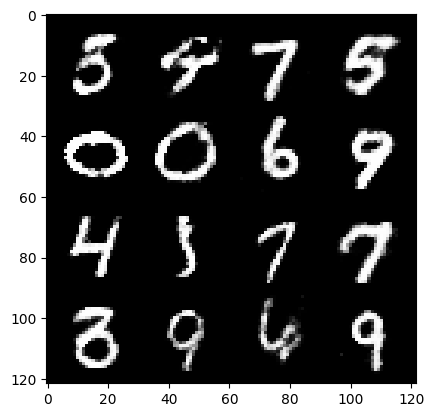

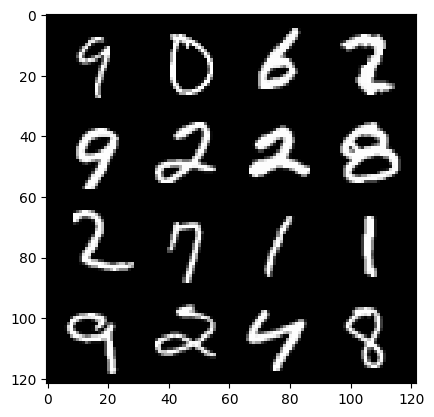

144: step 67800 / Gen loss: 0.8027505108714105 / disc_loss: 0.2844174976150196


  0%|          | 0/469 [00:00<?, ?it/s]

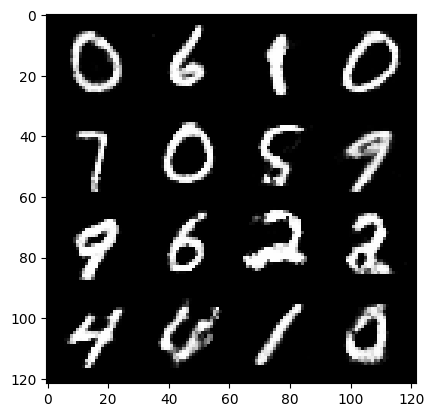

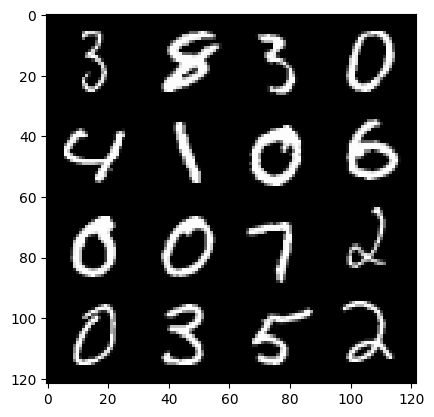

145: step 68100 / Gen loss: 0.8110965106884634 / disc_loss: 0.27397854382793113


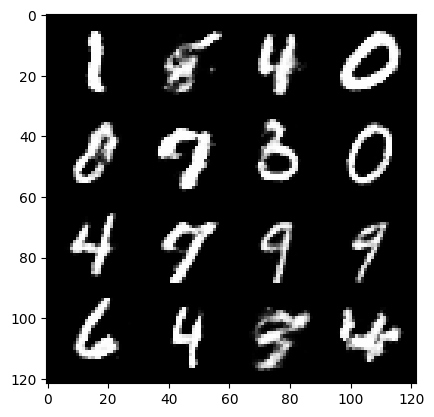

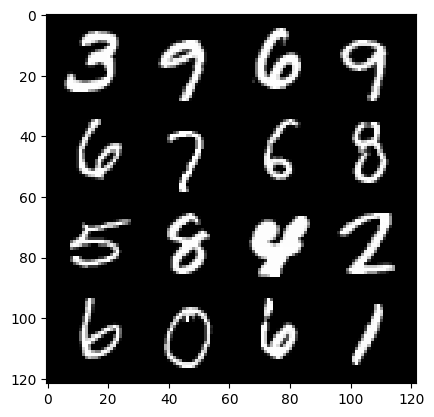

145: step 68400 / Gen loss: 0.8062571785847342 / disc_loss: 0.27726526185870165


  0%|          | 0/469 [00:00<?, ?it/s]

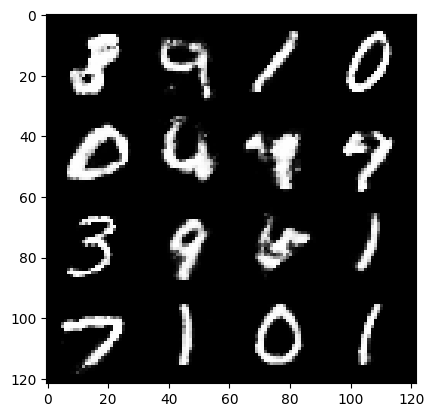

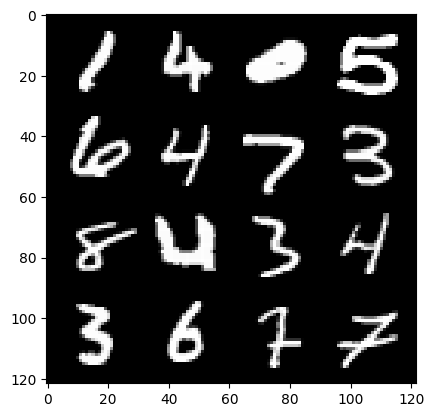

146: step 68700 / Gen loss: 0.8064150732755659 / disc_loss: 0.2785492382943632


  0%|          | 0/469 [00:00<?, ?it/s]

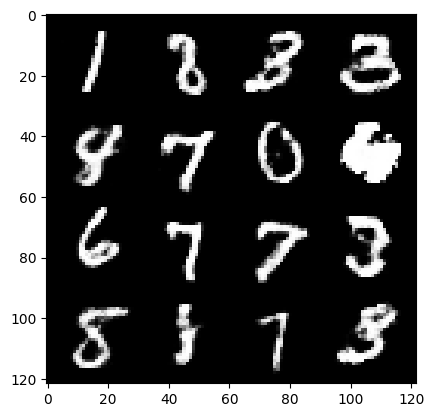

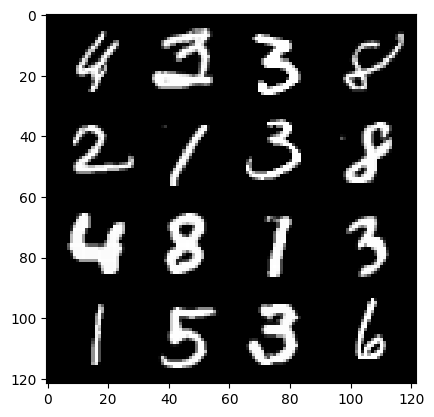

147: step 69000 / Gen loss: 0.8016264075040814 / disc_loss: 0.2804196511209011


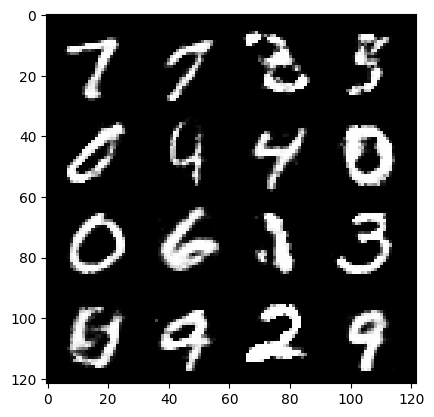

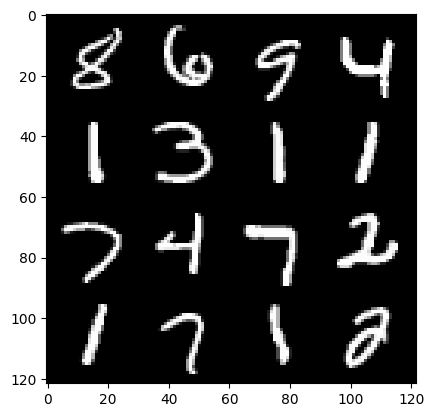

147: step 69300 / Gen loss: 0.80359233379364 / disc_loss: 0.2878144747018815


  0%|          | 0/469 [00:00<?, ?it/s]

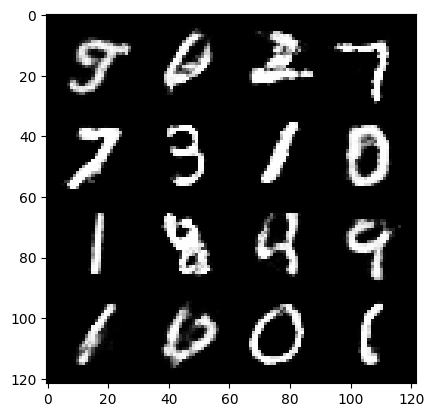

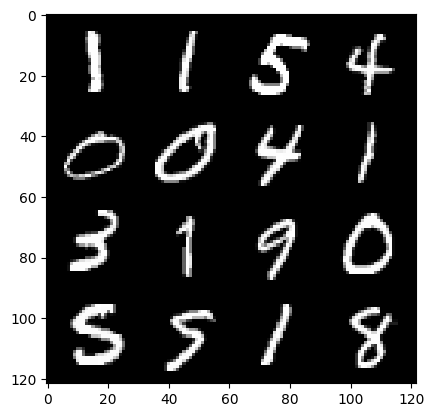

148: step 69600 / Gen loss: 0.8095277615388229 / disc_loss: 0.27608911852041884


  0%|          | 0/469 [00:00<?, ?it/s]

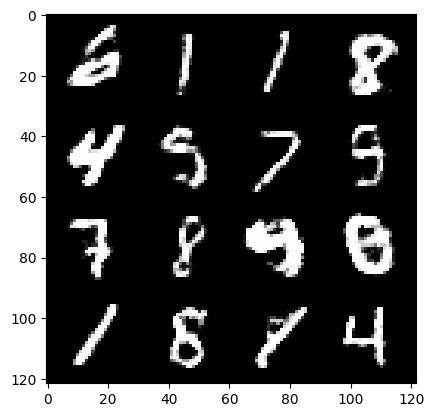

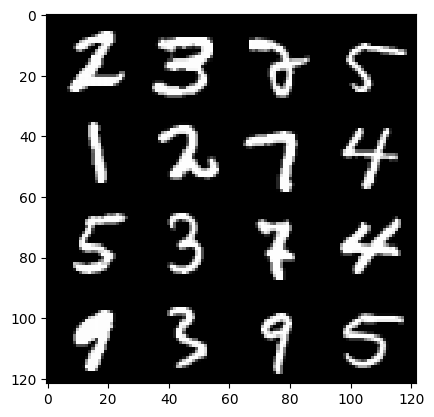

149: step 69900 / Gen loss: 0.8050953082243603 / disc_loss: 0.2793780974050361


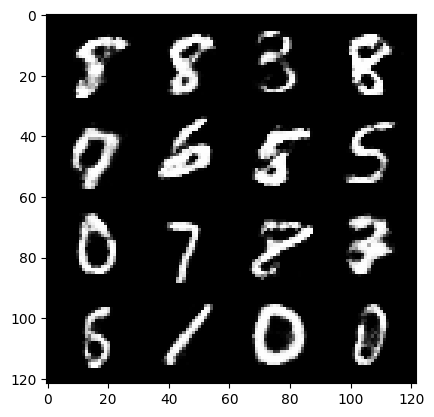

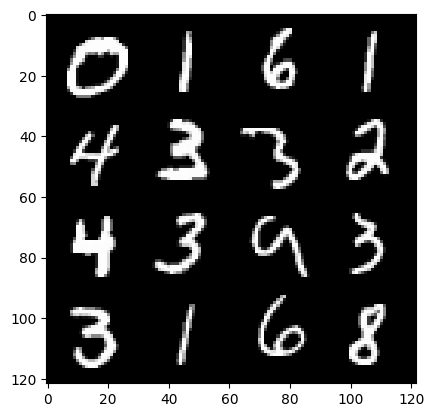

149: step 70200 / Gen loss: 0.8092580731709803 / disc_loss: 0.27933246726791033


  0%|          | 0/469 [00:00<?, ?it/s]

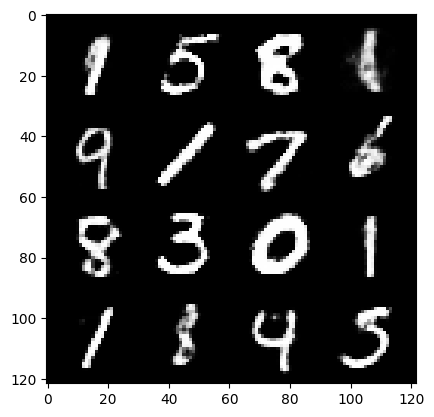

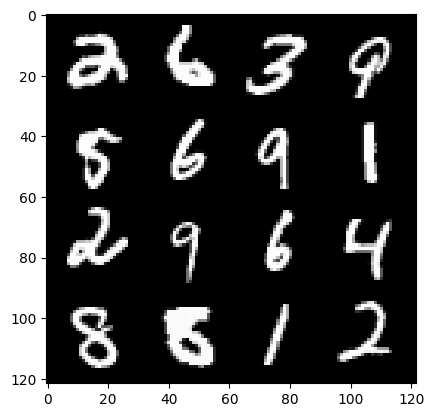

150: step 70500 / Gen loss: 0.8117633485794069 / disc_loss: 0.2753516169885791


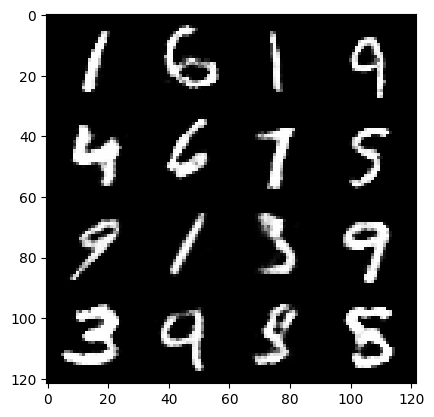

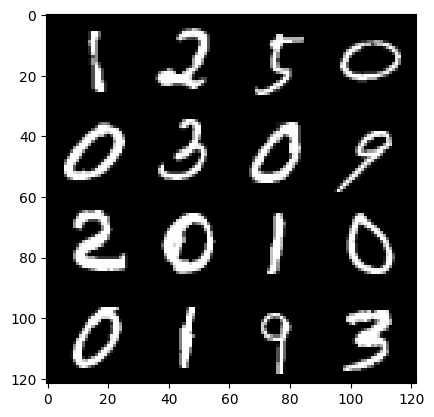

150: step 70800 / Gen loss: 0.799422629078229 / disc_loss: 0.28765180185437206


  0%|          | 0/469 [00:00<?, ?it/s]

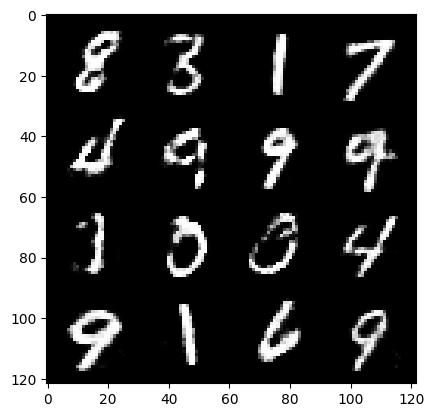

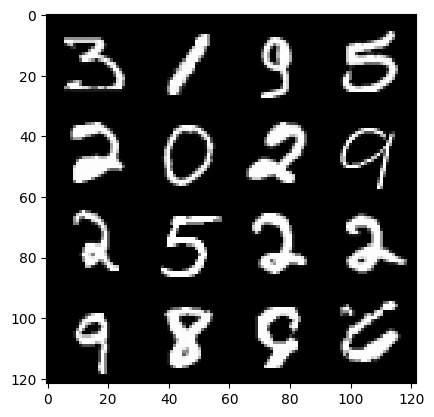

151: step 71100 / Gen loss: 0.8085082550843554 / disc_loss: 0.27663747499386476


  0%|          | 0/469 [00:00<?, ?it/s]

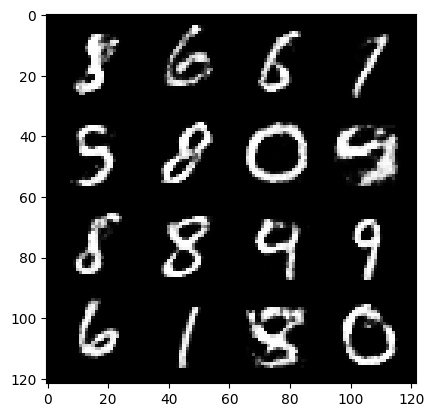

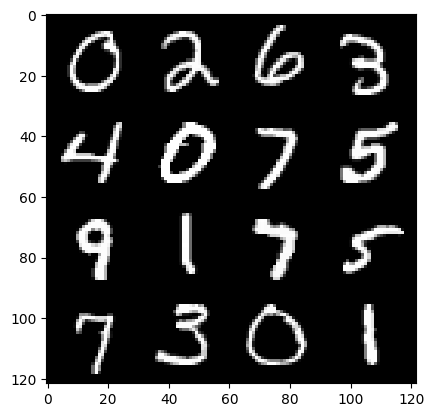

152: step 71400 / Gen loss: 0.7999666786193849 / disc_loss: 0.28517348517974206


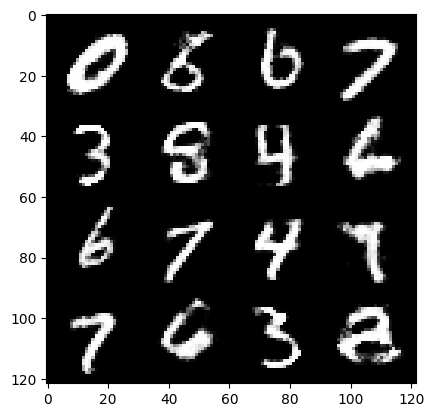

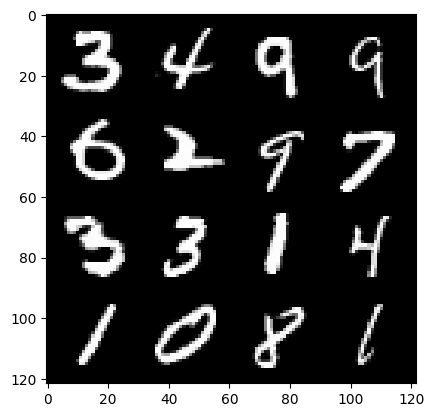

152: step 71700 / Gen loss: 0.8051426839828483 / disc_loss: 0.283826840420564


  0%|          | 0/469 [00:00<?, ?it/s]

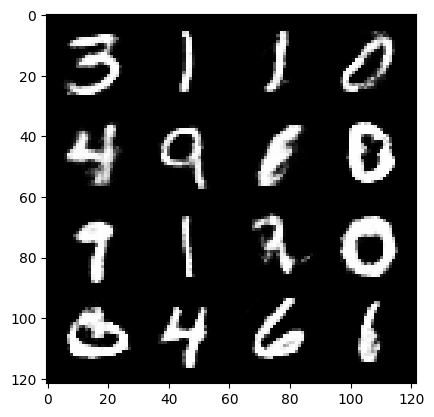

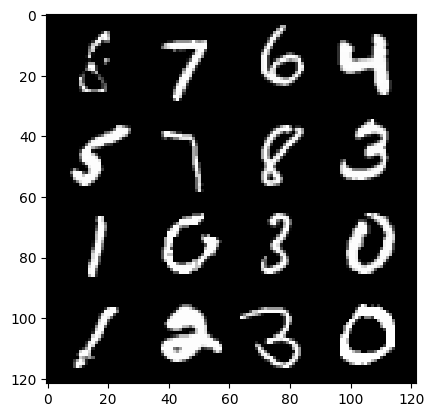

153: step 72000 / Gen loss: 0.8078279409805939 / disc_loss: 0.28229354177912075


  0%|          | 0/469 [00:00<?, ?it/s]

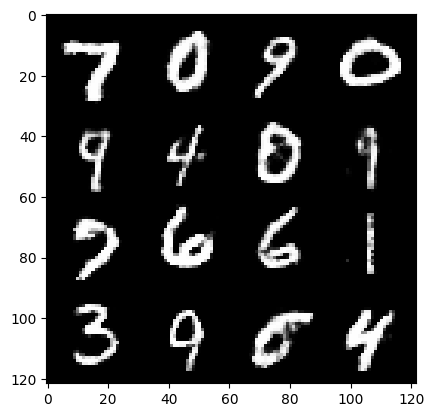

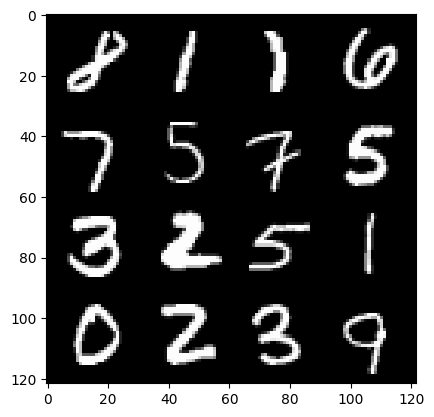

154: step 72300 / Gen loss: 0.8009521873792009 / disc_loss: 0.2799723170697689


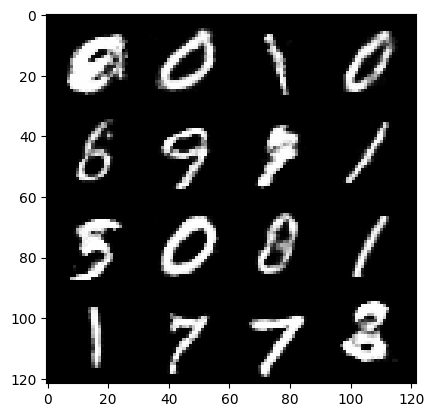

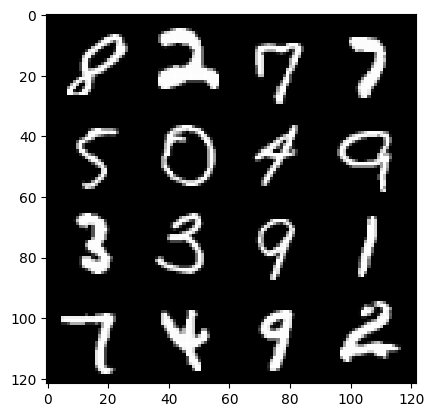

154: step 72600 / Gen loss: 0.804042645692825 / disc_loss: 0.2806161309281985


  0%|          | 0/469 [00:00<?, ?it/s]

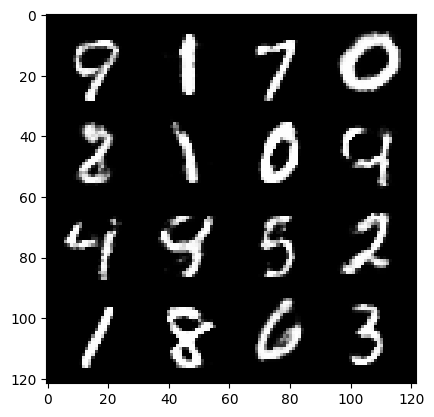

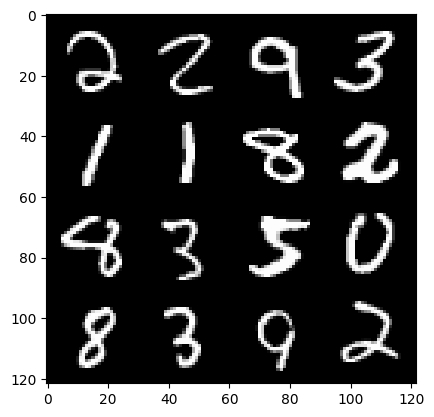

155: step 72900 / Gen loss: 0.7977585196495062 / disc_loss: 0.2897587867577868


  0%|          | 0/469 [00:00<?, ?it/s]

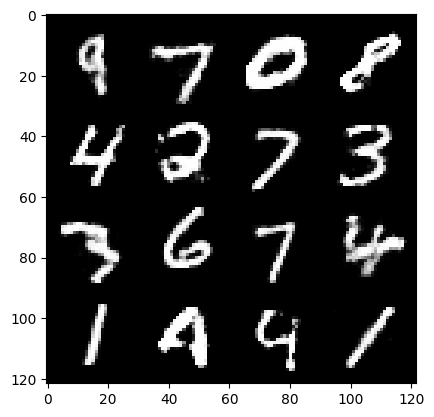

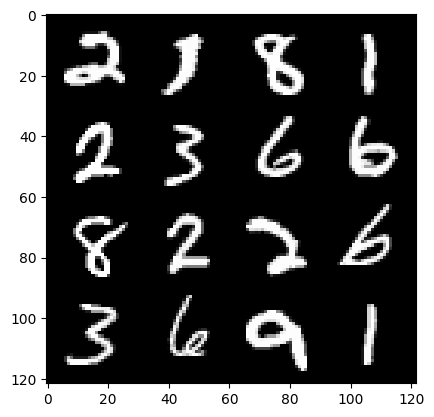

156: step 73200 / Gen loss: 0.7988060096899658 / disc_loss: 0.2915666915476323


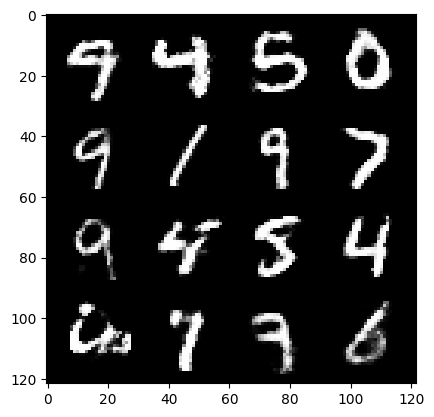

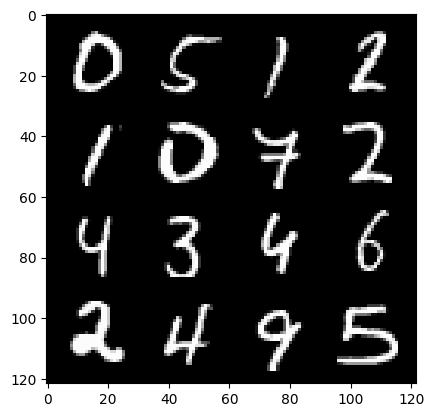

156: step 73500 / Gen loss: 0.7974881454308826 / disc_loss: 0.2787444728612902


  0%|          | 0/469 [00:00<?, ?it/s]

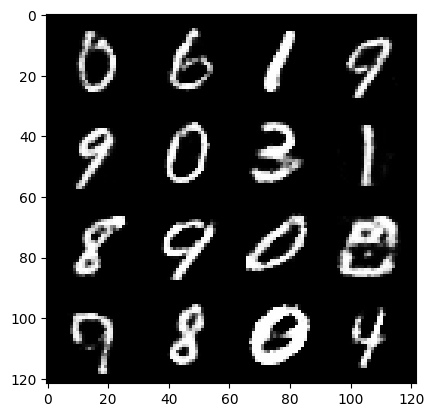

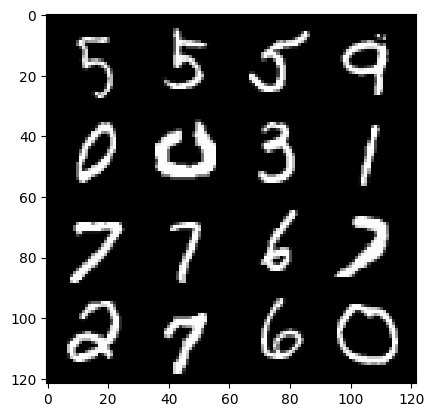

157: step 73800 / Gen loss: 0.7977980965375895 / disc_loss: 0.28716406772534053


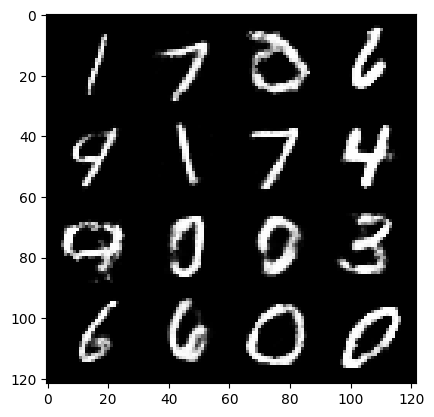

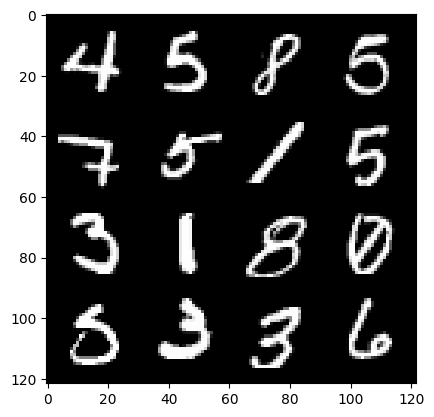

157: step 74100 / Gen loss: 0.7939606918891267 / disc_loss: 0.2852942770719529


  0%|          | 0/469 [00:00<?, ?it/s]

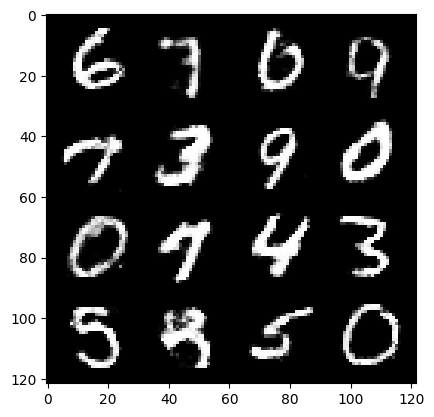

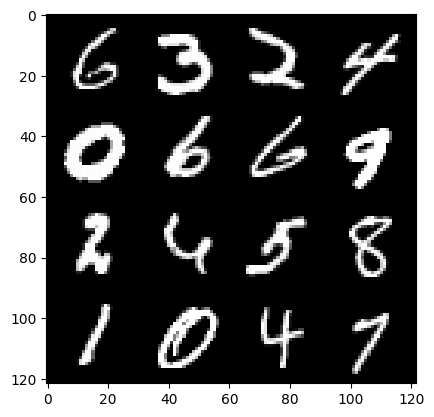

158: step 74400 / Gen loss: 0.7978492275873817 / disc_loss: 0.28568375205000246


  0%|          | 0/469 [00:00<?, ?it/s]

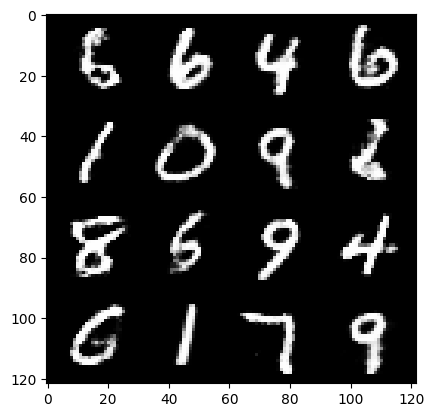

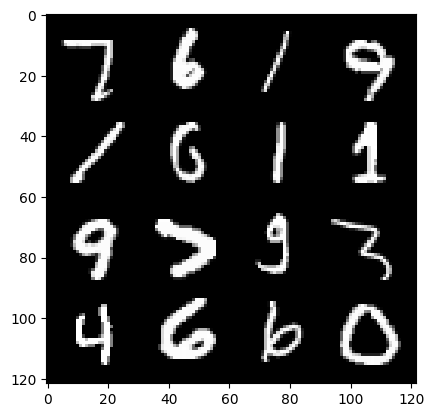

159: step 74700 / Gen loss: 0.8000201837221786 / disc_loss: 0.2813476078212263


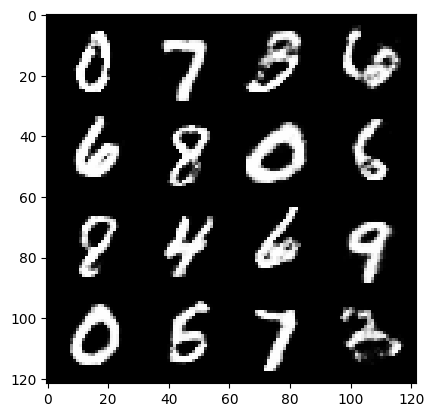

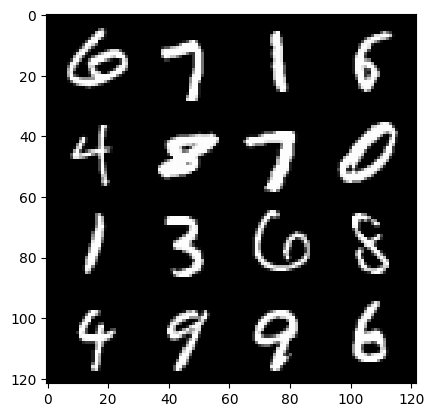

159: step 75000 / Gen loss: 0.8007250704367953 / disc_loss: 0.2880313091476759


  0%|          | 0/469 [00:00<?, ?it/s]

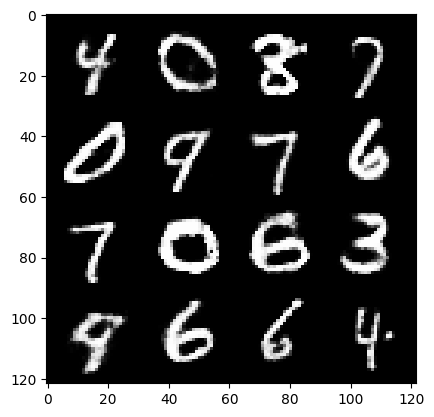

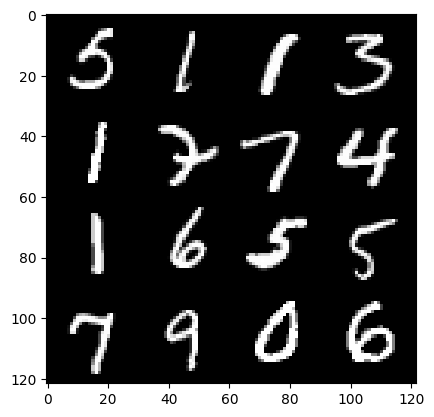

160: step 75300 / Gen loss: 0.7939853692054749 / disc_loss: 0.29716432765126244


  0%|          | 0/469 [00:00<?, ?it/s]

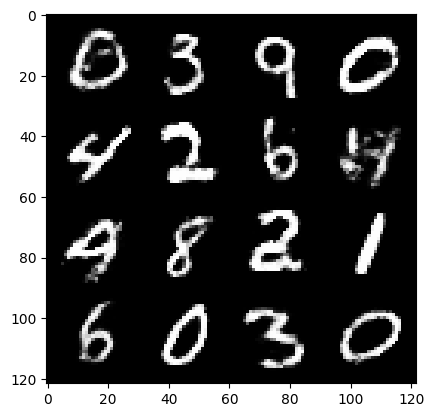

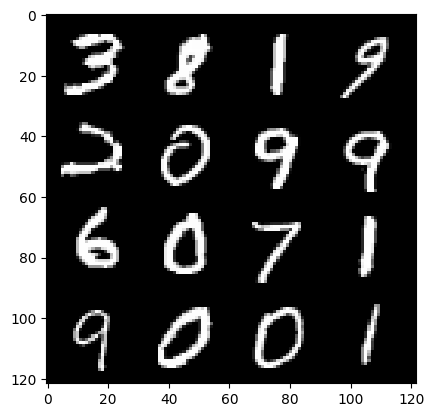

161: step 75600 / Gen loss: 0.7967609057823811 / disc_loss: 0.28582043250401806


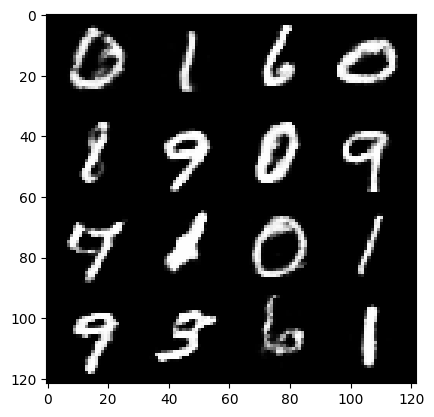

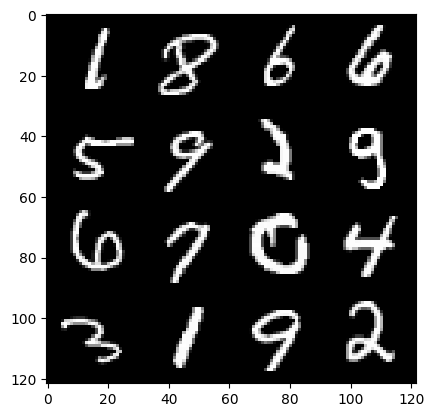

161: step 75900 / Gen loss: 0.8003371554613111 / disc_loss: 0.28465987960497546


  0%|          | 0/469 [00:00<?, ?it/s]

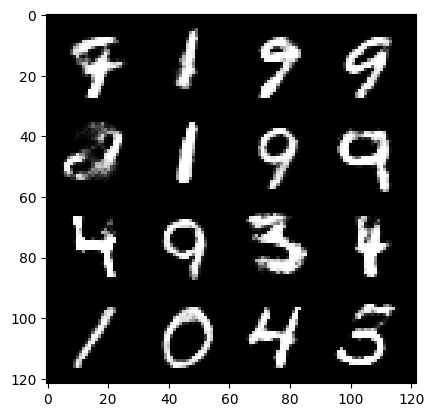

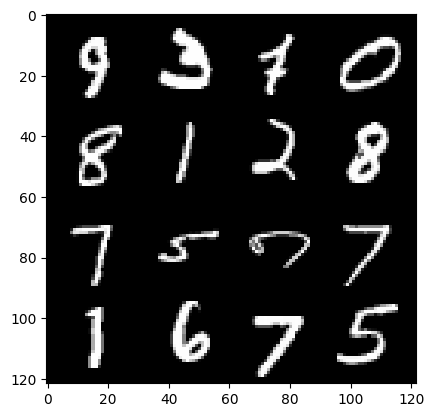

162: step 76200 / Gen loss: 0.795945443113645 / disc_loss: 0.2834480901559195


  0%|          | 0/469 [00:00<?, ?it/s]

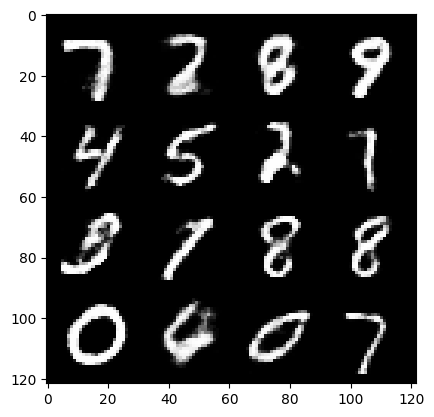

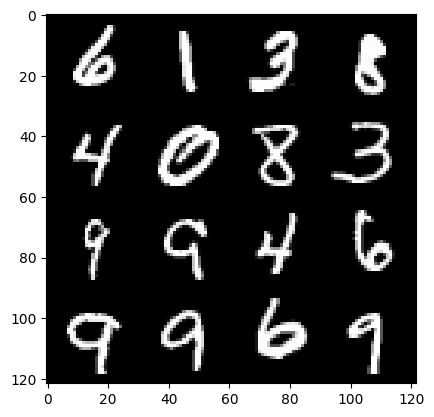

163: step 76500 / Gen loss: 0.7936134183406832 / disc_loss: 0.2851122369865576


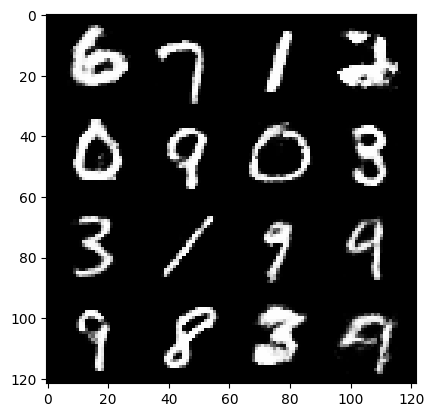

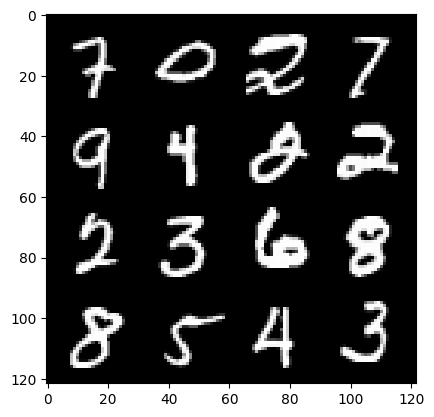

163: step 76800 / Gen loss: 0.7990447596708933 / disc_loss: 0.2834360905488333


  0%|          | 0/469 [00:00<?, ?it/s]

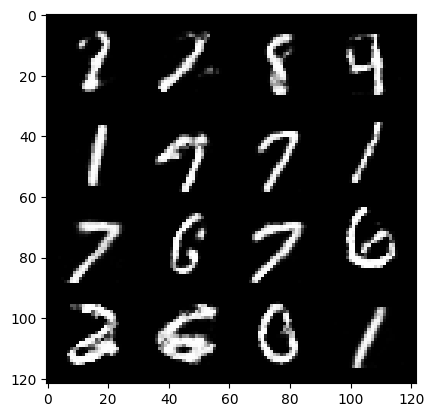

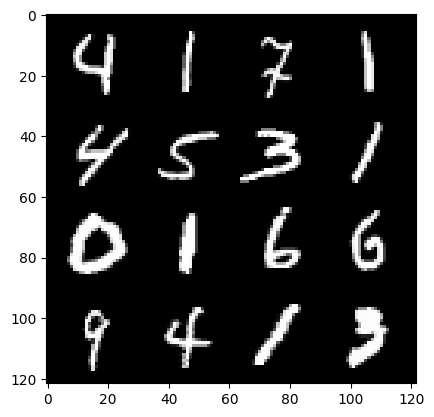

164: step 77100 / Gen loss: 0.8017141036192579 / disc_loss: 0.2820320307215055


  0%|          | 0/469 [00:00<?, ?it/s]

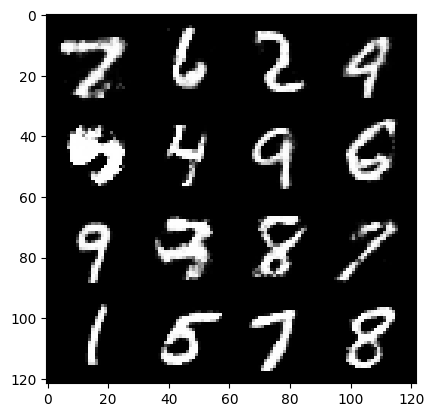

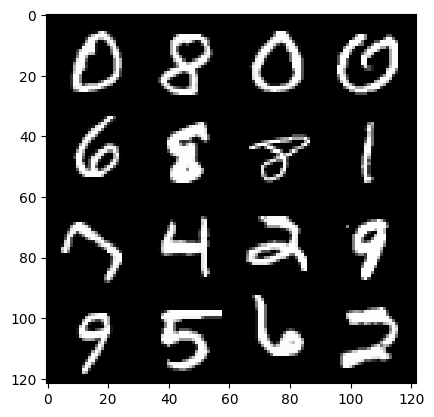

165: step 77400 / Gen loss: 0.8013327940305076 / disc_loss: 0.2818509047230085


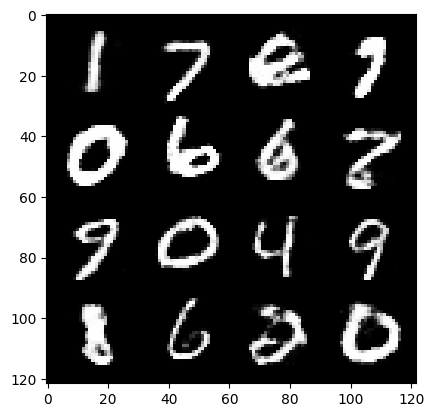

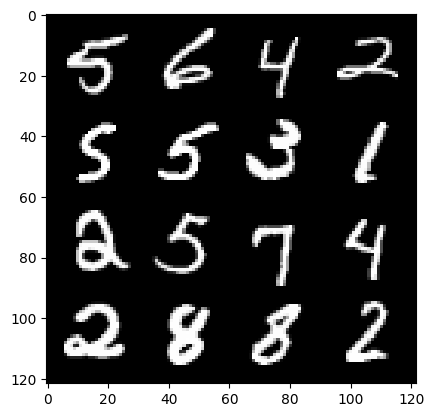

165: step 77700 / Gen loss: 0.8003416285912198 / disc_loss: 0.2794693342844647


  0%|          | 0/469 [00:00<?, ?it/s]

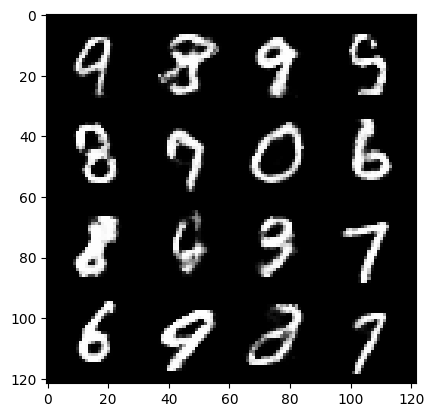

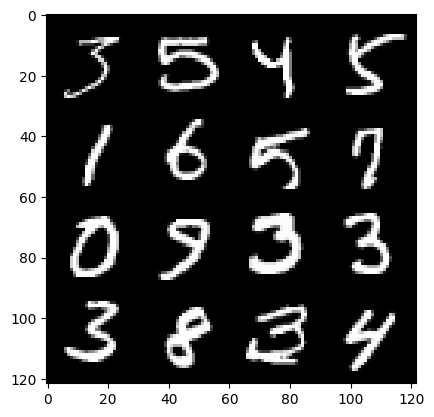

166: step 78000 / Gen loss: 0.7968397039175037 / disc_loss: 0.28552087873220444


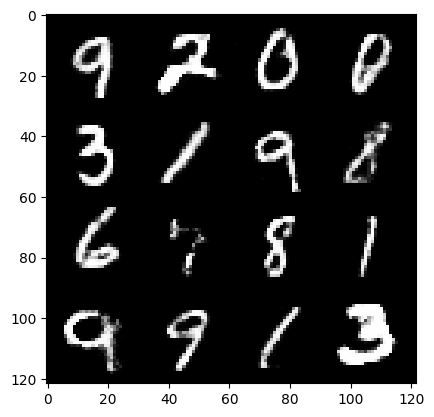

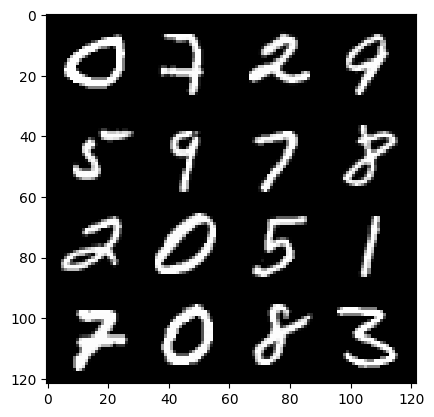

166: step 78300 / Gen loss: 0.7975202246507007 / disc_loss: 0.2806722543140252


  0%|          | 0/469 [00:00<?, ?it/s]

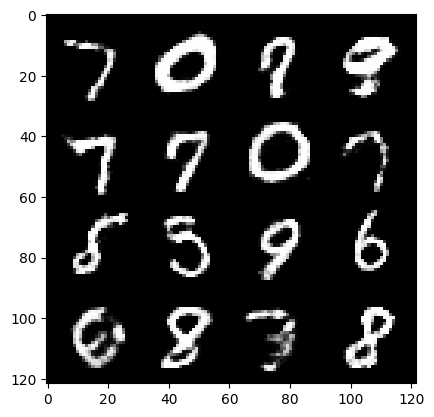

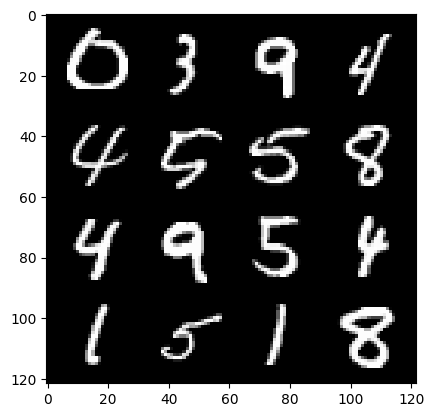

167: step 78600 / Gen loss: 0.7939714845021563 / disc_loss: 0.2877997822562852


  0%|          | 0/469 [00:00<?, ?it/s]

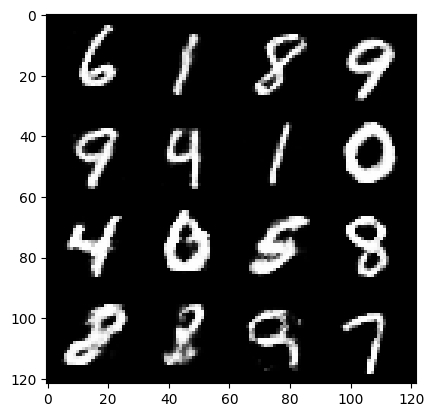

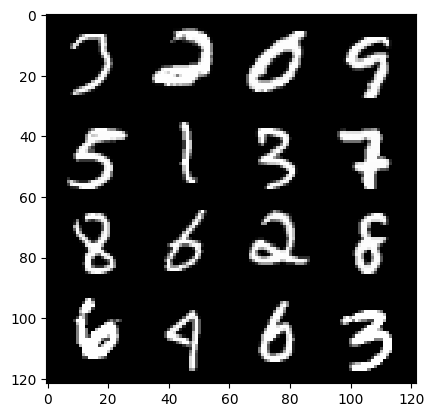

168: step 78900 / Gen loss: 0.788824793100357 / disc_loss: 0.2885683203736941


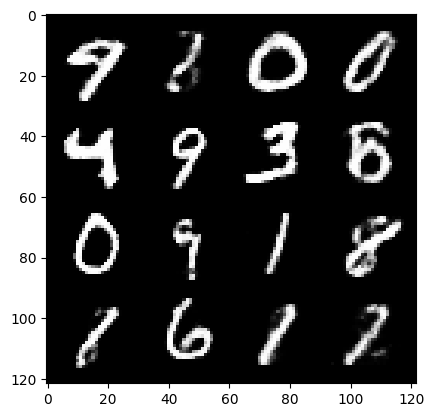

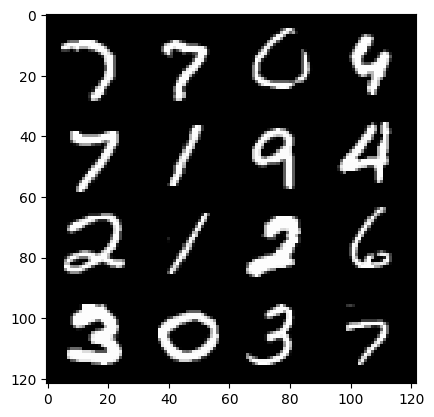

168: step 79200 / Gen loss: 0.7996048583587013 / disc_loss: 0.2852621731658778


  0%|          | 0/469 [00:00<?, ?it/s]

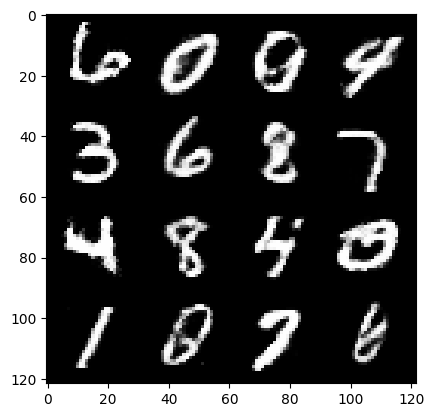

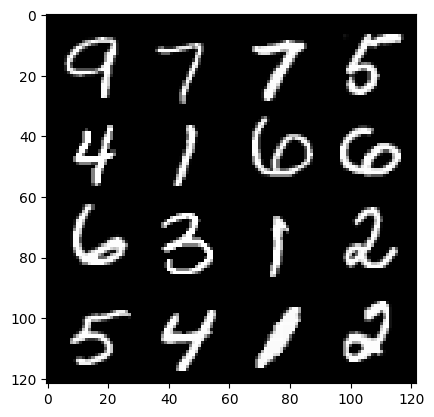

169: step 79500 / Gen loss: 0.7929897044102352 / disc_loss: 0.28020751138528194


  0%|          | 0/469 [00:00<?, ?it/s]

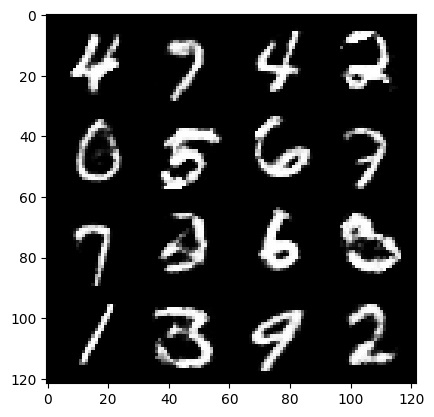

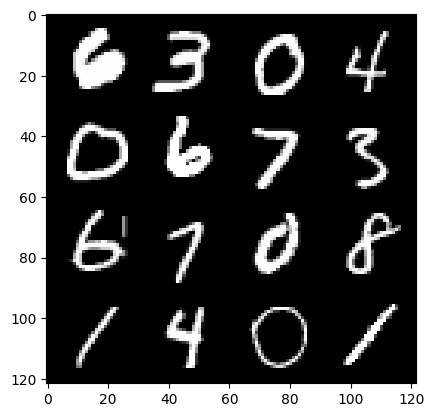

170: step 79800 / Gen loss: 0.791238528887431 / disc_loss: 0.2883143864075345


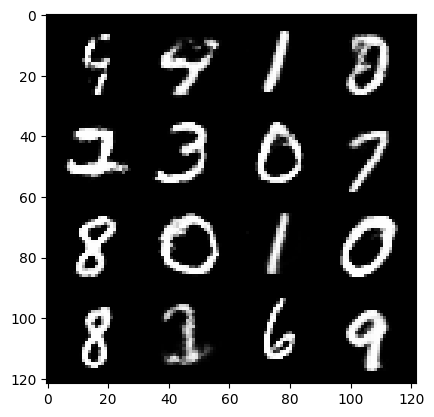

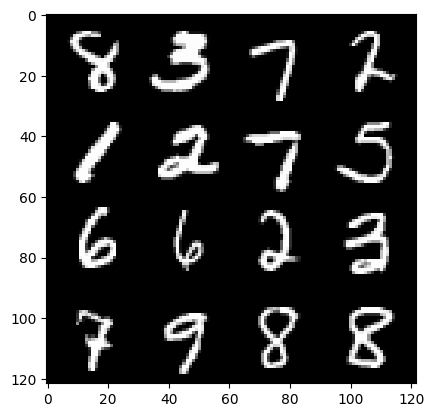

170: step 80100 / Gen loss: 0.7976481133699419 / disc_loss: 0.2844045849641163


  0%|          | 0/469 [00:00<?, ?it/s]

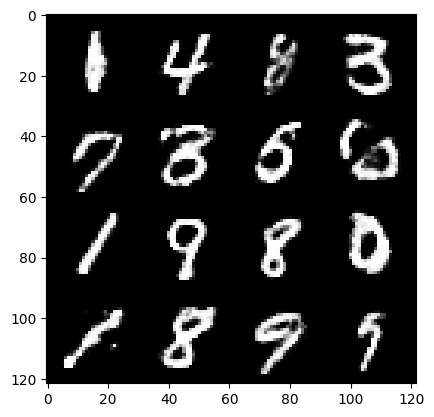

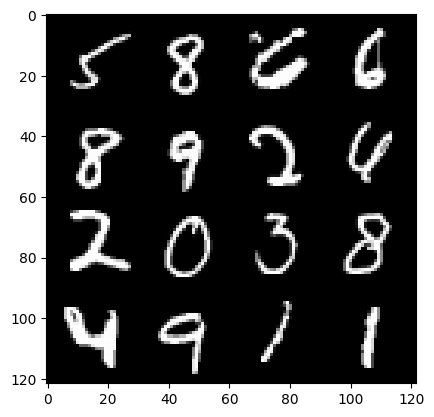

171: step 80400 / Gen loss: 0.7974559346834817 / disc_loss: 0.28221823041637734


  0%|          | 0/469 [00:00<?, ?it/s]

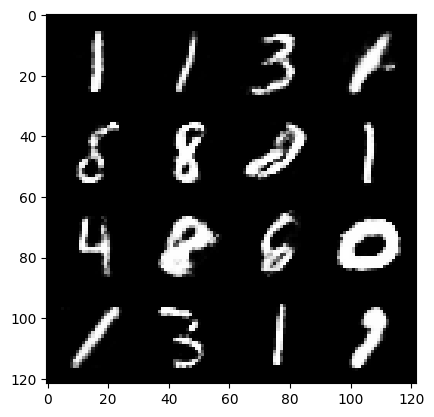

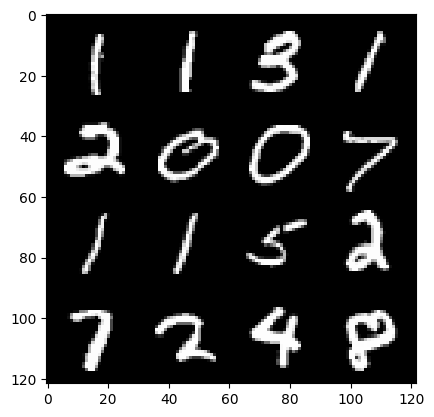

172: step 80700 / Gen loss: 0.7927281220753983 / disc_loss: 0.28708699266115795


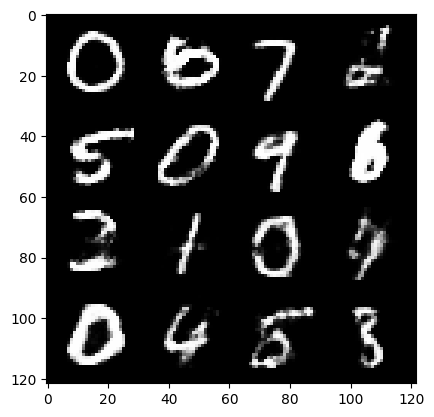

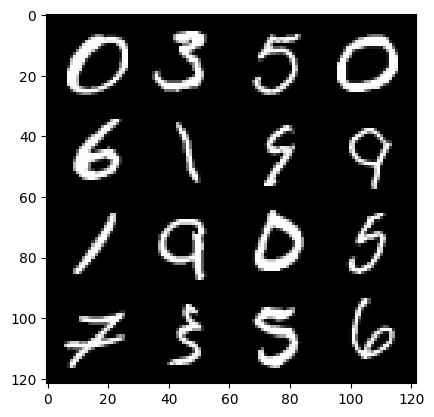

172: step 81000 / Gen loss: 0.7953647313515344 / disc_loss: 0.2817711920539536


  0%|          | 0/469 [00:00<?, ?it/s]

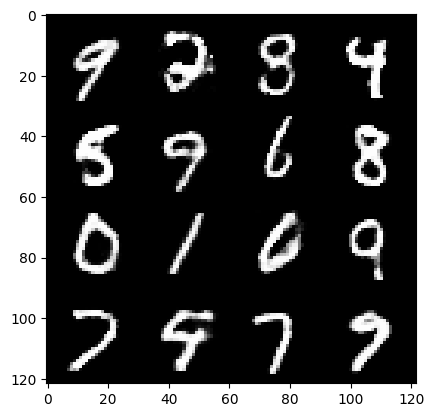

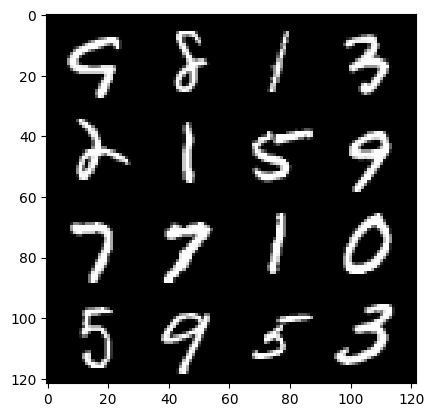

173: step 81300 / Gen loss: 0.8002268163363138 / disc_loss: 0.2846312838792801


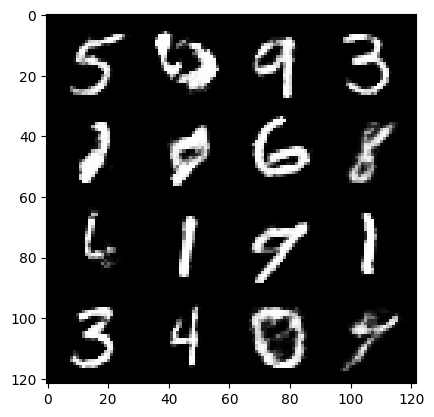

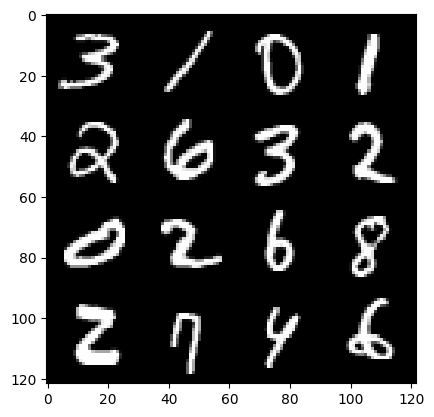

173: step 81600 / Gen loss: 0.7869678562879562 / disc_loss: 0.2869612759848434


  0%|          | 0/469 [00:00<?, ?it/s]

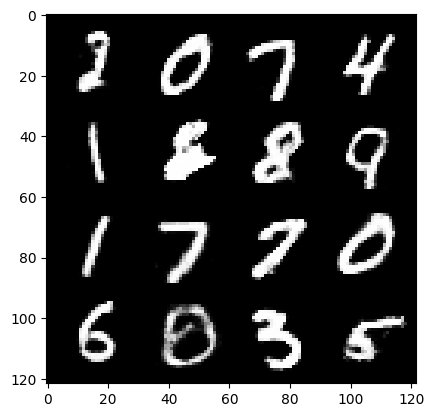

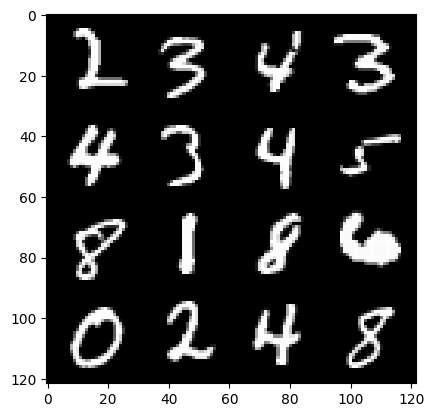

174: step 81900 / Gen loss: 0.799357135295869 / disc_loss: 0.2833489155272645


  0%|          | 0/469 [00:00<?, ?it/s]

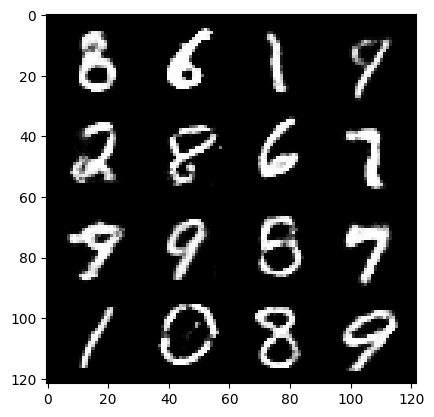

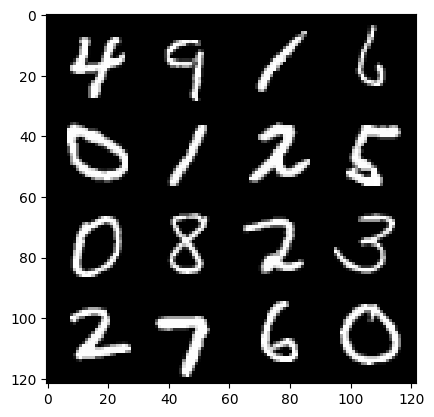

175: step 82200 / Gen loss: 0.7959318608045579 / disc_loss: 0.28024039184053723


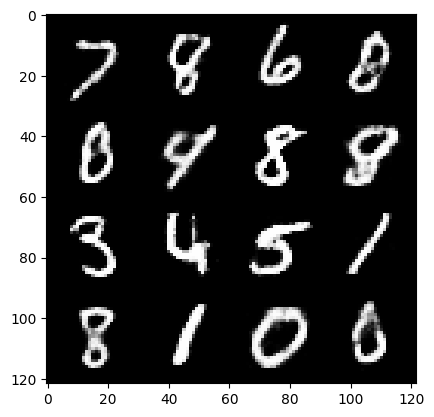

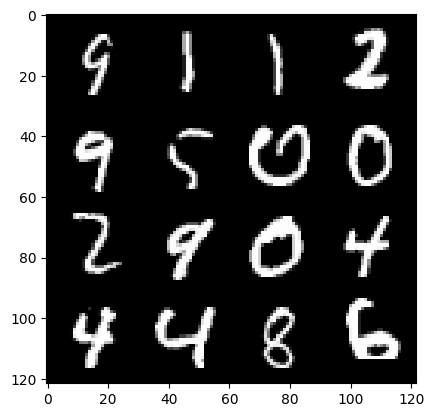

175: step 82500 / Gen loss: 0.7901406735181806 / disc_loss: 0.2892794754107793


  0%|          | 0/469 [00:00<?, ?it/s]

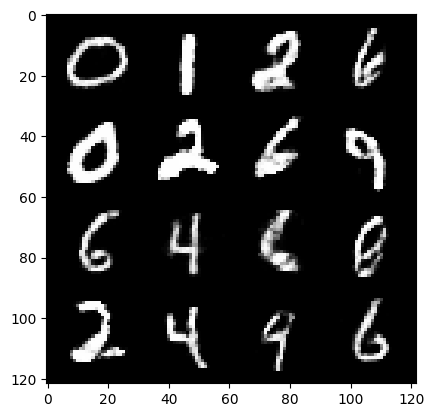

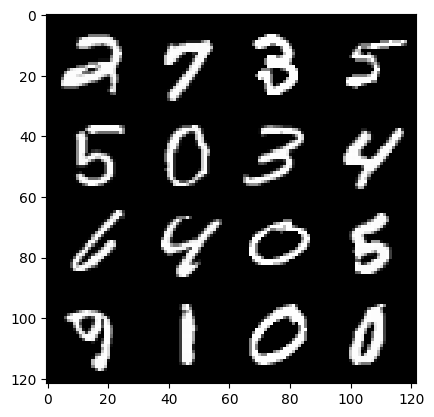

176: step 82800 / Gen loss: 0.7972174602746968 / disc_loss: 0.28279124344388645


  0%|          | 0/469 [00:00<?, ?it/s]

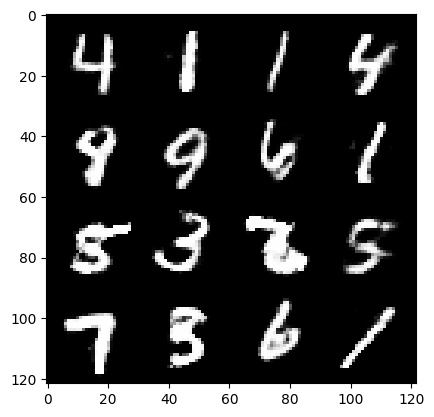

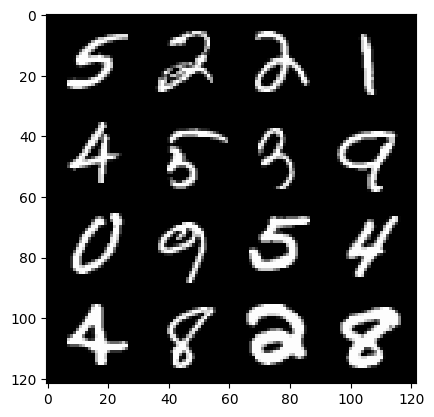

177: step 83100 / Gen loss: 0.7941448656717932 / disc_loss: 0.28354739199082035


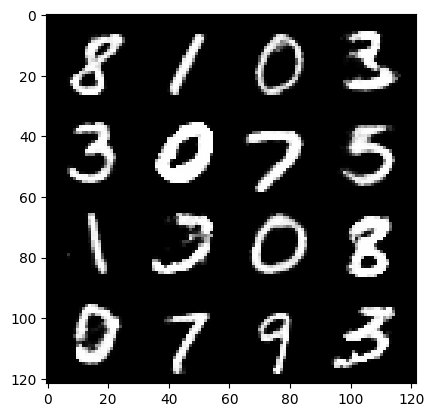

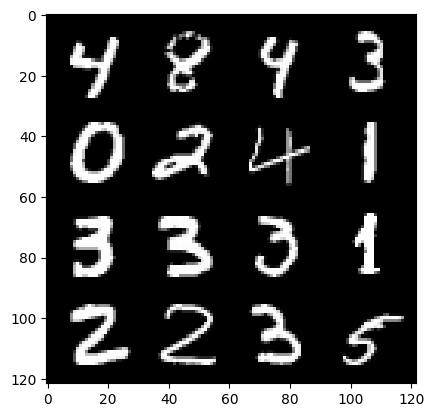

177: step 83400 / Gen loss: 0.7982623745997748 / disc_loss: 0.2866348293423652


  0%|          | 0/469 [00:00<?, ?it/s]

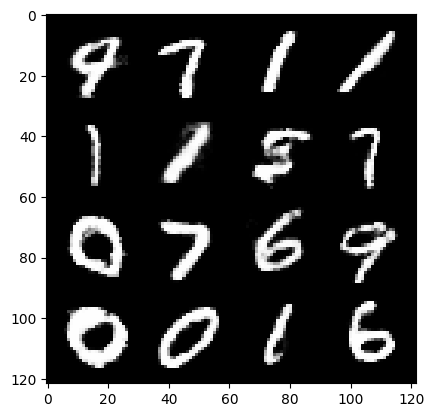

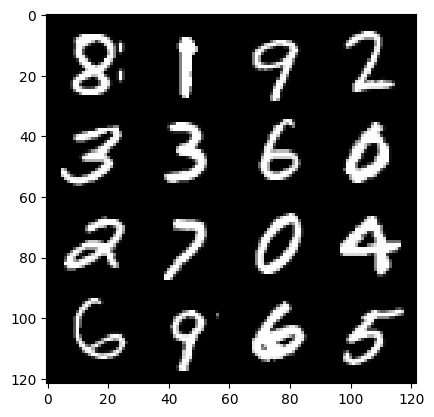

178: step 83700 / Gen loss: 0.7966628736257555 / disc_loss: 0.28174190660317733


  0%|          | 0/469 [00:00<?, ?it/s]

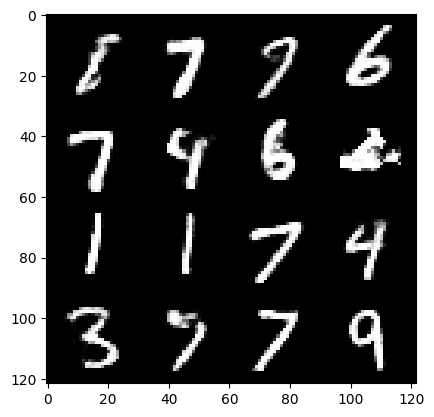

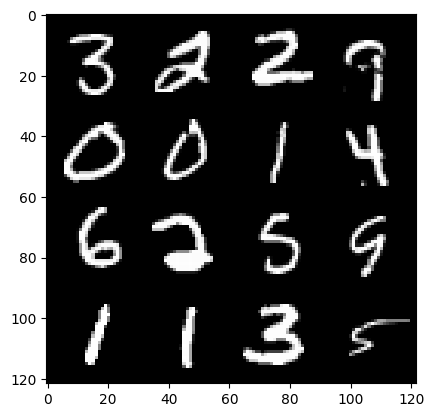

179: step 84000 / Gen loss: 0.7954382377862926 / disc_loss: 0.289211733986934


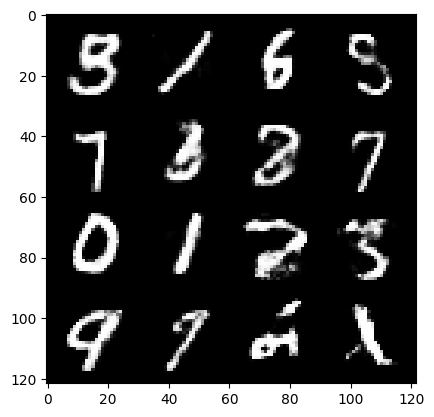

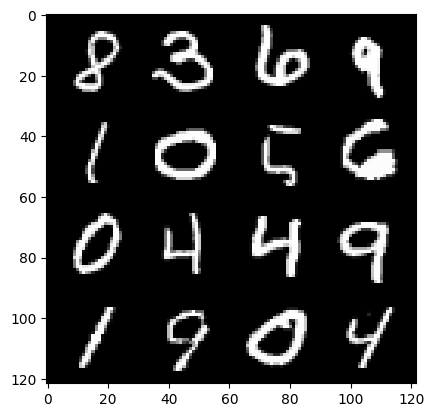

179: step 84300 / Gen loss: 0.798064284324646 / disc_loss: 0.2807442989945413


  0%|          | 0/469 [00:00<?, ?it/s]

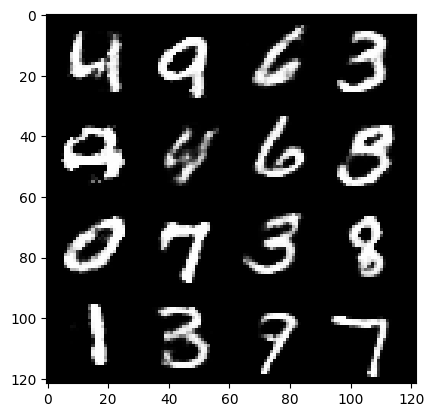

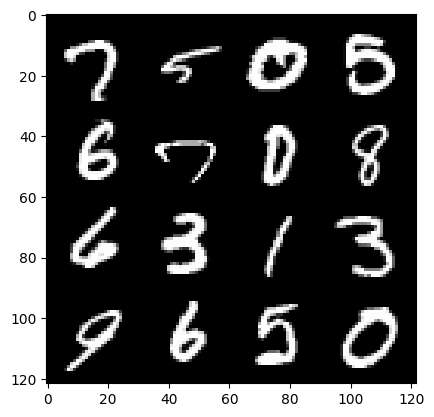

180: step 84600 / Gen loss: 0.7918634861707684 / disc_loss: 0.283550774604082


  0%|          | 0/469 [00:00<?, ?it/s]

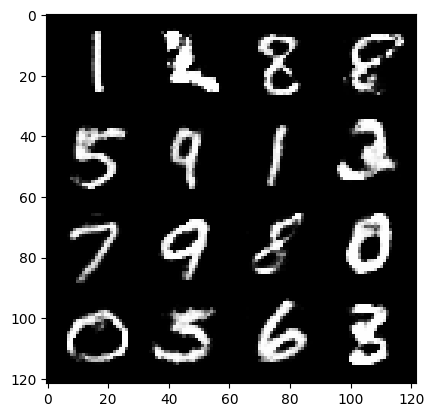

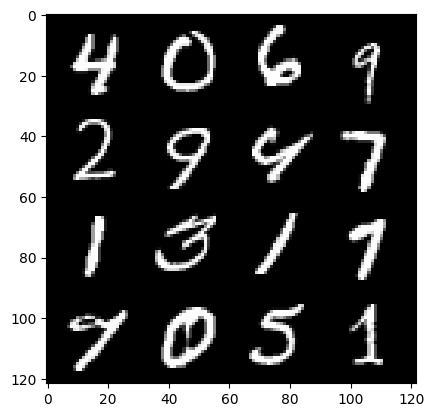

181: step 84900 / Gen loss: 0.792898732026418 / disc_loss: 0.2844029310842355


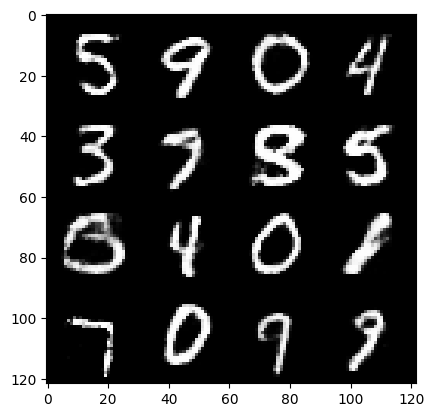

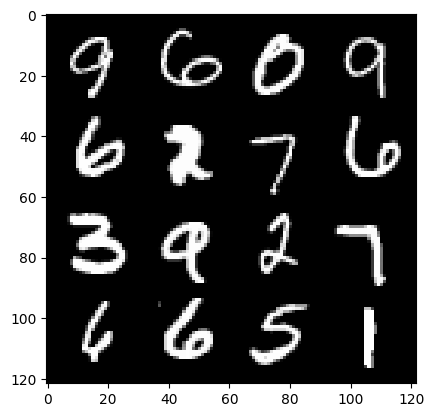

181: step 85200 / Gen loss: 0.7917270358403524 / disc_loss: 0.27981370930870364


  0%|          | 0/469 [00:00<?, ?it/s]

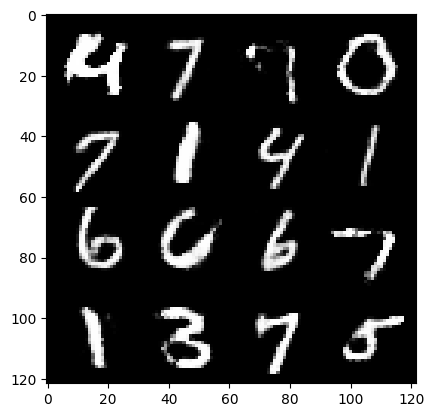

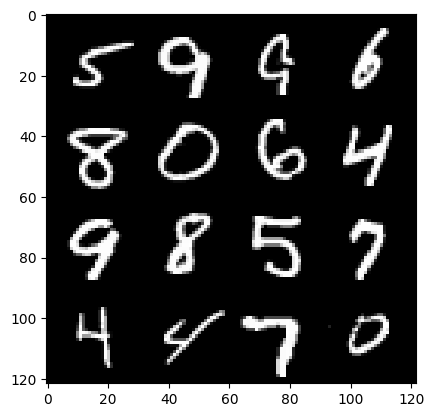

182: step 85500 / Gen loss: 0.7915884266297025 / disc_loss: 0.28355240995685255


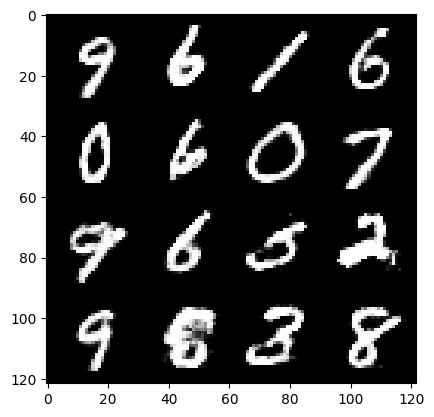

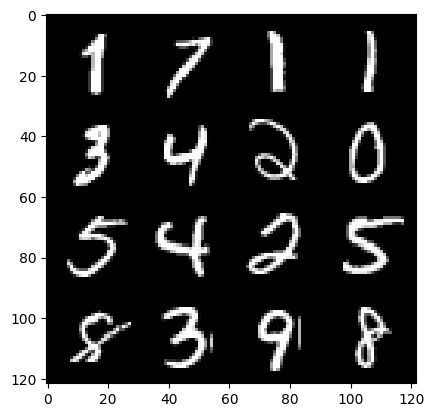

182: step 85800 / Gen loss: 0.7891057960192362 / disc_loss: 0.2894182208677131


  0%|          | 0/469 [00:00<?, ?it/s]

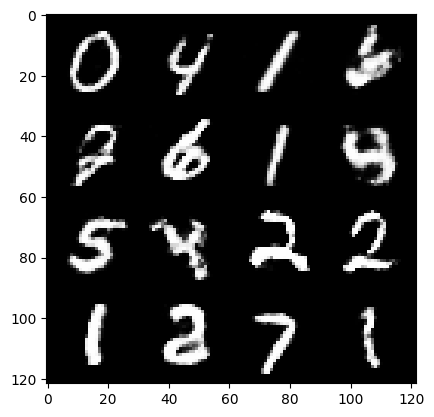

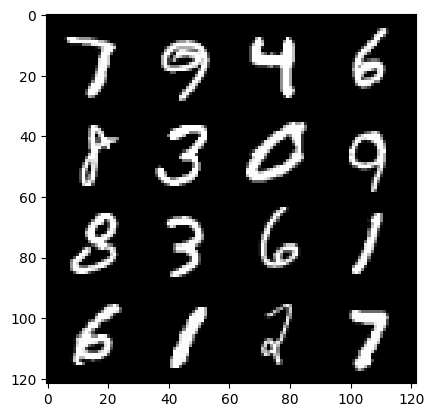

183: step 86100 / Gen loss: 0.7917047441005707 / disc_loss: 0.2812044600148995


  0%|          | 0/469 [00:00<?, ?it/s]

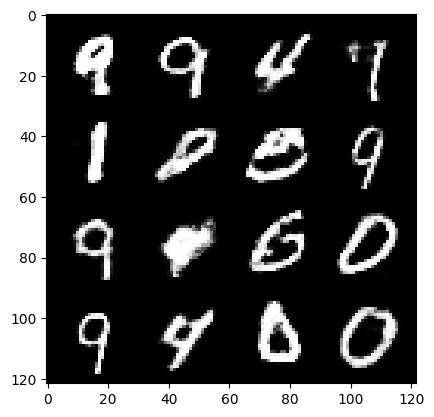

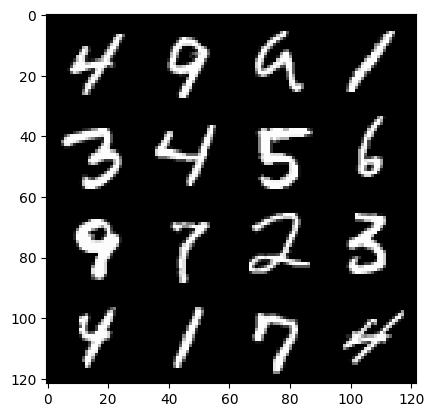

184: step 86400 / Gen loss: 0.794506106376648 / disc_loss: 0.28292499015728645


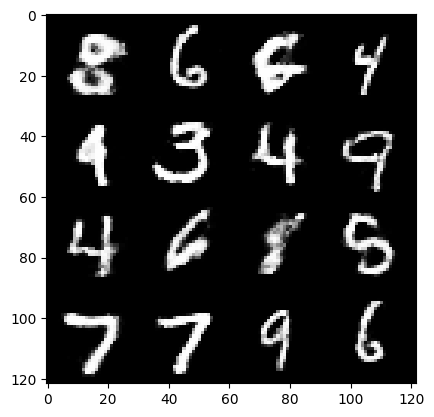

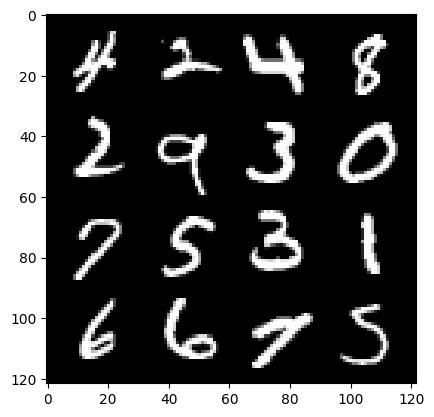

184: step 86700 / Gen loss: 0.789101893901825 / disc_loss: 0.2810565904776253


  0%|          | 0/469 [00:00<?, ?it/s]

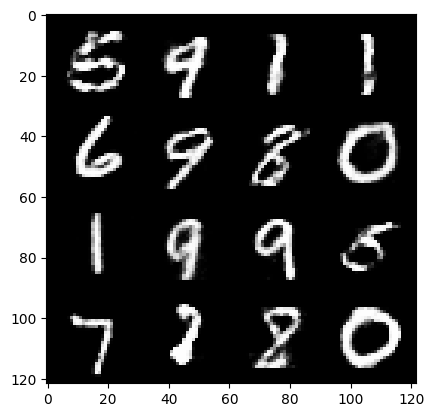

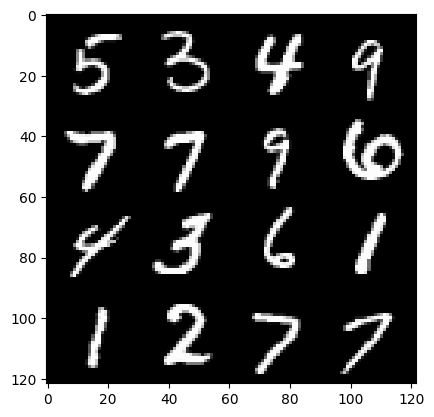

185: step 87000 / Gen loss: 0.79273406346639 / disc_loss: 0.28360671371221535


  0%|          | 0/469 [00:00<?, ?it/s]

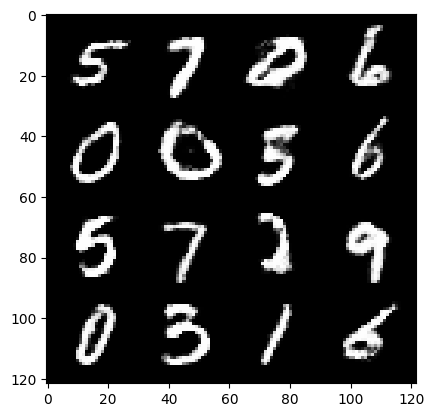

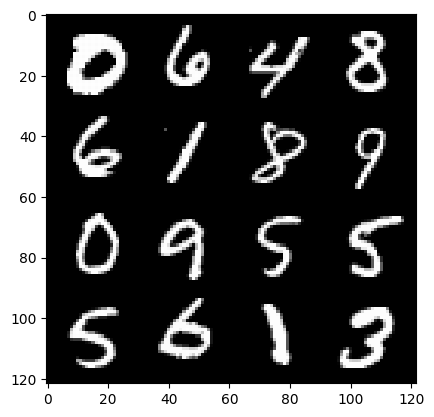

186: step 87300 / Gen loss: 0.7930605471134183 / disc_loss: 0.2877442963918051


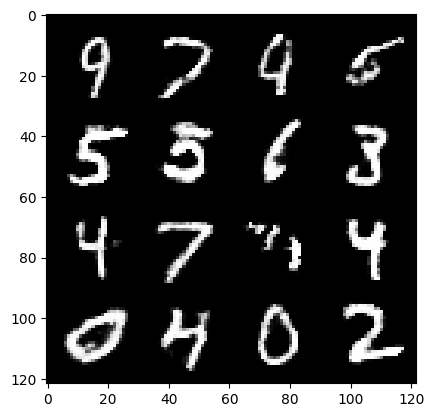

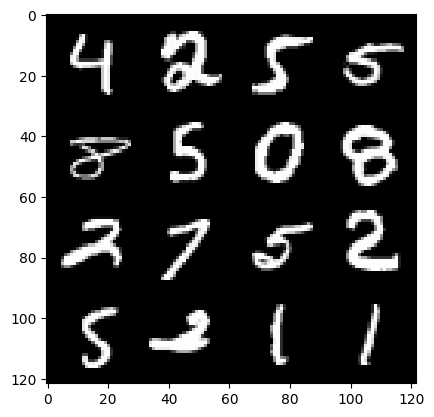

186: step 87600 / Gen loss: 0.7905413850148517 / disc_loss: 0.2836654780308406


  0%|          | 0/469 [00:00<?, ?it/s]

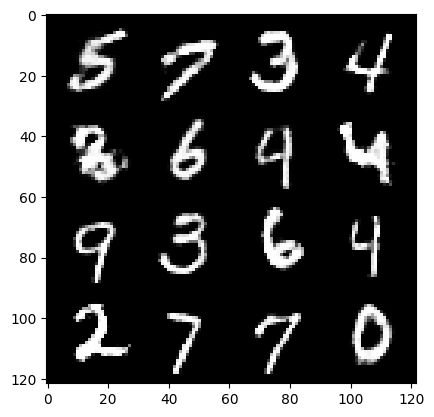

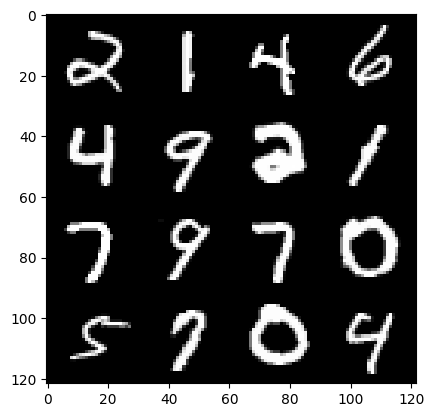

187: step 87900 / Gen loss: 0.791146088639895 / disc_loss: 0.28326192165414504


  0%|          | 0/469 [00:00<?, ?it/s]

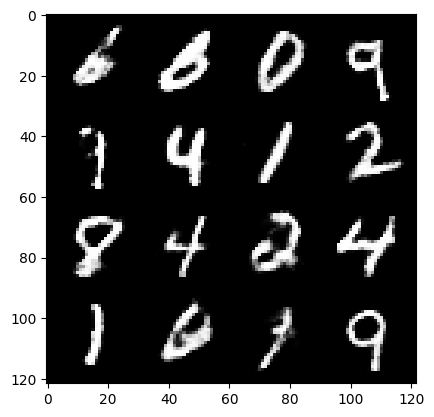

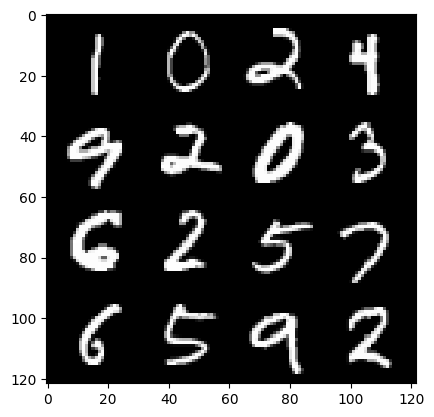

188: step 88200 / Gen loss: 0.7934350834290188 / disc_loss: 0.2847156747182209


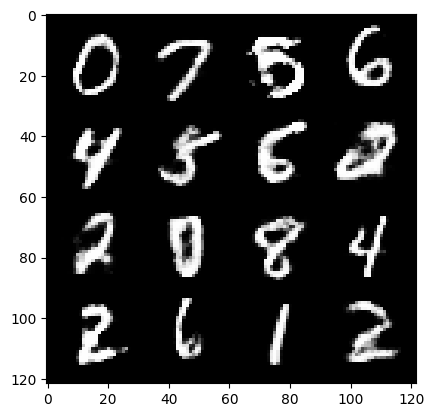

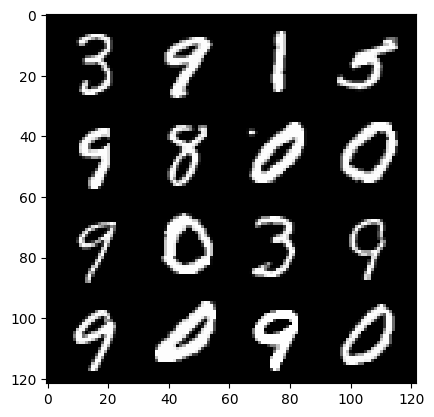

188: step 88500 / Gen loss: 0.7886735262473429 / disc_loss: 0.2799568478763104


  0%|          | 0/469 [00:00<?, ?it/s]

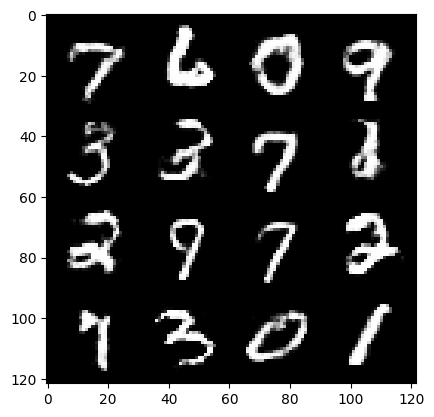

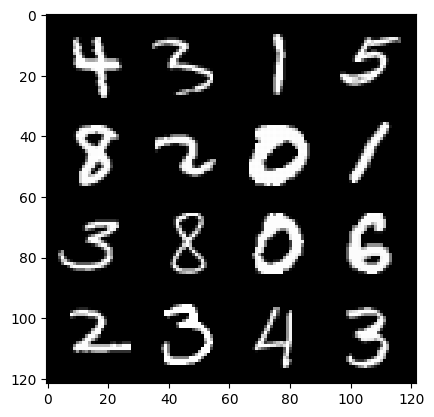

189: step 88800 / Gen loss: 0.7837625966469448 / disc_loss: 0.2840029192964237


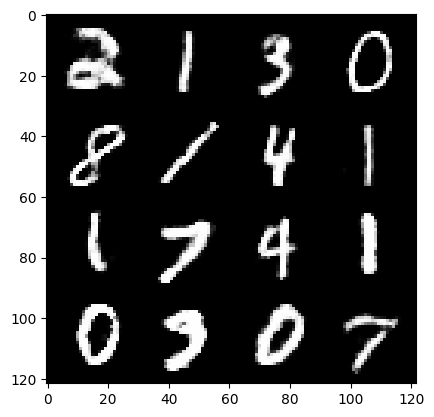

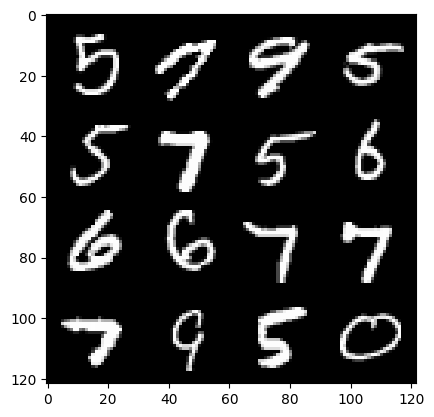

189: step 89100 / Gen loss: 0.7949641172091163 / disc_loss: 0.28357241347432155


  0%|          | 0/469 [00:00<?, ?it/s]

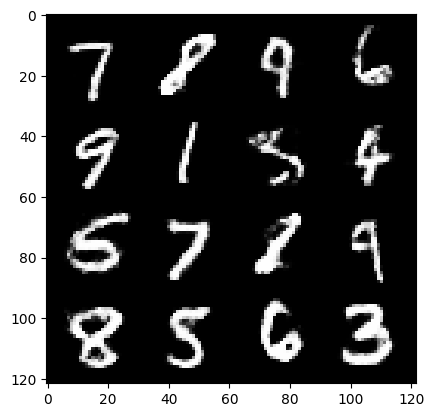

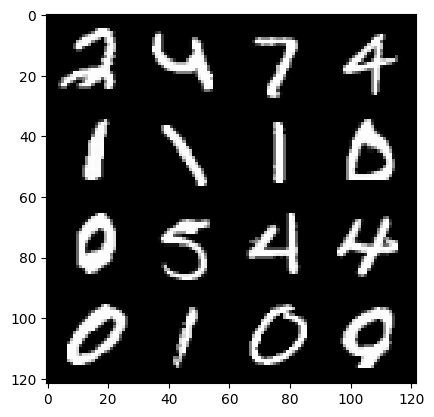

190: step 89400 / Gen loss: 0.7935425641139348 / disc_loss: 0.28018769060571996


  0%|          | 0/469 [00:00<?, ?it/s]

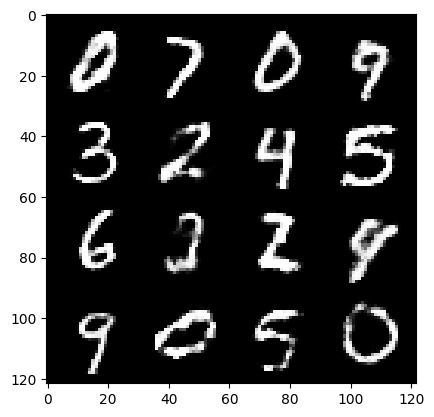

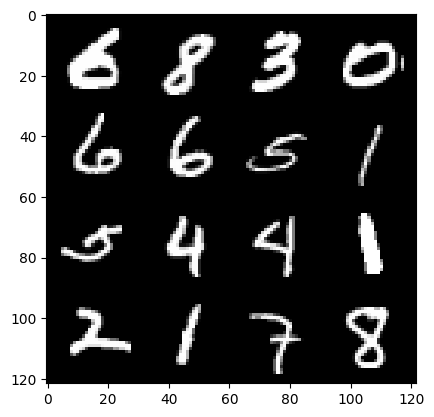

191: step 89700 / Gen loss: 0.7905057020982104 / disc_loss: 0.28498365600903813


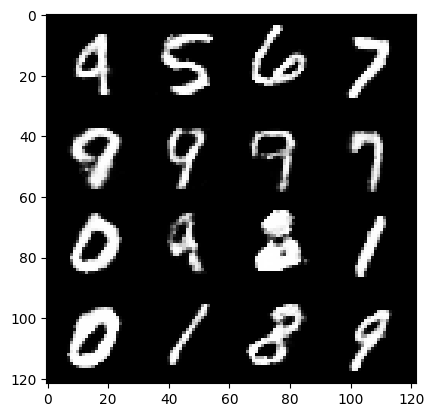

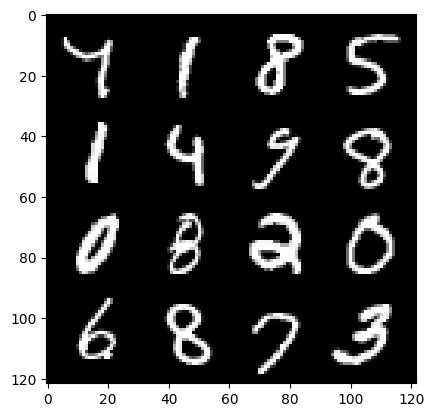

191: step 90000 / Gen loss: 0.7903002037604652 / disc_loss: 0.28109348565340025


  0%|          | 0/469 [00:00<?, ?it/s]

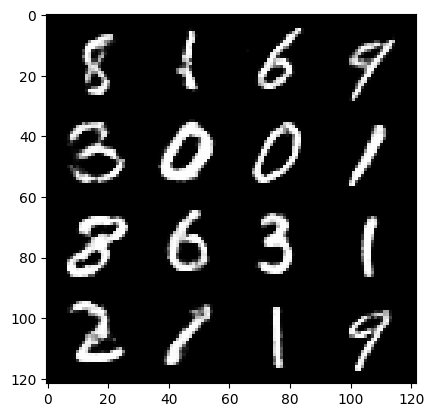

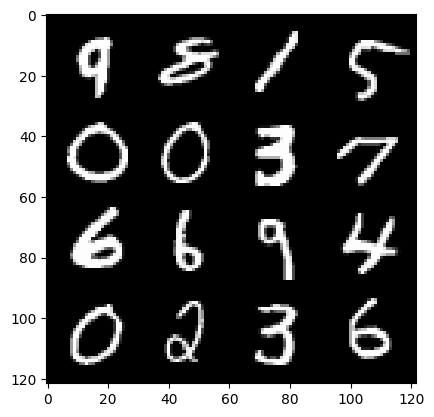

192: step 90300 / Gen loss: 0.7958081146081293 / disc_loss: 0.2841551766296227


  0%|          | 0/469 [00:00<?, ?it/s]

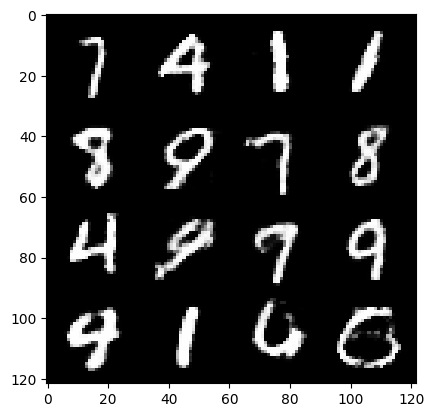

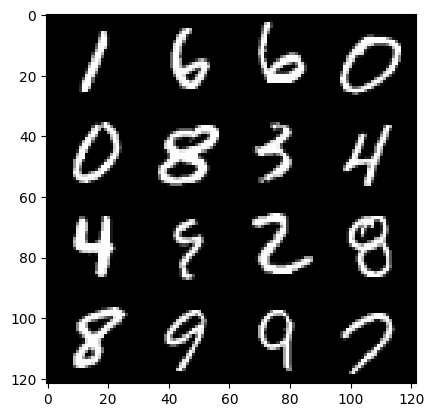

193: step 90600 / Gen loss: 0.79316411892573 / disc_loss: 0.28030973881483084


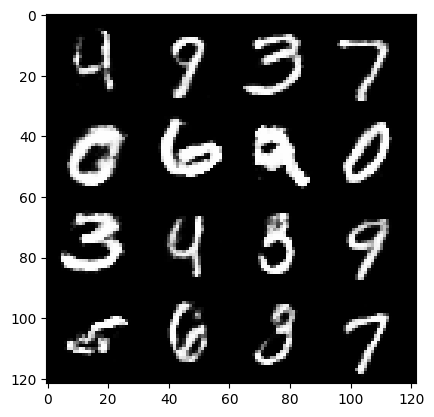

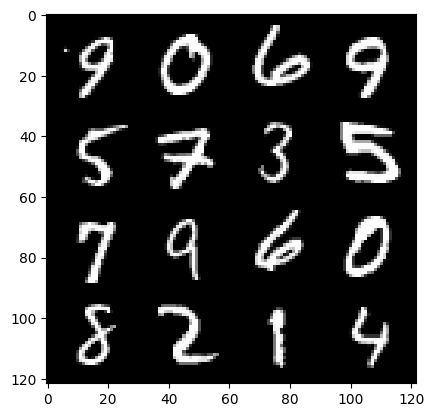

193: step 90900 / Gen loss: 0.7907362963755918 / disc_loss: 0.2825984953343869


  0%|          | 0/469 [00:00<?, ?it/s]

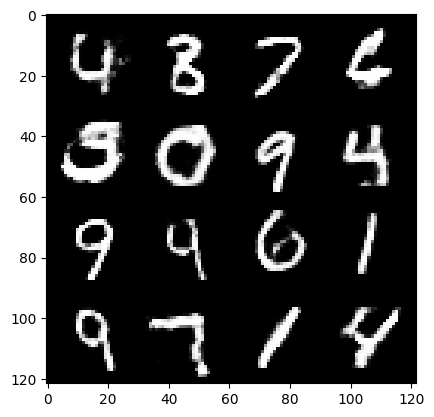

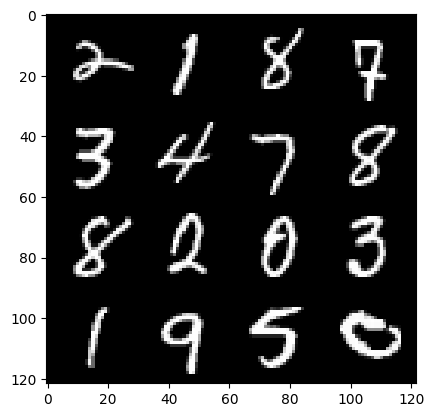

194: step 91200 / Gen loss: 0.7860108796755472 / disc_loss: 0.2904571515818437


  0%|          | 0/469 [00:00<?, ?it/s]

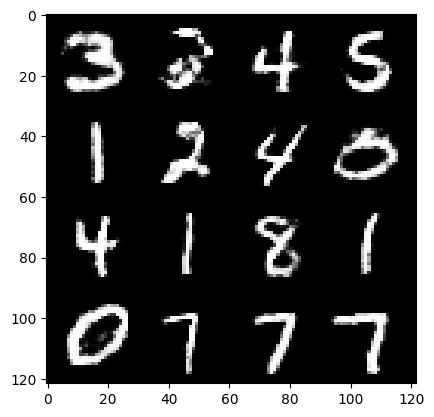

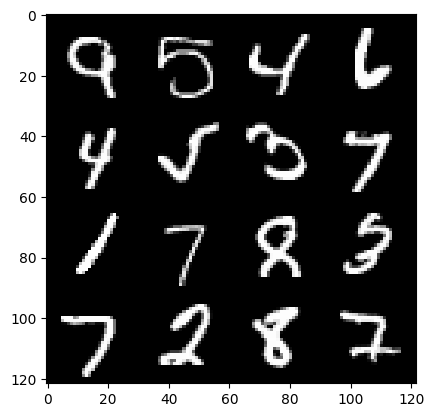

195: step 91500 / Gen loss: 0.7909557499488196 / disc_loss: 0.2842592307428517


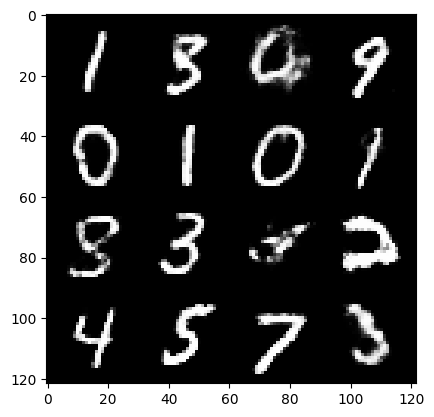

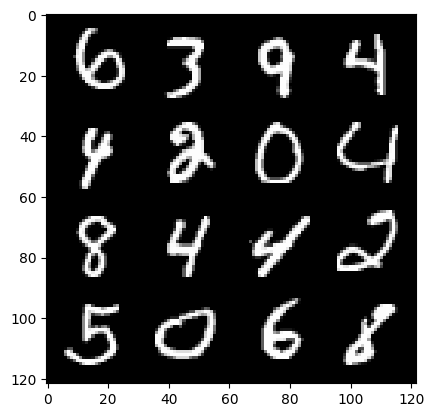

195: step 91800 / Gen loss: 0.7994369796911877 / disc_loss: 0.2804127458731336


  0%|          | 0/469 [00:00<?, ?it/s]

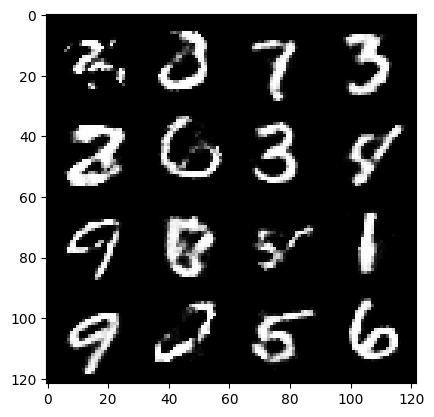

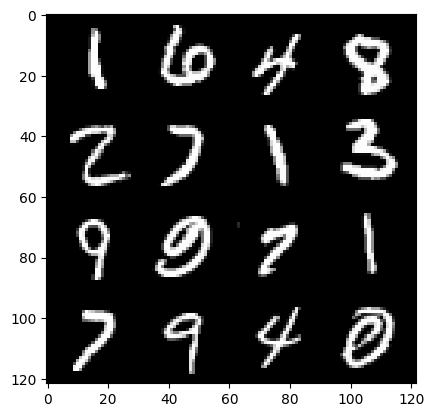

196: step 92100 / Gen loss: 0.7806392061710361 / disc_loss: 0.285141882499059


  0%|          | 0/469 [00:00<?, ?it/s]

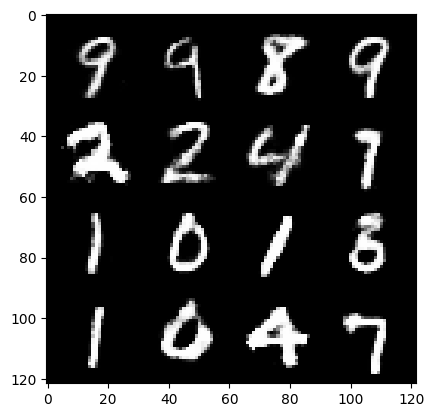

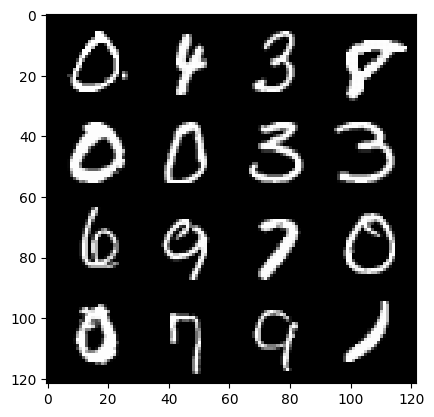

197: step 92400 / Gen loss: 0.7996408490339909 / disc_loss: 0.27816112359364825


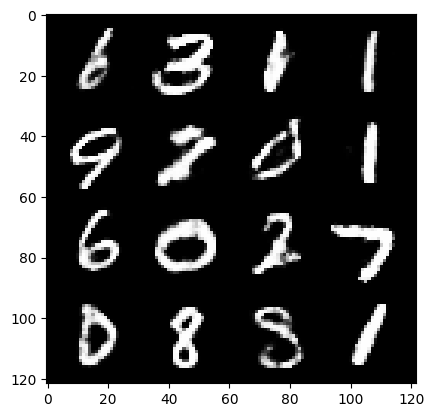

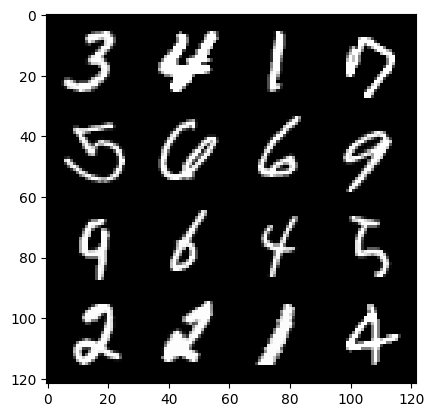

197: step 92700 / Gen loss: 0.798847435514132 / disc_loss: 0.27057723934451744


  0%|          | 0/469 [00:00<?, ?it/s]

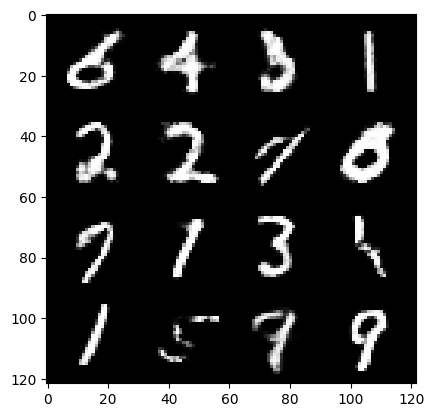

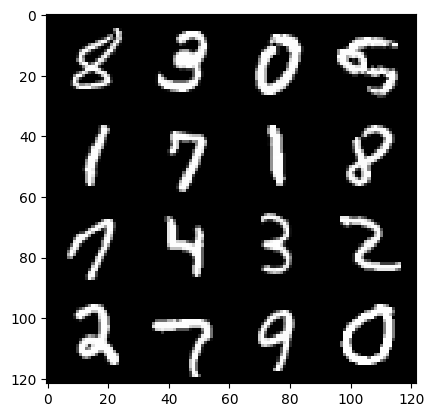

198: step 93000 / Gen loss: 0.7883187844355903 / disc_loss: 0.2860473797718685


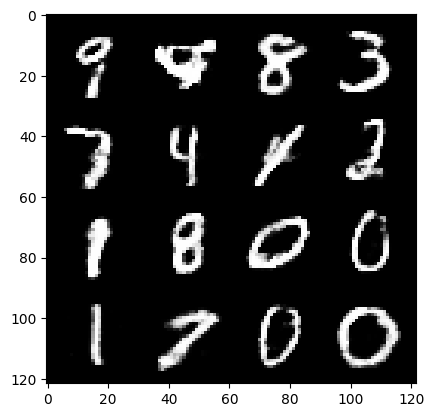

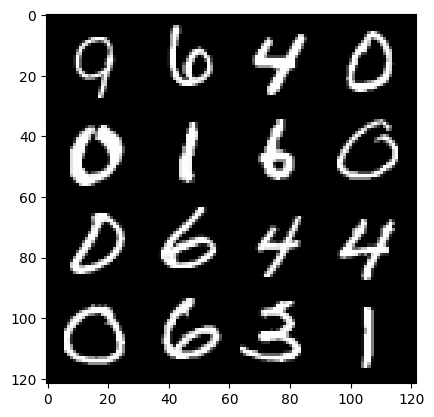

198: step 93300 / Gen loss: 0.7902667842308684 / disc_loss: 0.2770005598167577


  0%|          | 0/469 [00:00<?, ?it/s]

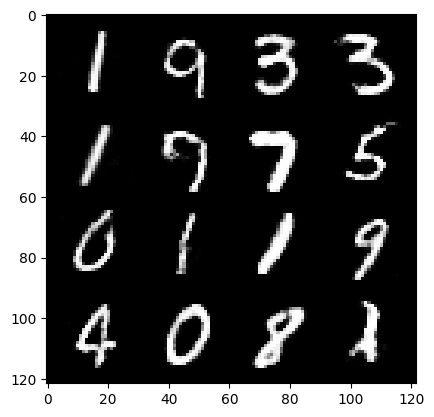

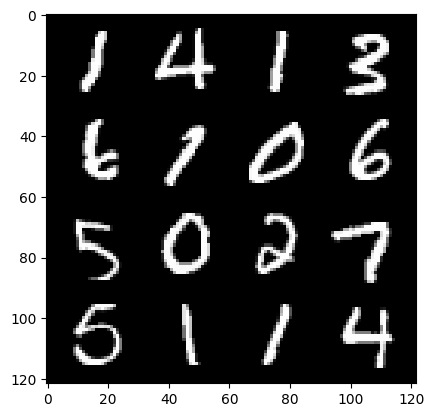

199: step 93600 / Gen loss: 0.7915348384777715 / disc_loss: 0.2727291507025561


  0%|          | 0/469 [00:00<?, ?it/s]

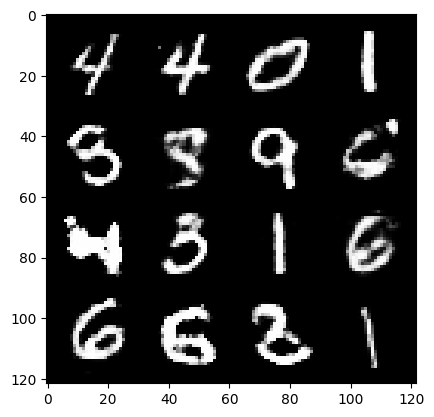

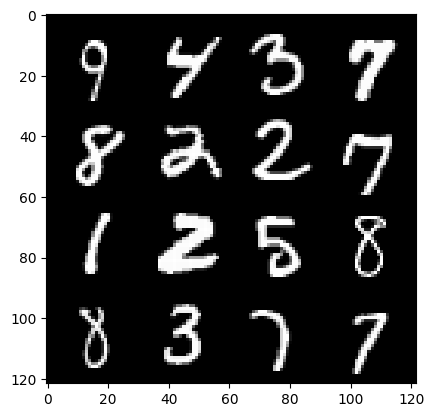

200: step 93900 / Gen loss: 0.7904163497686386 / disc_loss: 0.2786376897493999


In [ ]:
#Training Loop
#MNIST dataset has 60000 images
#60000/128 = 468.75 steps in each epoch
#each step will process 128 images which is the batch size
loss_func = nn.L1Loss()

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):

    #discriminator
    disc_opt.zero_grad()

    cur_bs=len(real)    # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs,-1)
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True) #back propagation
    disc_opt.step()

    #Generator
    gen_opt.zero_grad()
    gen_loss=calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)  #back propagation
    gen_opt.step()

    #Visualization and stats
    mean_disc_loss+= disc_loss.item()/info_step
    mean_gen_loss+= gen_loss.item()/info_step

    if cur_step % info_step ==0 and cur_step > 0:
      fake_noise = gen_noise(cur_bs,z_dim)
      fake=gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss,mean_disc_loss=0,0
    cur_step+=1